In [1]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets
from torch.utils.data import DataLoader 
from utils import Logger


In [2]:


def mnist_data():
  compose = transforms.Compose([transforms.ToTensor(), transforms.Normalize((.5),(.5))])
  out_dir = './dataset'
  return datasets.MNIST(root = out_dir,train = True, transform=compose, download = False)

data = mnist_data()
data_loader = torch.utils.data.DataLoader(data, batch_size = 100, shuffle = True)
num_batches = len(data_loader)

for images, labels in data_loader:
    print("Batch shape:", images.shape)
    break

print("Number of batches =", num_batches)


Batch shape: torch.Size([100, 1, 28, 28])
Number of batches = 600


In [3]:
class DiscriminatorNet(torch.nn.Module):
  def __init__(self):
    super(DiscriminatorNet,self).__init__()
    n_features = 784
    n_out = 1

    self.hidden0 = nn.Sequential(nn.Linear(n_features,1024),nn.LeakyReLU(0.2),nn.Dropout(0.3))
    self.hidden1 = nn.Sequential(nn.Linear(1024, 512),nn.LeakyReLU(0.2),nn.Dropout(0.3))
    self.hidden2 = nn.Sequential(nn.Linear(512, 256),nn.LeakyReLU(0.2),nn.Dropout(0.3))
    self.out = nn.Sequential(torch.nn.Linear(256,n_out),nn.Sigmoid())
  def forward(self, x):
    x = self.hidden0(x)
    x = self.hidden1(x)
    x = self.hidden2(x)
    x = self.out(x)
    return x

In [4]:
class GeneratorNet(torch.nn.Module):
  def __init__(self):
    super(GeneratorNet,self).__init__()
    n_features = 100
    n_out = 784
    self.hidden0 = nn.Sequential(nn.Linear(n_features, 256),nn.LeakyReLU(0.2))
    self.hidden1 = nn.Sequential(nn.Linear(256,512),nn.LeakyReLU(0.2))
    self.hidden2 = nn.Sequential(nn.Linear(512,1024),nn.LeakyReLU(0.2))
    self.out = nn.Sequential(nn.Linear(1024,n_out),nn.Tanh())
  def forward(self,x):
    x = self.hidden0(x)
    x = self.hidden1(x)
    x = self.hidden2(x)
    x = self.out(x)
    return x

In [5]:
def noise(size):
  n = Variable(torch.randn(size, 100))
  return n

def images_to_vectors(images):
  return images.view(images.size(0),784)

def vectors_to_images(vectors):
  return vectors.view(vectors.size(0),1,28,28)

def ones_target(size):
  data = Variable(torch.ones(size, 1))
  return data

def zeros_target(size):
  data = Variable(torch.zeros(size, 1))
  return data

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

discriminator = DiscriminatorNet().to(device)
generator = GeneratorNet().to(device)
d_optimizer = optim.Adam(discriminator.parameters(), lr = 0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)
loss = nn.BCELoss()


Using device: cuda


In [7]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = loss(prediction_real, ones_target(N).to(device) )
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = loss(prediction_fake, zeros_target(N).to(device))
    error_fake.backward()
    
    optimizer.step()
    return error_real + error_fake, prediction_real, prediction_fake
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    optimizer.zero_grad()
    prediction = discriminator(fake_data)
    error = loss(prediction, ones_target(N).to(device))
    error.backward()
    optimizer.step()
    return error

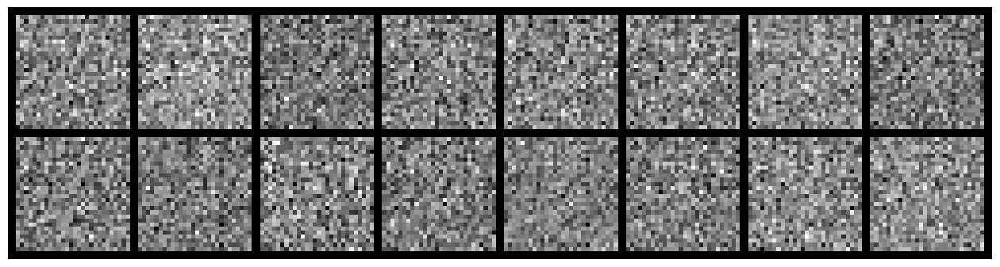

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.4013, Generator Loss: 0.6668
D(x): 0.5058, D(G(z)): 0.5129


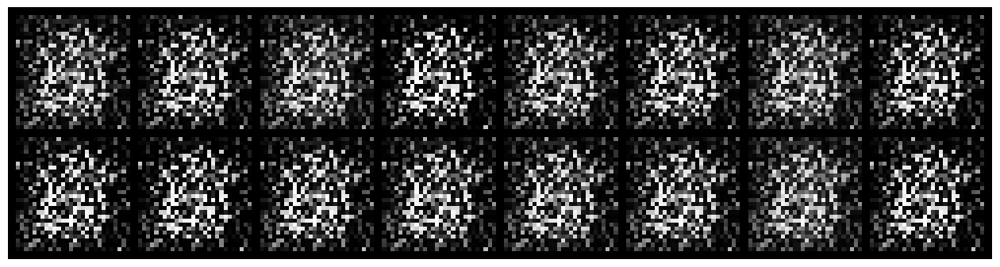

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.6783, Generator Loss: 6.6366
D(x): 0.7602, D(G(z)): 0.2010


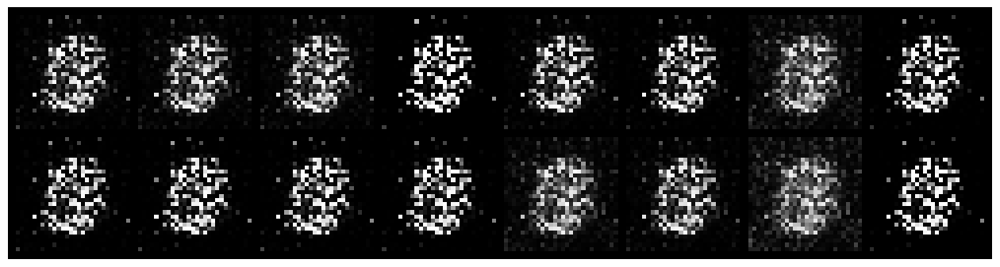

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 0.4999, Generator Loss: 7.8696
D(x): 0.8666, D(G(z)): 0.1303


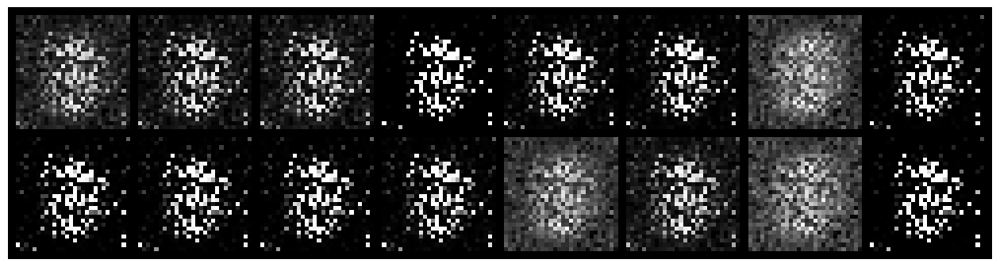

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 0.6830, Generator Loss: 4.6093
D(x): 0.8963, D(G(z)): 0.2410


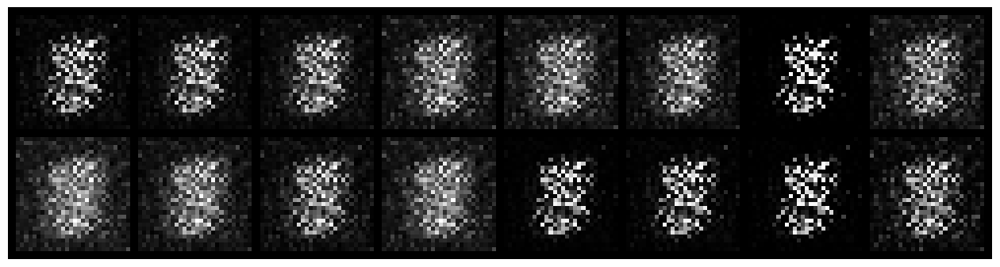

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 0.9070, Generator Loss: 4.4207
D(x): 0.7324, D(G(z)): 0.2521


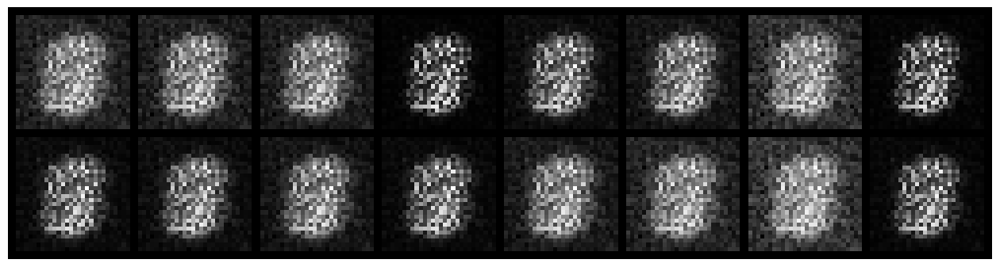

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 0.2342, Generator Loss: 5.4174
D(x): 0.9305, D(G(z)): 0.1185


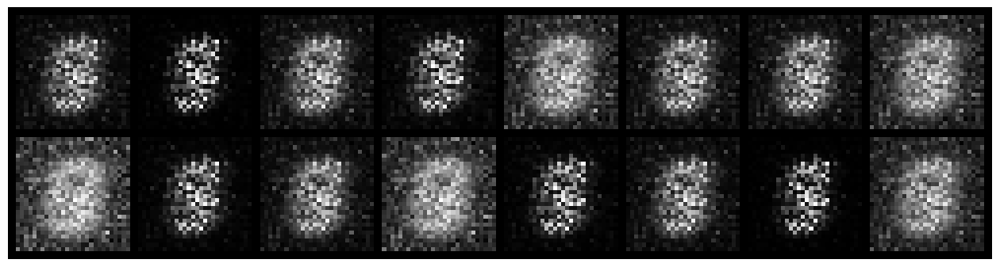

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 0.0738, Generator Loss: 6.1062
D(x): 0.9609, D(G(z)): 0.0275


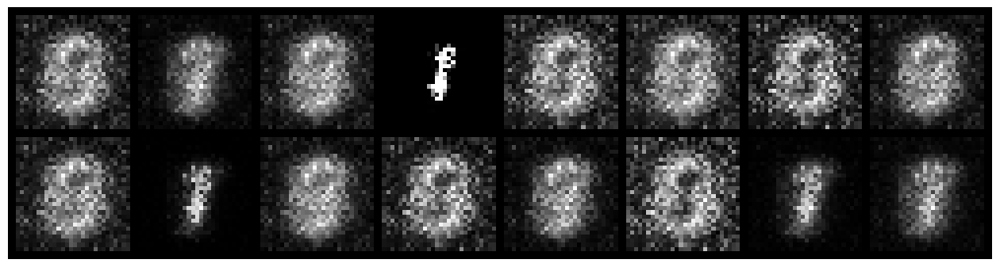

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.3055, Generator Loss: 3.3143
D(x): 0.9018, D(G(z)): 0.1238


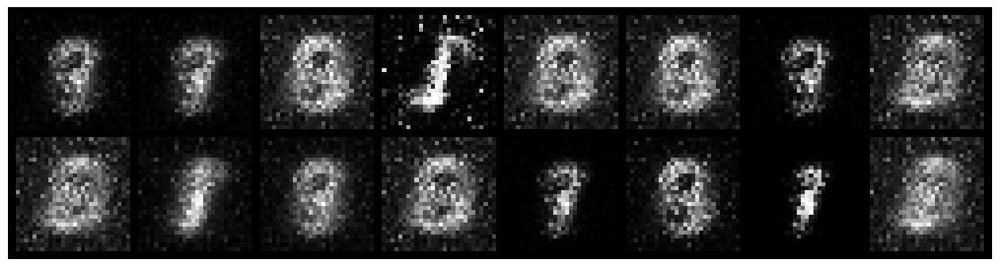

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.1995, Generator Loss: 5.6569
D(x): 0.9390, D(G(z)): 0.0692


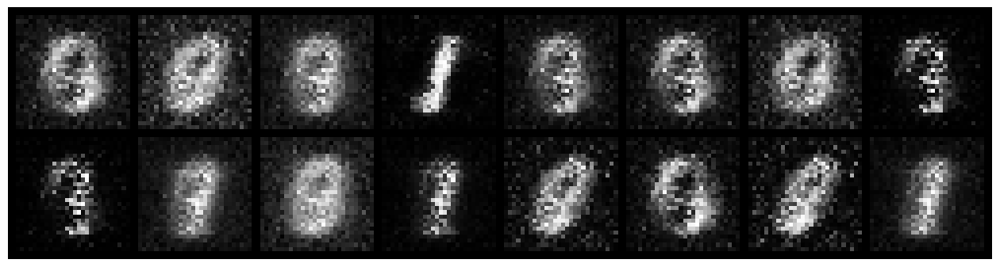

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.3286, Generator Loss: 2.8640
D(x): 0.8754, D(G(z)): 0.1068


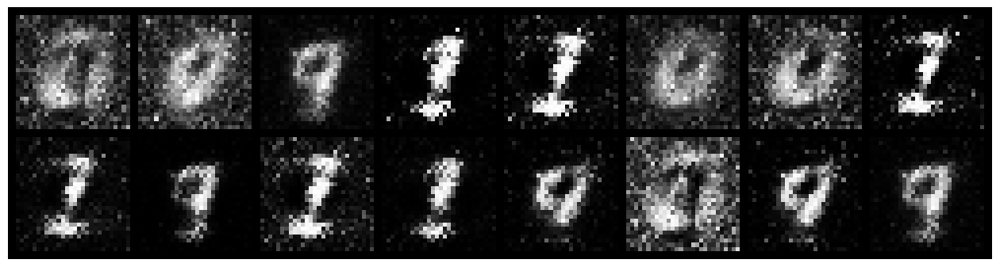

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.4048, Generator Loss: 3.9977
D(x): 0.8589, D(G(z)): 0.0733


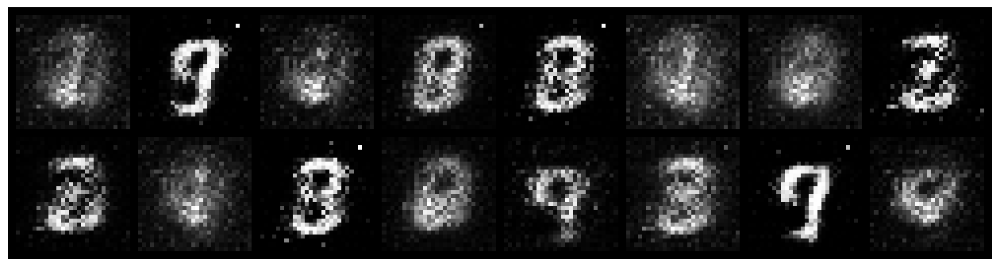

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.5232, Generator Loss: 3.5238
D(x): 0.8056, D(G(z)): 0.0613


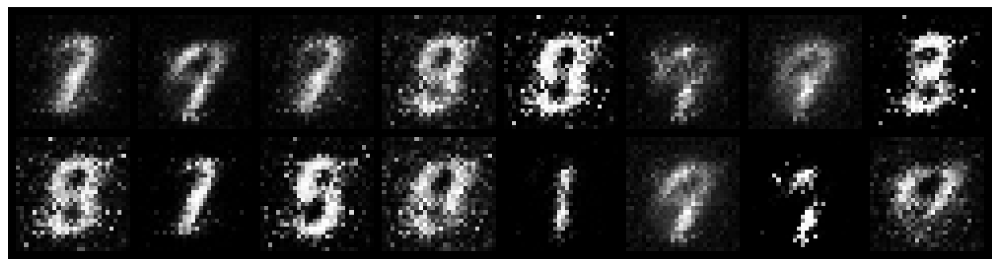

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.4445, Generator Loss: 2.9230
D(x): 0.8377, D(G(z)): 0.1137


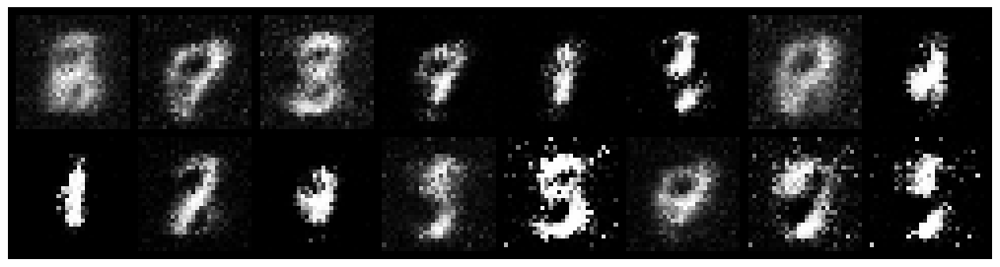

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.4431, Generator Loss: 2.3755
D(x): 0.8873, D(G(z)): 0.1964


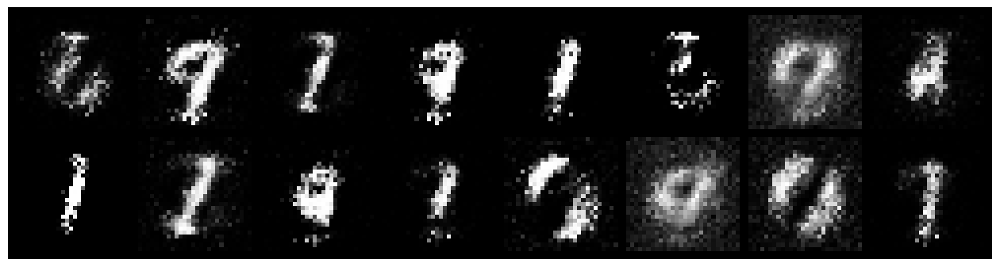

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.3346, Generator Loss: 3.8049
D(x): 0.8588, D(G(z)): 0.0784


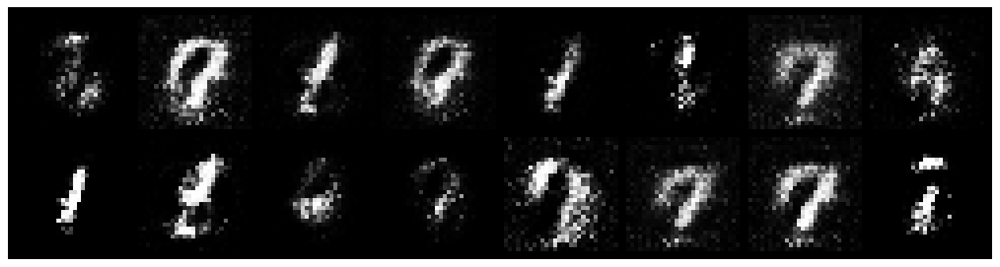

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.3870, Generator Loss: 3.0868
D(x): 0.9417, D(G(z)): 0.1893


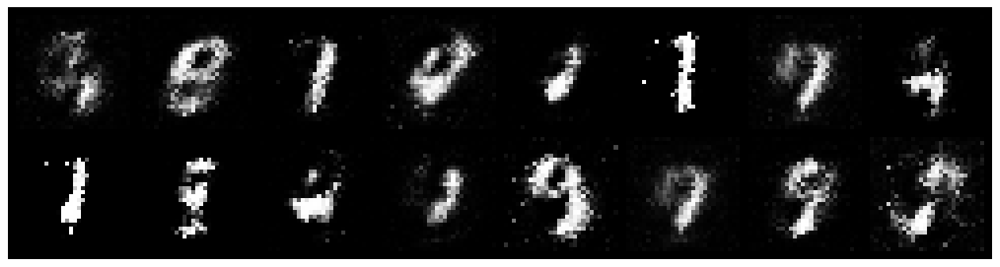

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.2515, Generator Loss: 4.3044
D(x): 0.8989, D(G(z)): 0.0634


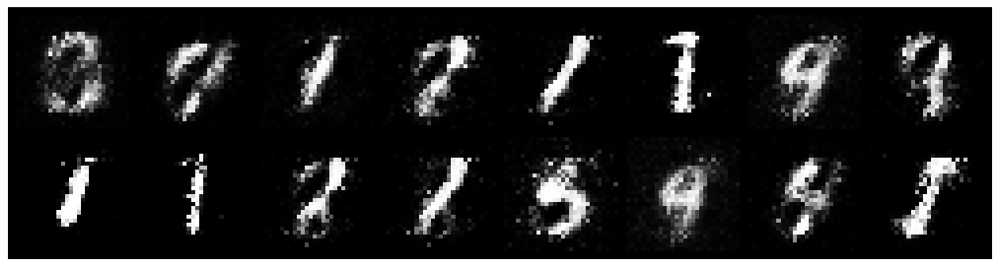

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.4297, Generator Loss: 2.9459
D(x): 0.8559, D(G(z)): 0.1384


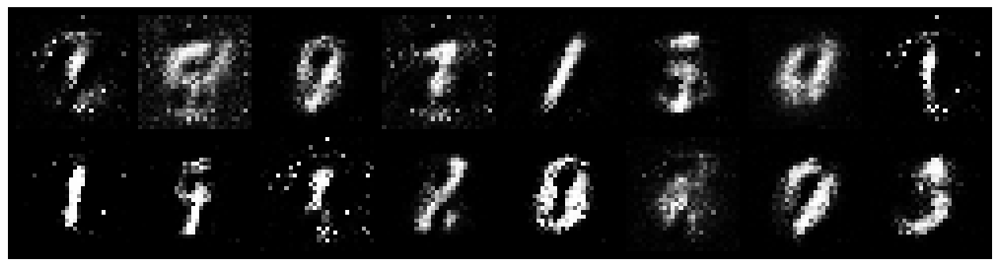

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.7214, Generator Loss: 2.9719
D(x): 0.7337, D(G(z)): 0.0954


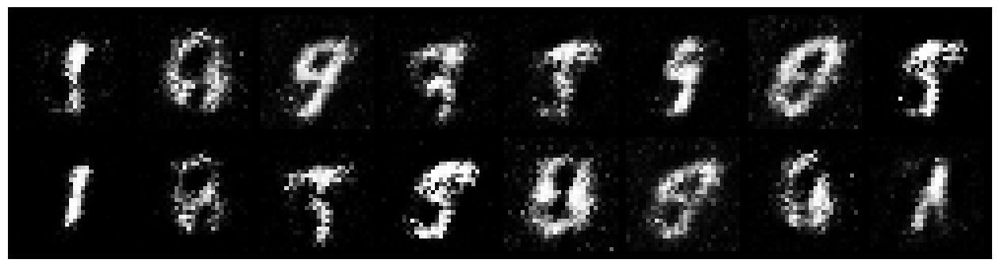

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.7610, Generator Loss: 2.3470
D(x): 0.7419, D(G(z)): 0.1726


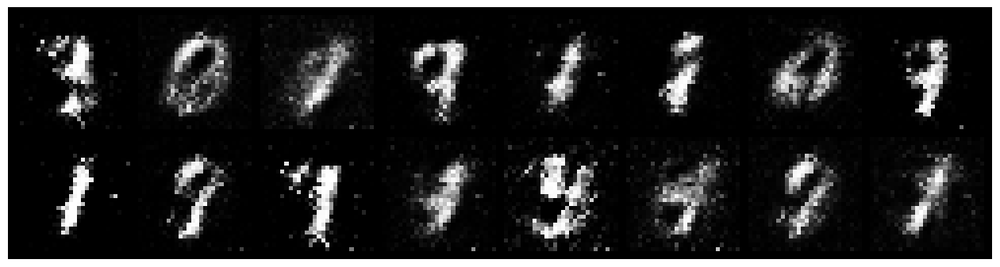

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.5968, Generator Loss: 2.5080
D(x): 0.7899, D(G(z)): 0.1784


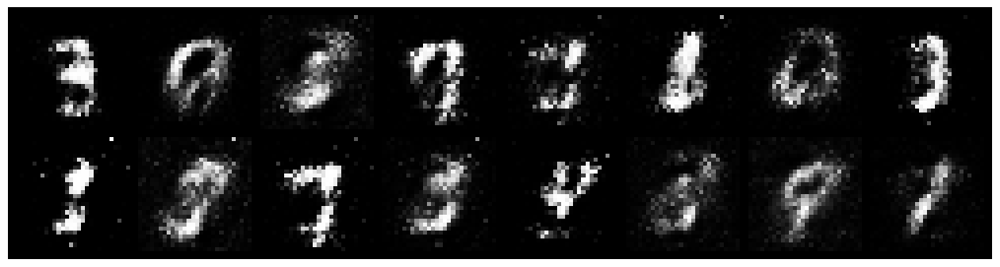

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.7374, Generator Loss: 2.8727
D(x): 0.8091, D(G(z)): 0.2300


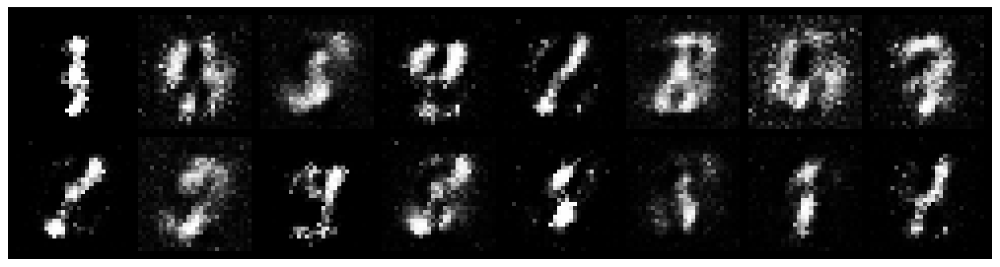

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.4937, Generator Loss: 2.5685
D(x): 0.8048, D(G(z)): 0.1267


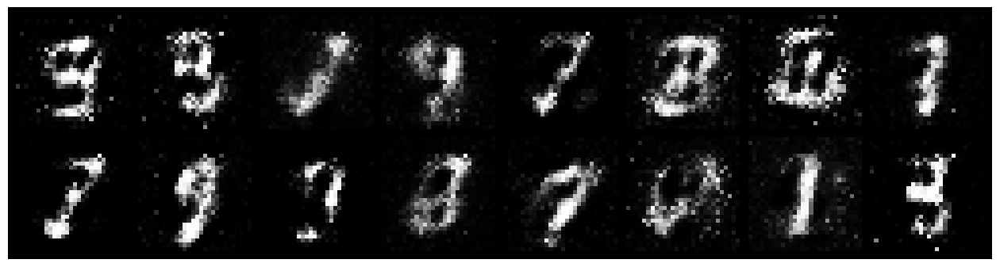

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.6531, Generator Loss: 2.4809
D(x): 0.7308, D(G(z)): 0.1354


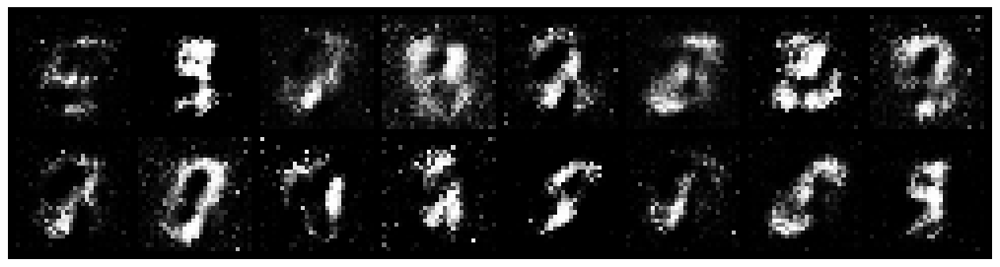

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.6956, Generator Loss: 2.2330
D(x): 0.8126, D(G(z)): 0.2563


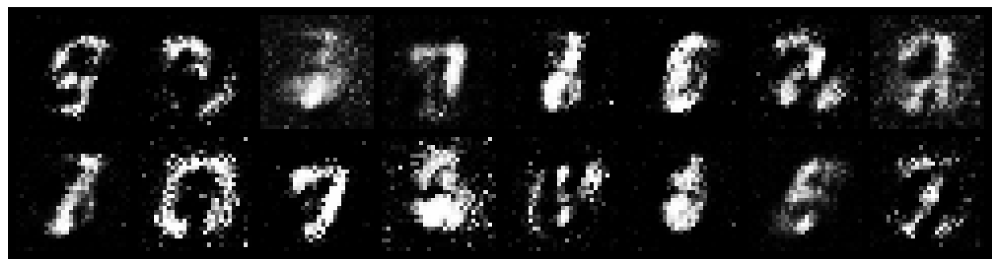

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.8174, Generator Loss: 2.1853
D(x): 0.7936, D(G(z)): 0.2328


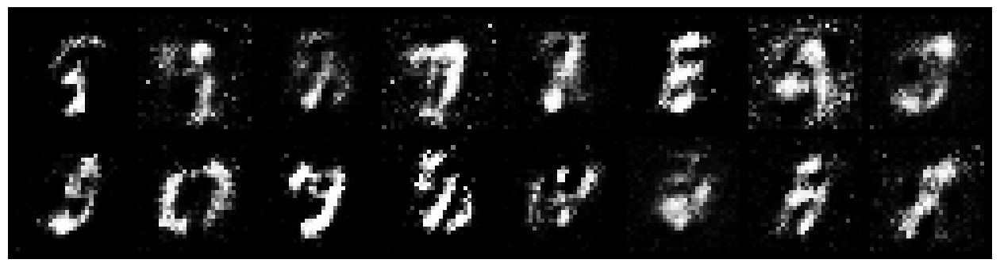

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.8450, Generator Loss: 2.1382
D(x): 0.7379, D(G(z)): 0.2314


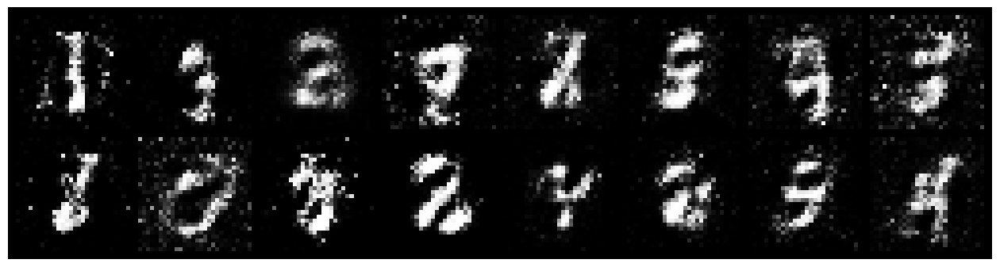

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.7266, Generator Loss: 2.5018
D(x): 0.7536, D(G(z)): 0.1832


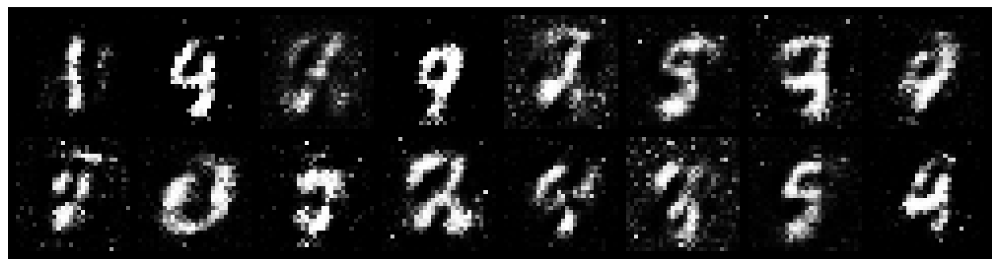

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.5954, Generator Loss: 2.0794
D(x): 0.7658, D(G(z)): 0.1957


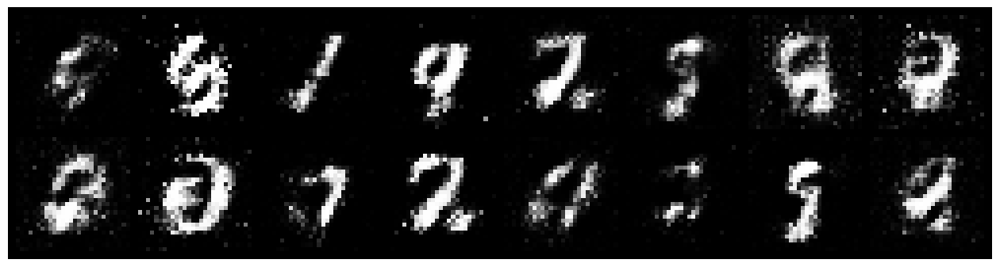

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.8098, Generator Loss: 1.6912
D(x): 0.7155, D(G(z)): 0.2245


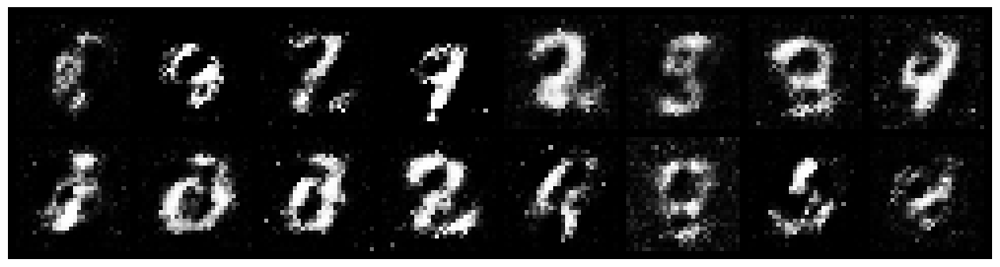

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.9148, Generator Loss: 1.8761
D(x): 0.7404, D(G(z)): 0.3041


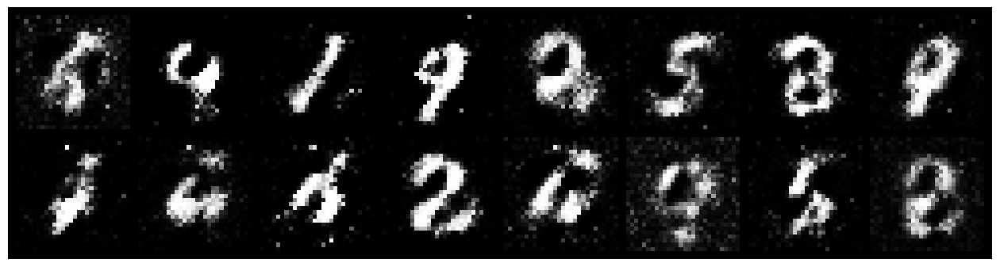

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.8824, Generator Loss: 2.1440
D(x): 0.7467, D(G(z)): 0.3058


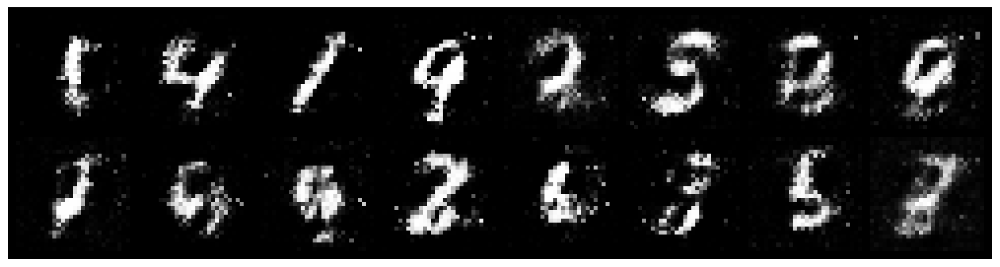

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.7301, Generator Loss: 2.4180
D(x): 0.7696, D(G(z)): 0.2234


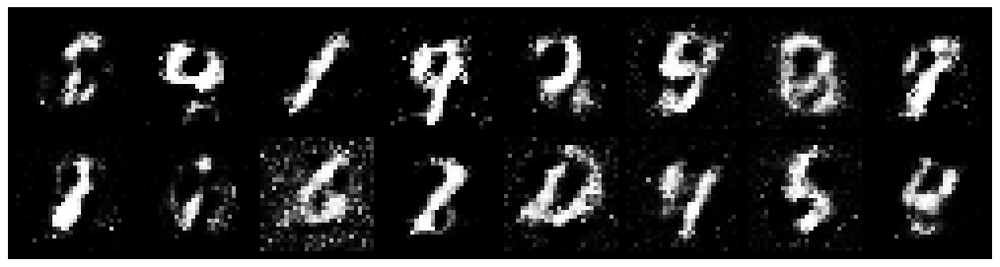

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.8602, Generator Loss: 1.9493
D(x): 0.7502, D(G(z)): 0.2779


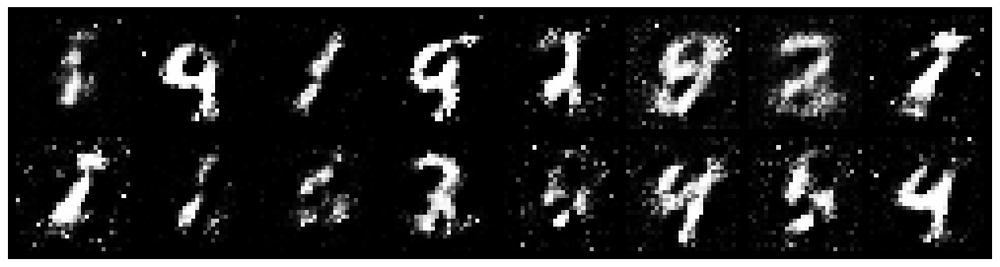

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 1.0647, Generator Loss: 1.3071
D(x): 0.6479, D(G(z)): 0.3035


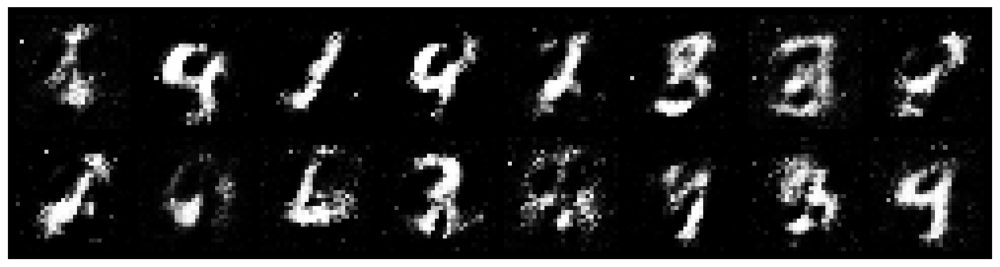

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 0.7369, Generator Loss: 2.3390
D(x): 0.7529, D(G(z)): 0.2248


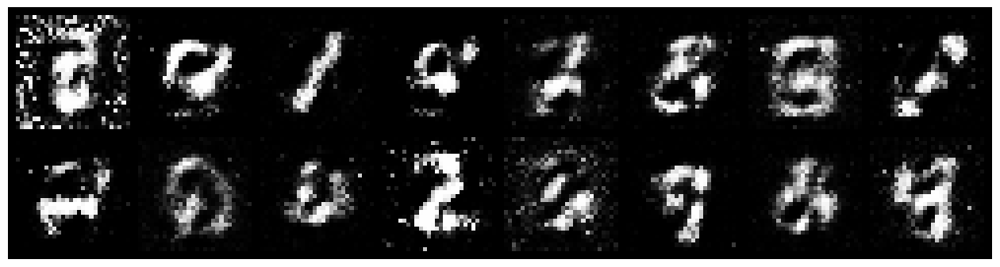

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 1.0261, Generator Loss: 1.5042
D(x): 0.7052, D(G(z)): 0.3640


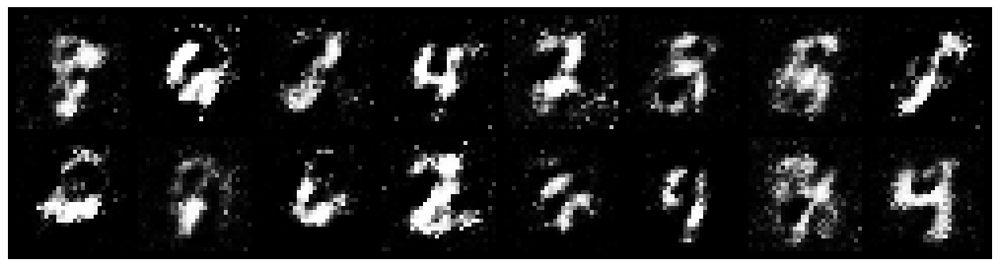

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.9701, Generator Loss: 1.6837
D(x): 0.7389, D(G(z)): 0.3401


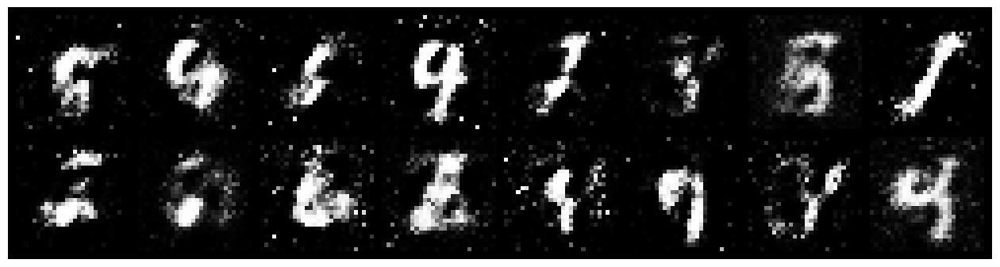

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.9454, Generator Loss: 2.0515
D(x): 0.6482, D(G(z)): 0.2413


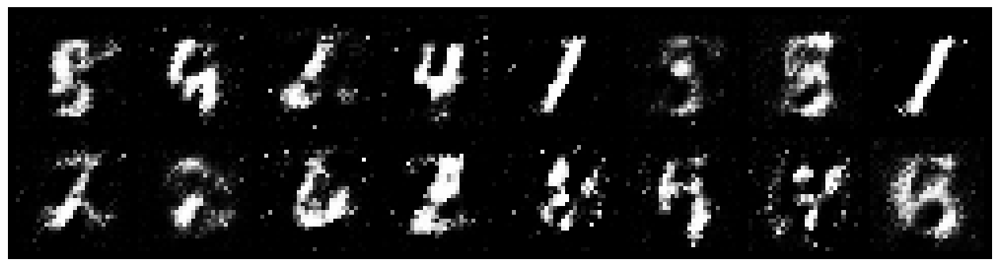

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 0.9674, Generator Loss: 1.5745
D(x): 0.7229, D(G(z)): 0.3757


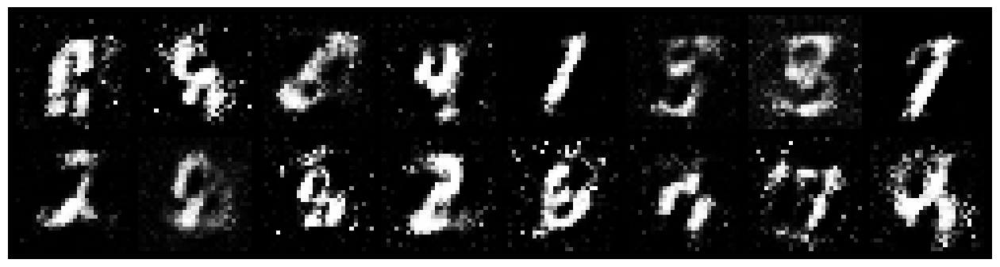

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 0.9940, Generator Loss: 2.0384
D(x): 0.6987, D(G(z)): 0.2938


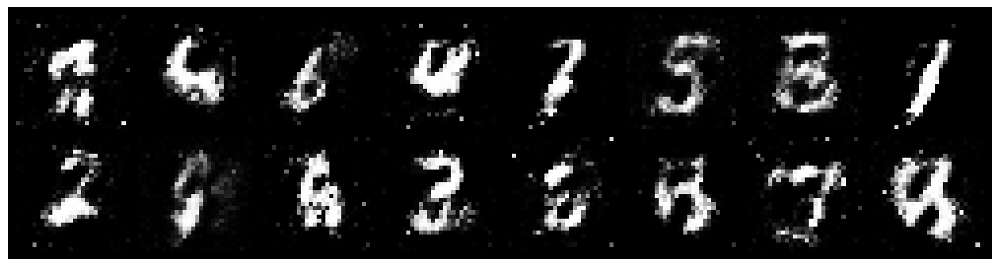

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 0.9432, Generator Loss: 1.7144
D(x): 0.7111, D(G(z)): 0.3138


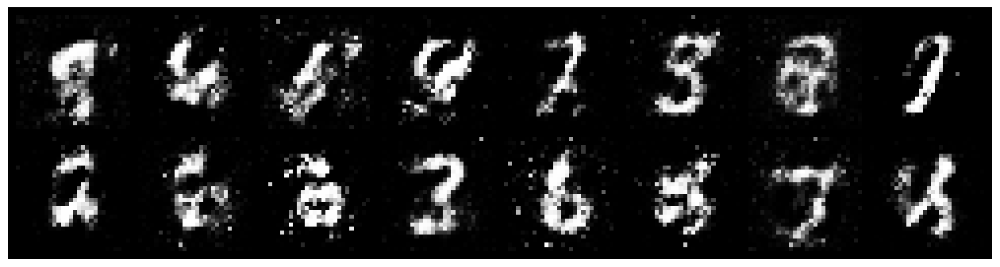

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.8034, Generator Loss: 1.6830
D(x): 0.7771, D(G(z)): 0.3270


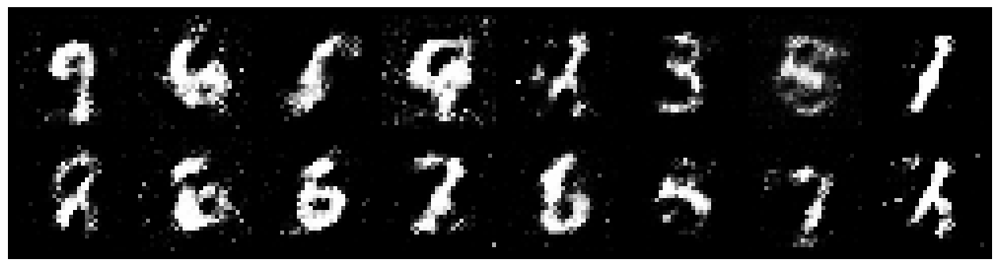

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 0.8584, Generator Loss: 1.6456
D(x): 0.6692, D(G(z)): 0.2663


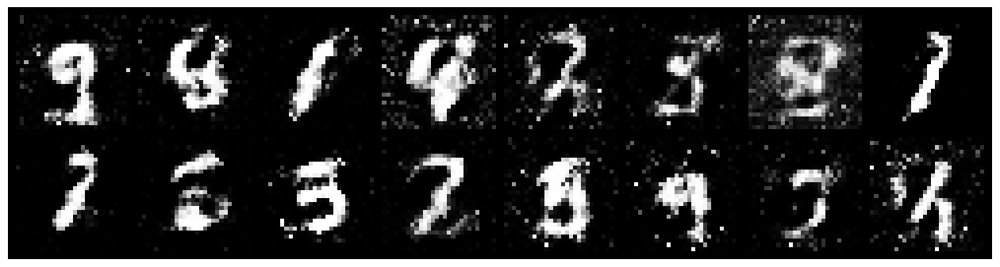

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.9986, Generator Loss: 1.5326
D(x): 0.6523, D(G(z)): 0.2709


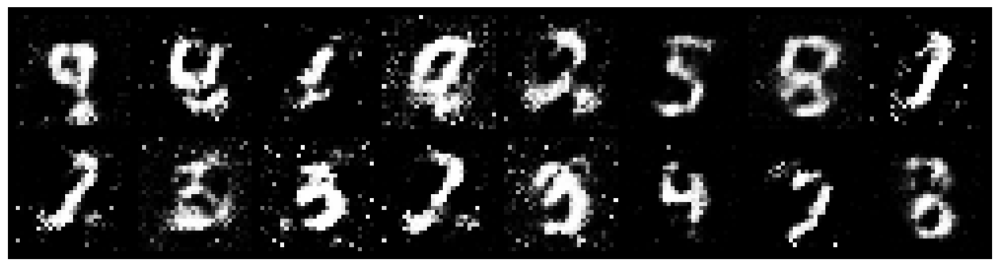

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 1.0394, Generator Loss: 1.8272
D(x): 0.6536, D(G(z)): 0.2948


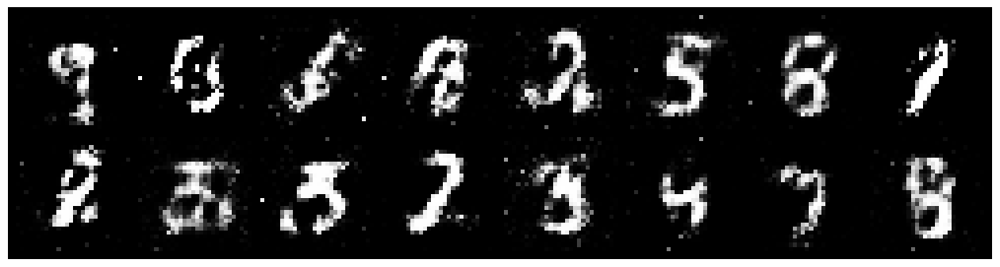

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 0.9958, Generator Loss: 1.5846
D(x): 0.6486, D(G(z)): 0.3247


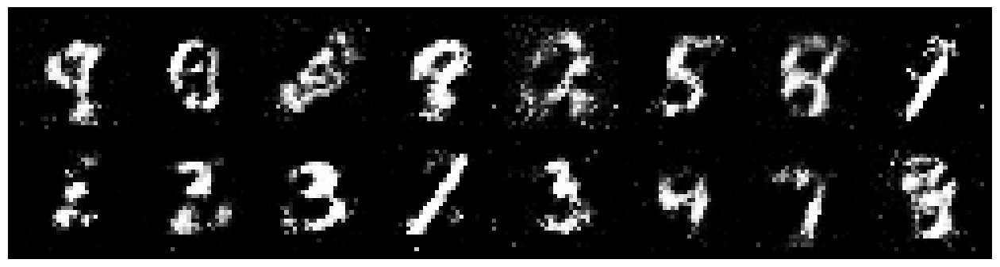

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 0.9137, Generator Loss: 1.6205
D(x): 0.7238, D(G(z)): 0.3332


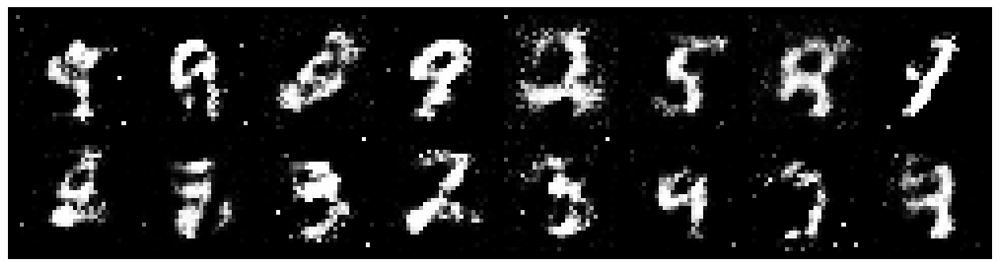

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.9453, Generator Loss: 1.7832
D(x): 0.6618, D(G(z)): 0.3073


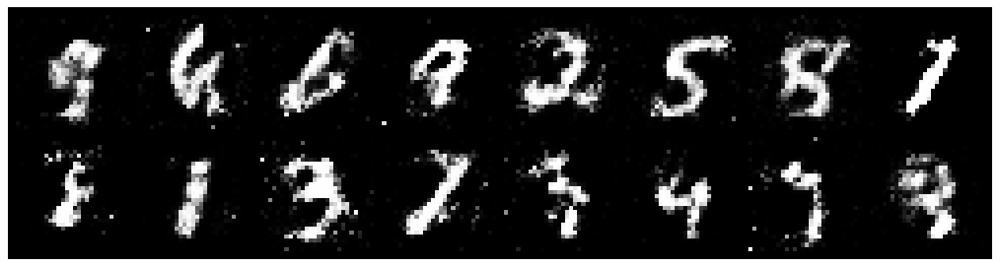

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 0.8862, Generator Loss: 1.8021
D(x): 0.7009, D(G(z)): 0.2793


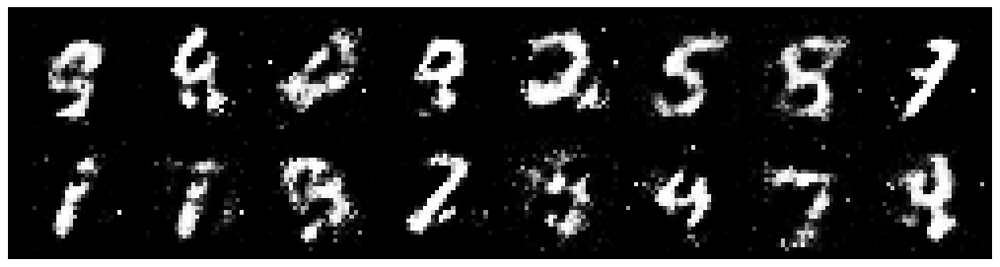

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.9859, Generator Loss: 1.4619
D(x): 0.6075, D(G(z)): 0.2336


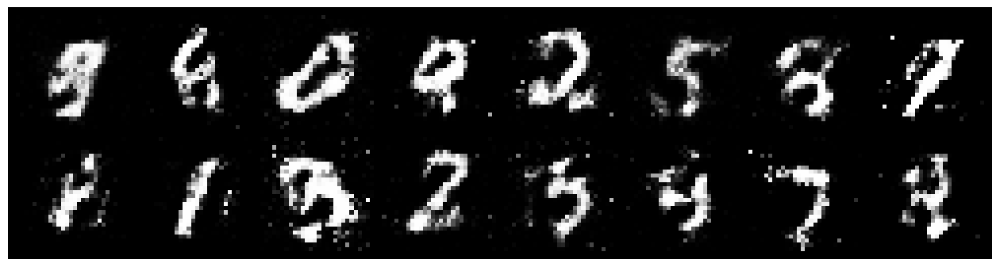

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 0.9457, Generator Loss: 1.2717
D(x): 0.6897, D(G(z)): 0.3500


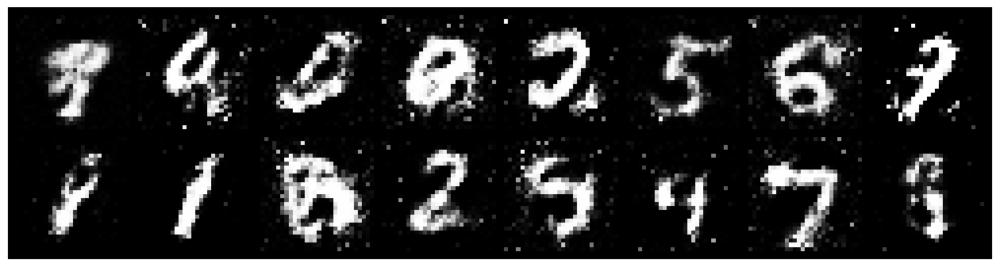

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 1.0907, Generator Loss: 1.2137
D(x): 0.7513, D(G(z)): 0.4345


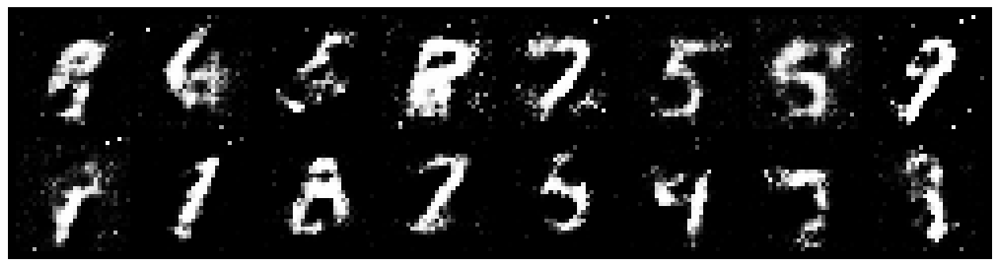

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 0.9734, Generator Loss: 1.9394
D(x): 0.6339, D(G(z)): 0.2492


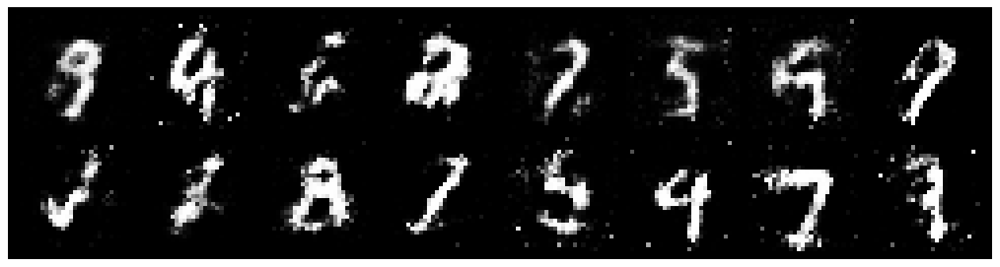

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 0.9449, Generator Loss: 1.9040
D(x): 0.7159, D(G(z)): 0.3429


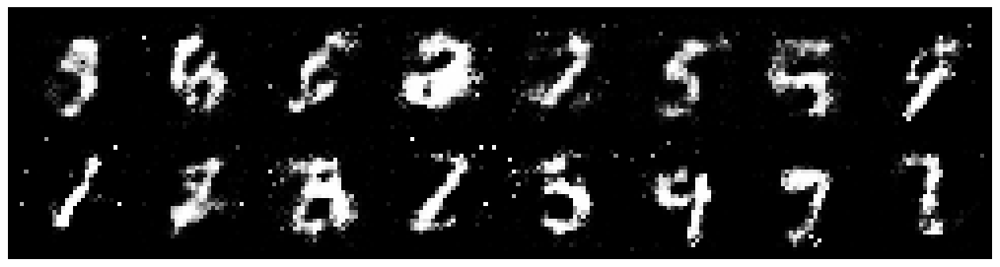

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 0.7965, Generator Loss: 1.5752
D(x): 0.7679, D(G(z)): 0.3058


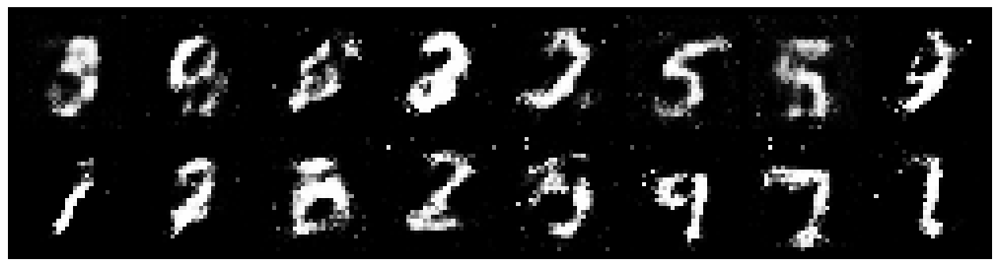

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 1.1586, Generator Loss: 1.1106
D(x): 0.6278, D(G(z)): 0.3750


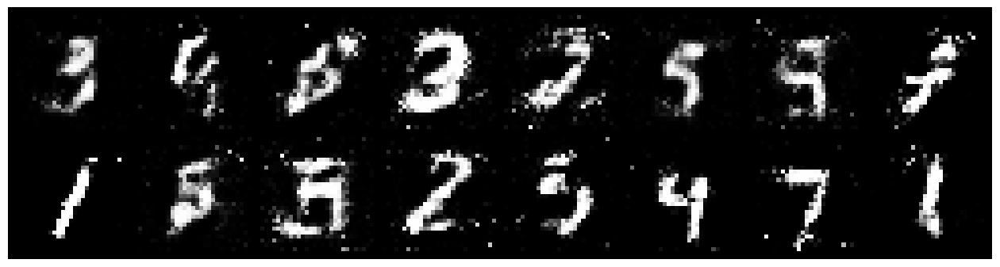

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 1.1629, Generator Loss: 1.1458
D(x): 0.6016, D(G(z)): 0.3762


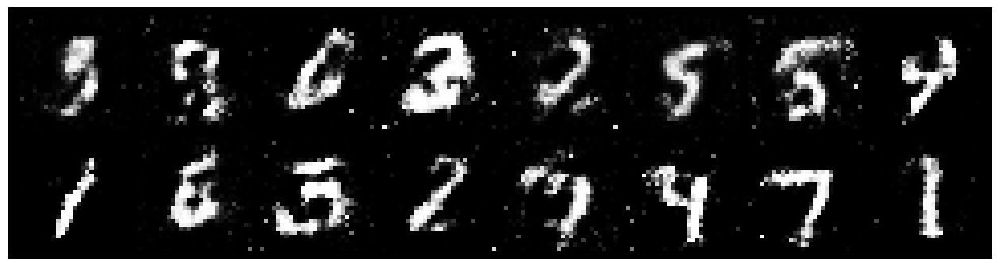

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 0.9240, Generator Loss: 1.5969
D(x): 0.7234, D(G(z)): 0.3039


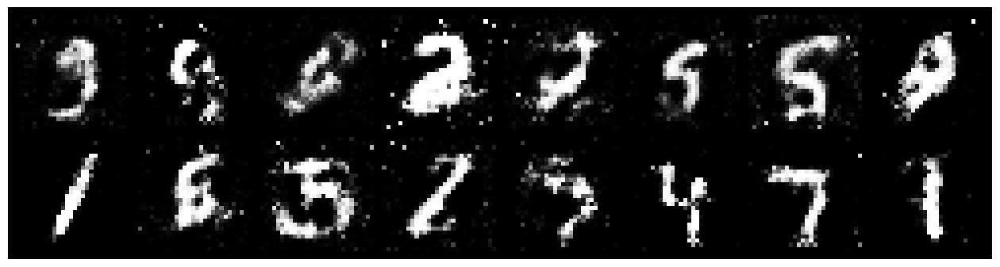

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 0.9468, Generator Loss: 1.5364
D(x): 0.7018, D(G(z)): 0.3298


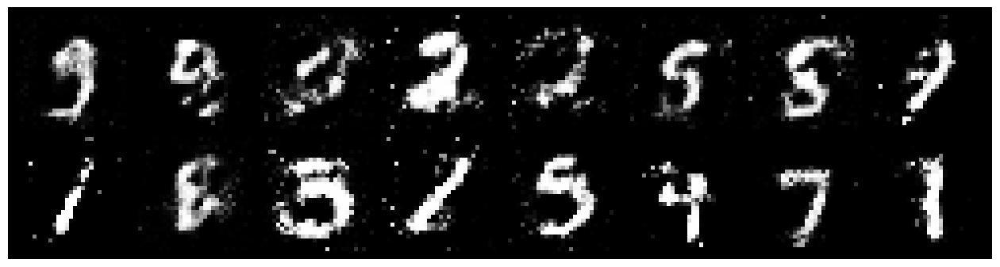

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 1.0115, Generator Loss: 1.4115
D(x): 0.7183, D(G(z)): 0.3742


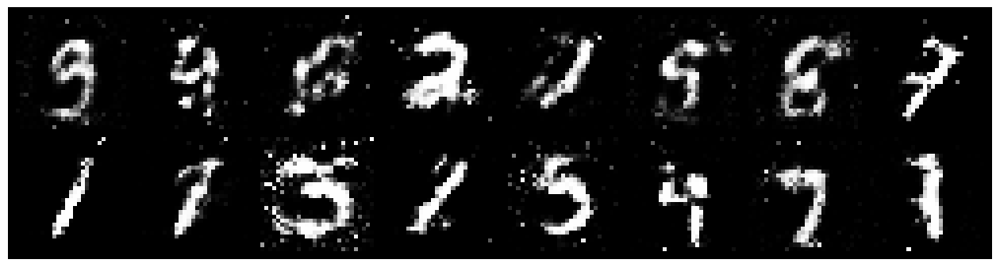

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 0.9984, Generator Loss: 1.6992
D(x): 0.6096, D(G(z)): 0.2800


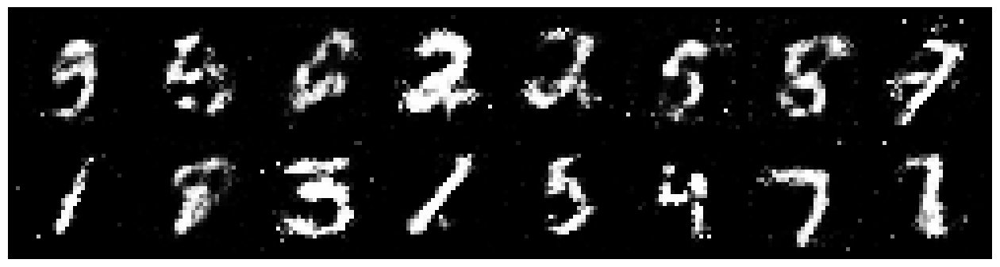

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 0.9424, Generator Loss: 1.4773
D(x): 0.6688, D(G(z)): 0.3199


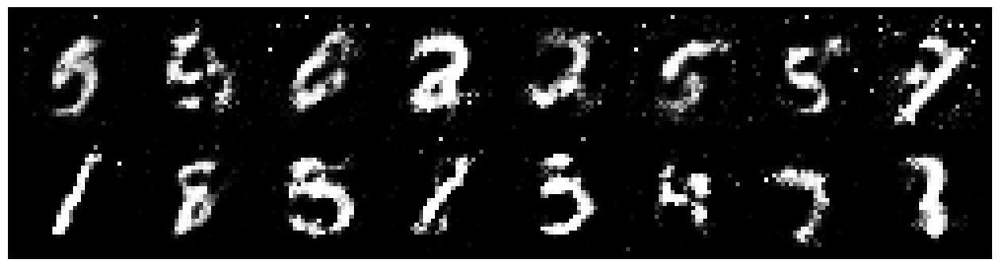

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 0.9788, Generator Loss: 1.2279
D(x): 0.6805, D(G(z)): 0.3562


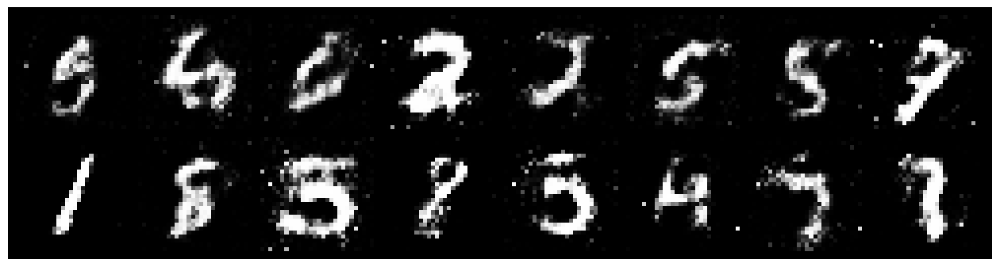

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 0.9717, Generator Loss: 1.6021
D(x): 0.6306, D(G(z)): 0.2985


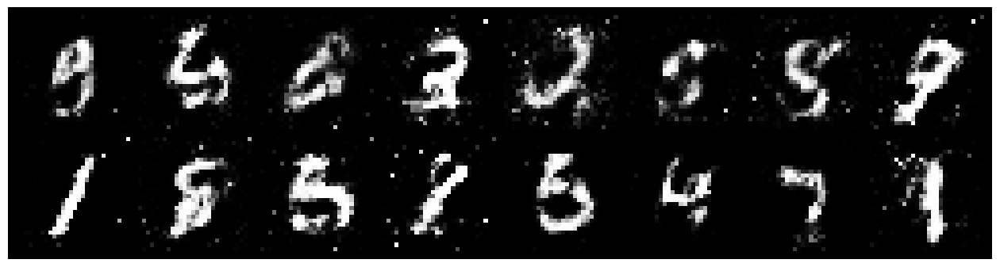

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 0.9802, Generator Loss: 1.0231
D(x): 0.6787, D(G(z)): 0.3620


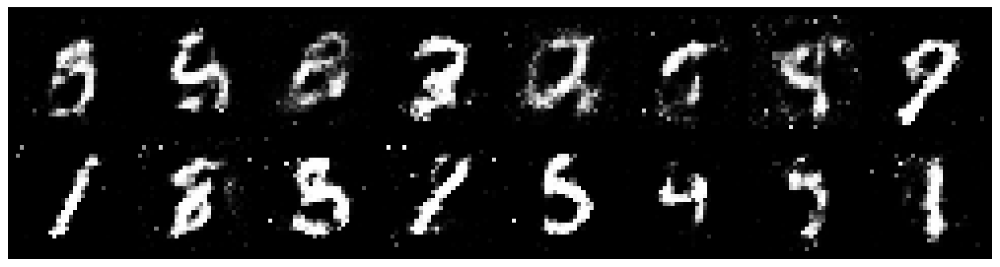

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 1.1702, Generator Loss: 1.2532
D(x): 0.6306, D(G(z)): 0.3509


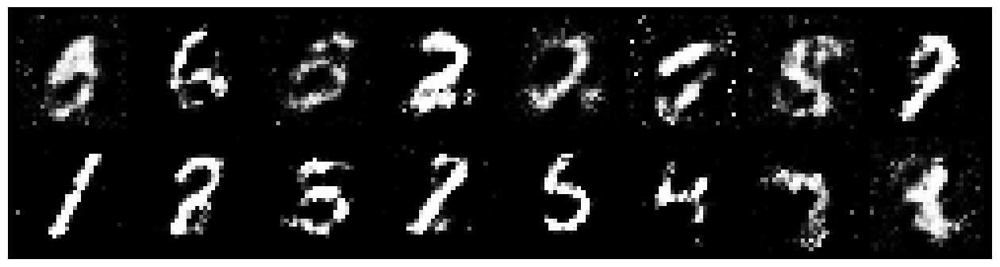

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 0.9783, Generator Loss: 1.1415
D(x): 0.6550, D(G(z)): 0.3351


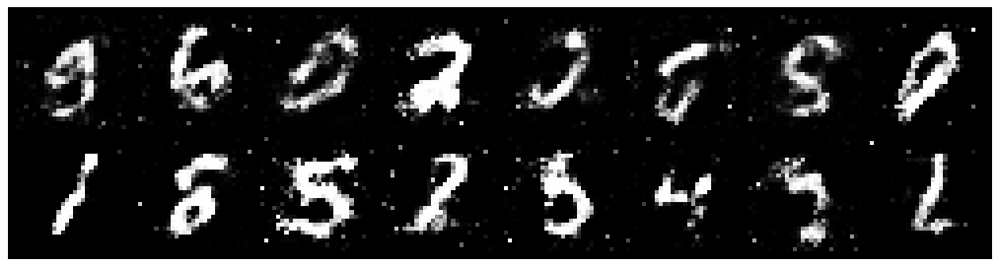

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.0653, Generator Loss: 1.1489
D(x): 0.6565, D(G(z)): 0.3531


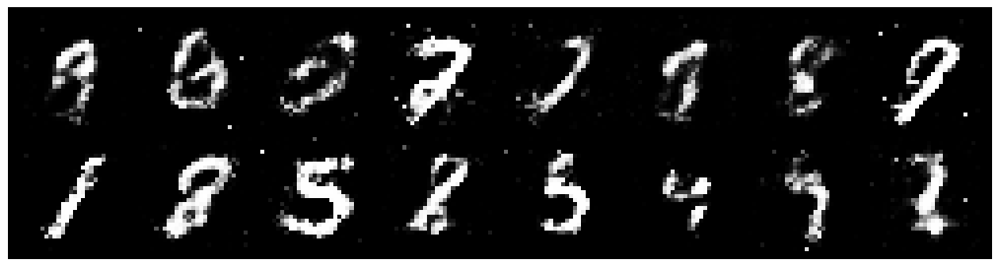

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 0.9667, Generator Loss: 1.3910
D(x): 0.6791, D(G(z)): 0.3164


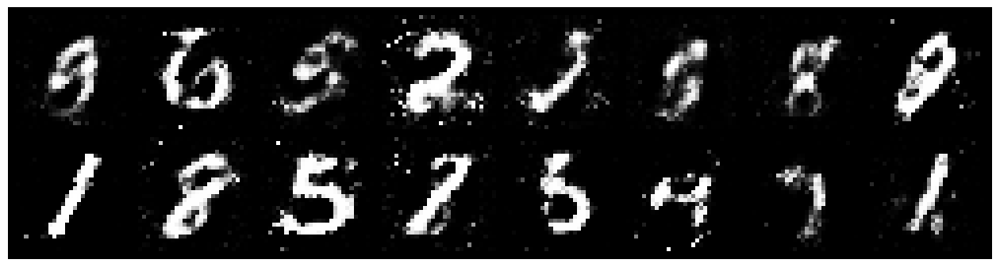

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 1.1269, Generator Loss: 1.3100
D(x): 0.6182, D(G(z)): 0.3786


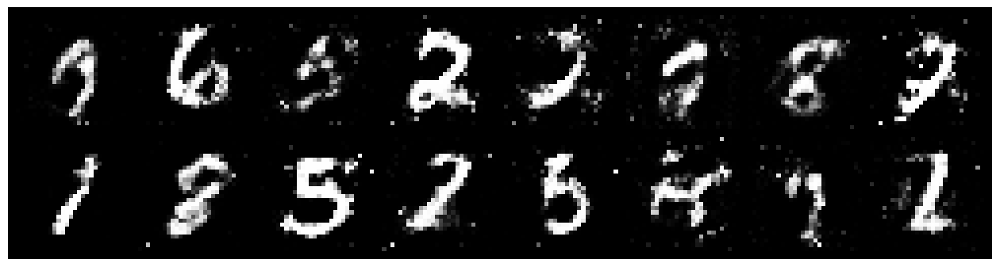

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 1.0829, Generator Loss: 1.0519
D(x): 0.6816, D(G(z)): 0.4170


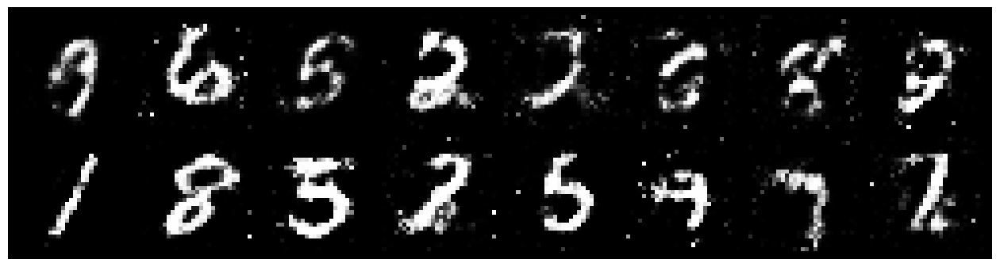

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.1144, Generator Loss: 1.2584
D(x): 0.5959, D(G(z)): 0.3616


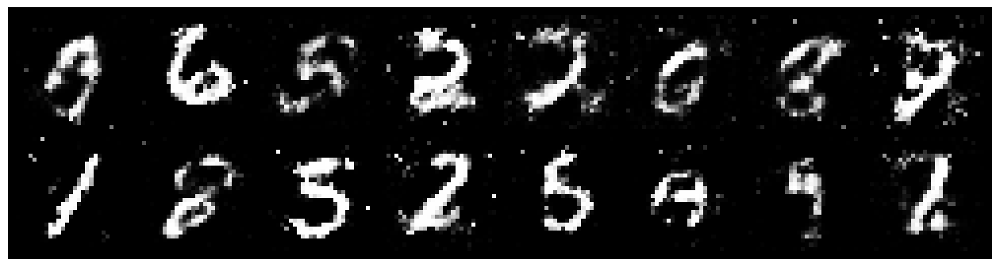

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 1.0234, Generator Loss: 1.3356
D(x): 0.6823, D(G(z)): 0.3840


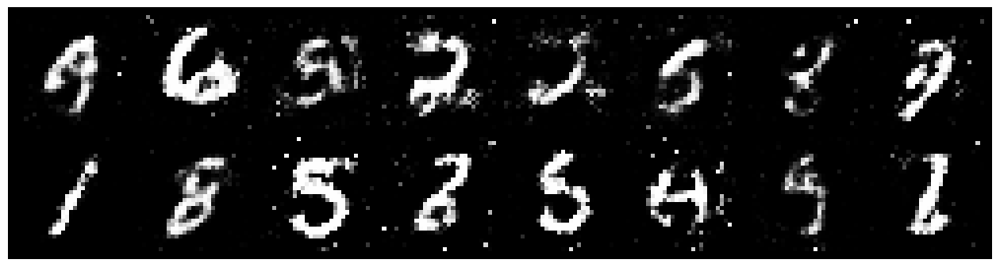

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.0535, Generator Loss: 1.7422
D(x): 0.6444, D(G(z)): 0.3406


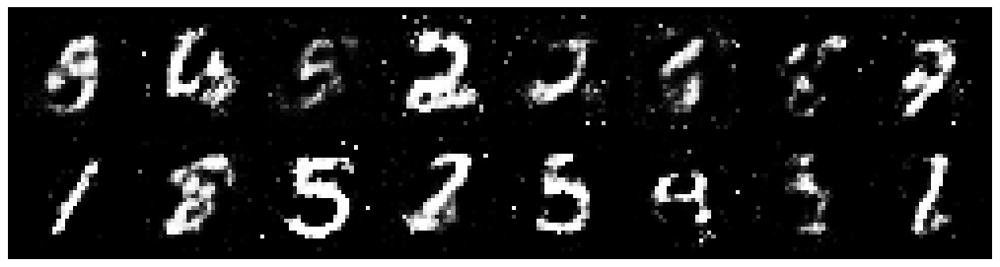

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 1.0768, Generator Loss: 1.4940
D(x): 0.6304, D(G(z)): 0.3650


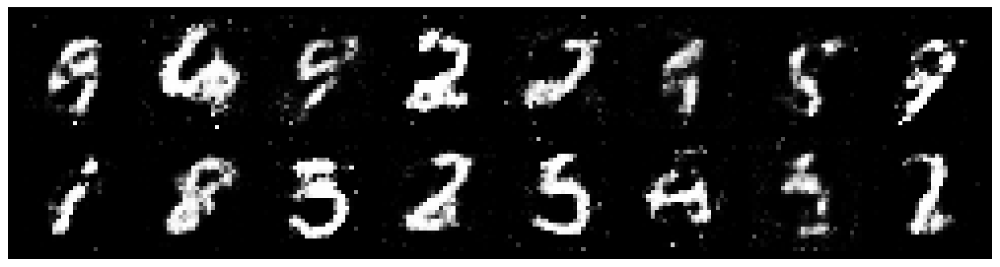

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 0.9663, Generator Loss: 1.2327
D(x): 0.6776, D(G(z)): 0.3600


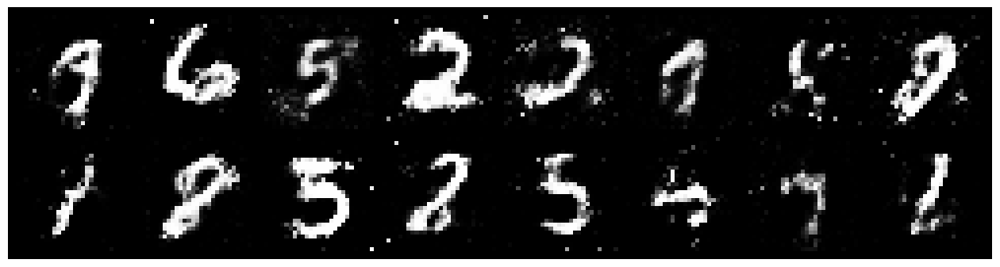

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.0386, Generator Loss: 1.1322
D(x): 0.6095, D(G(z)): 0.3543


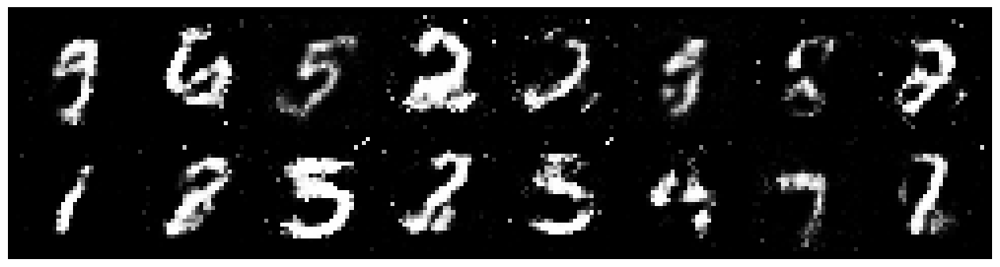

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.1343, Generator Loss: 1.1763
D(x): 0.5887, D(G(z)): 0.3447


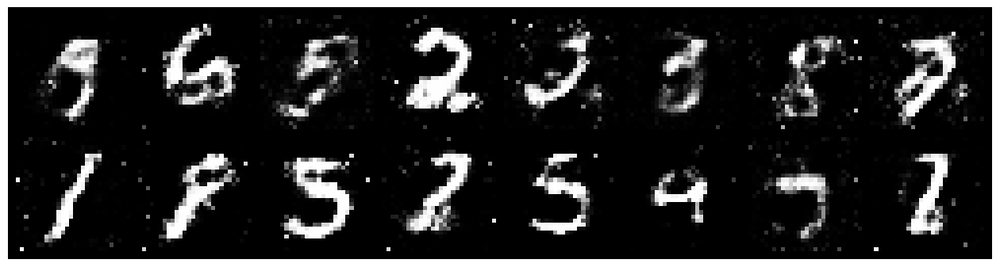

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.2075, Generator Loss: 1.2208
D(x): 0.5346, D(G(z)): 0.3468


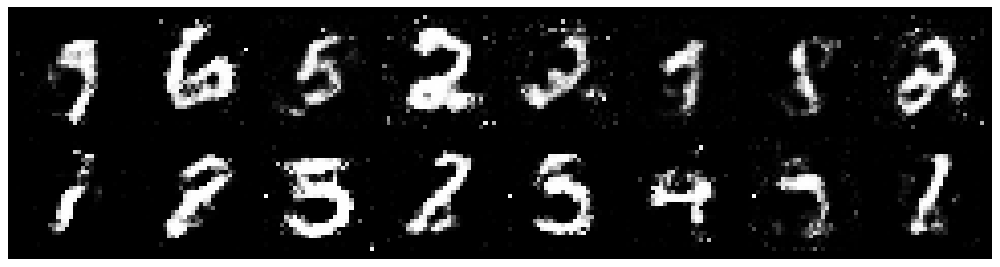

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.1029, Generator Loss: 1.2736
D(x): 0.6414, D(G(z)): 0.3947


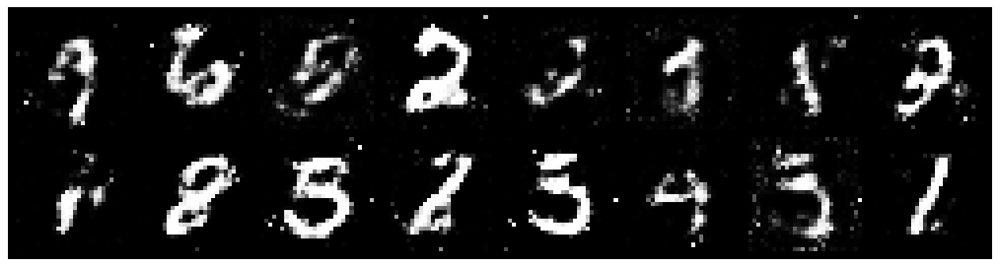

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.2434, Generator Loss: 1.0308
D(x): 0.5816, D(G(z)): 0.3995


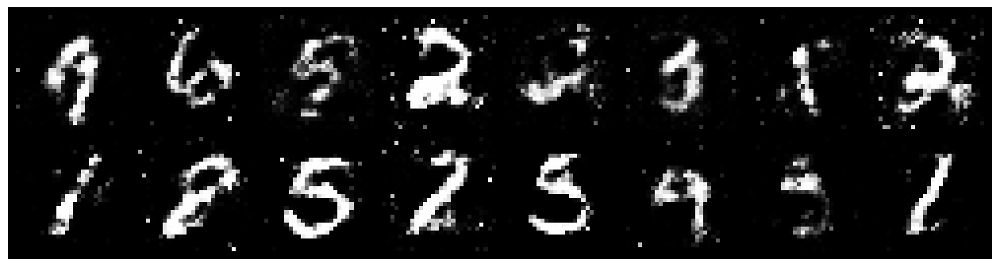

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 1.2681, Generator Loss: 1.0354
D(x): 0.5314, D(G(z)): 0.3929


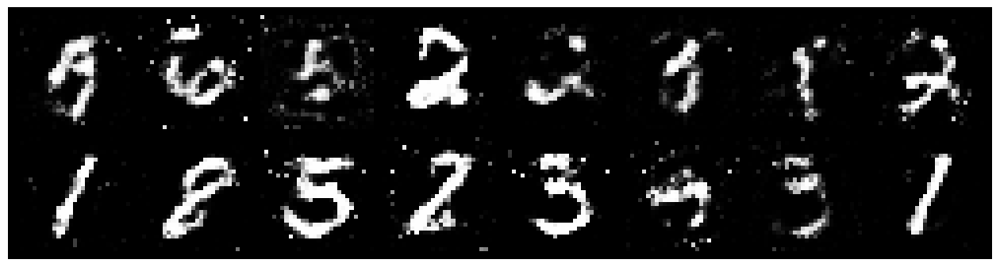

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.0594, Generator Loss: 1.1151
D(x): 0.6349, D(G(z)): 0.3719


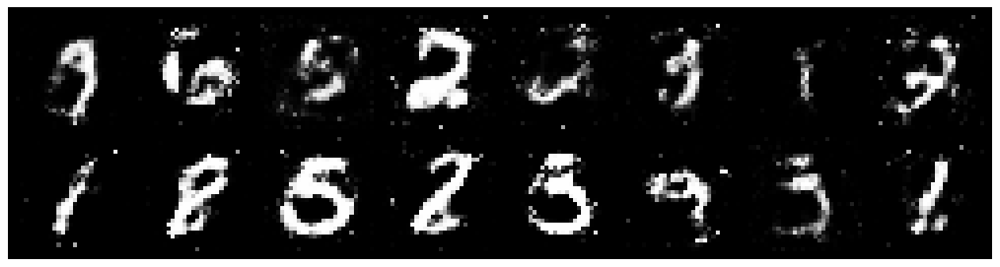

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.3537, Generator Loss: 0.7843
D(x): 0.5729, D(G(z)): 0.4808


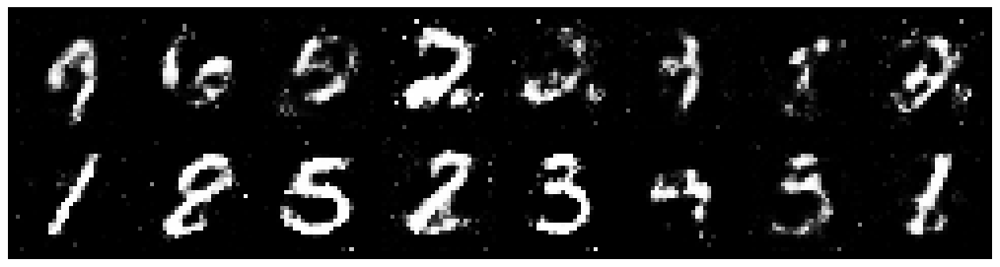

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.0993, Generator Loss: 1.1478
D(x): 0.6430, D(G(z)): 0.3768


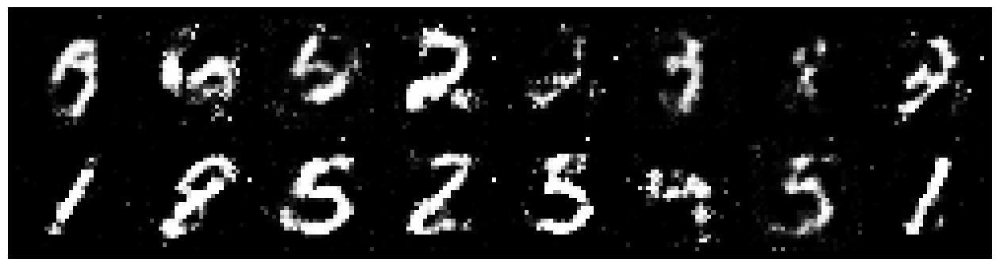

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.1586, Generator Loss: 1.0277
D(x): 0.6661, D(G(z)): 0.4240


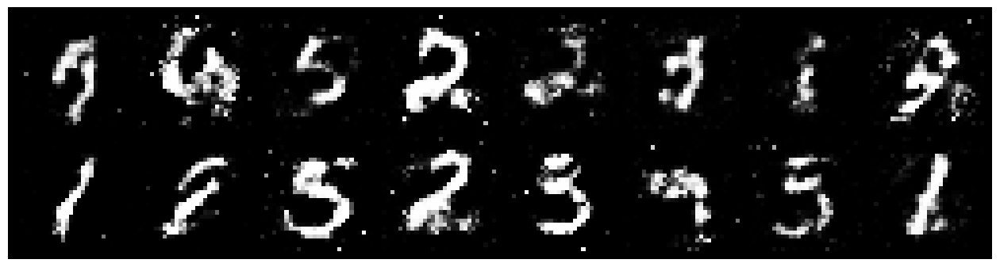

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.1340, Generator Loss: 0.9192
D(x): 0.6366, D(G(z)): 0.3713


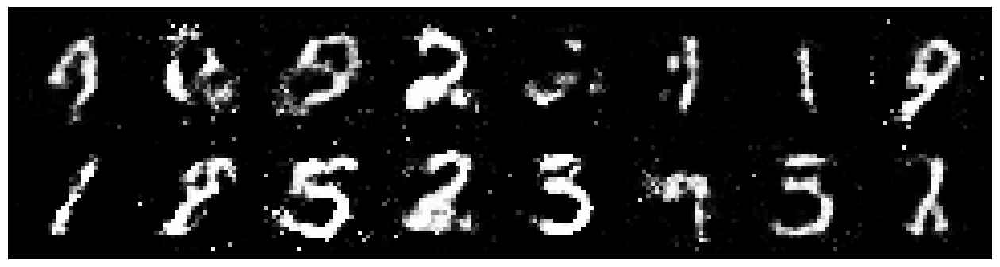

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.2003, Generator Loss: 1.0700
D(x): 0.6614, D(G(z)): 0.4530


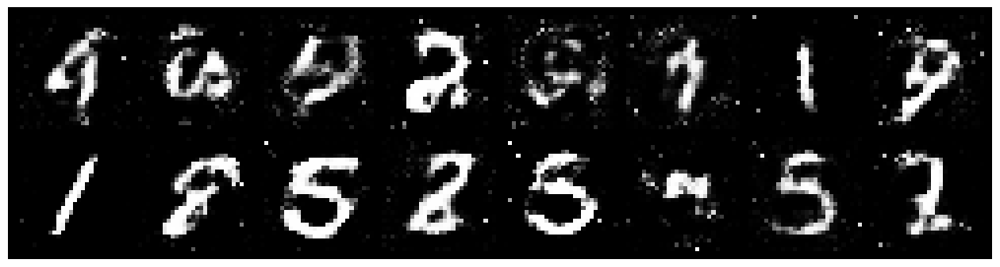

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 0.9989, Generator Loss: 1.3744
D(x): 0.6366, D(G(z)): 0.3486


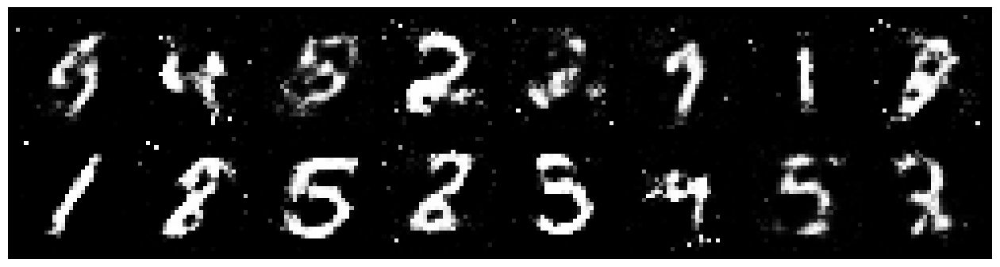

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.1819, Generator Loss: 1.1212
D(x): 0.6200, D(G(z)): 0.4008


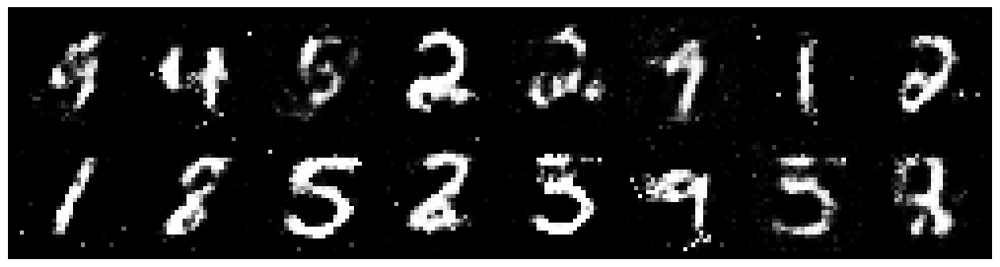

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 0.9760, Generator Loss: 1.0817
D(x): 0.6284, D(G(z)): 0.3393


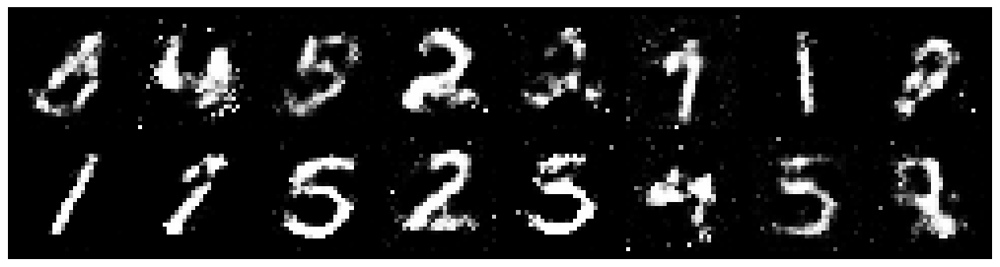

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.2200, Generator Loss: 0.9086
D(x): 0.5975, D(G(z)): 0.4302


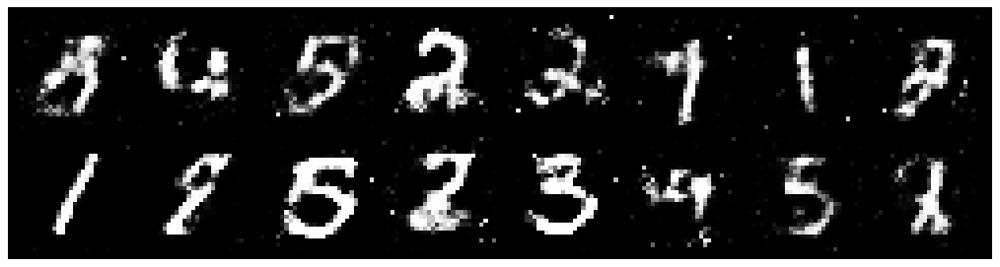

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.0505, Generator Loss: 1.3034
D(x): 0.6700, D(G(z)): 0.3752


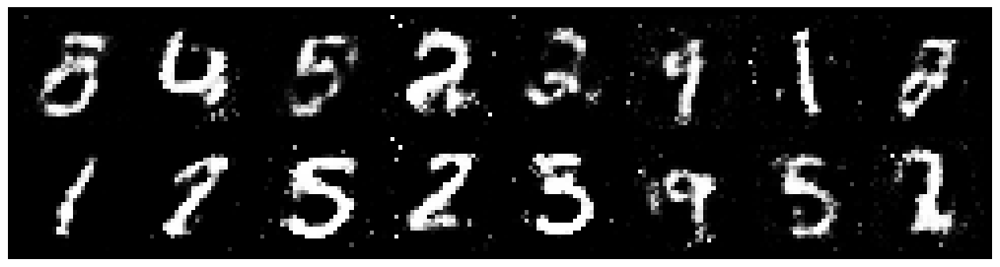

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.1790, Generator Loss: 1.0674
D(x): 0.5505, D(G(z)): 0.3591


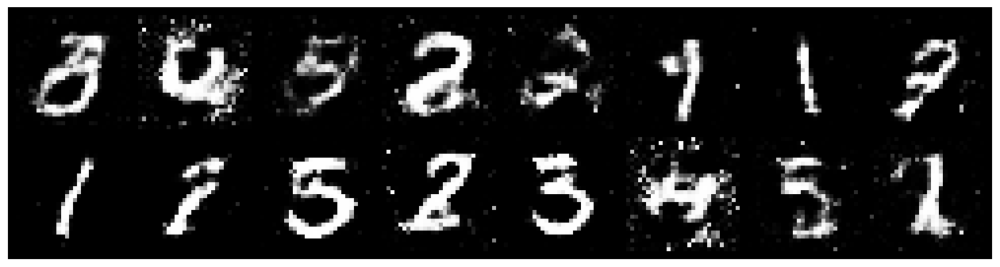

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.2205, Generator Loss: 1.0225
D(x): 0.5980, D(G(z)): 0.4049


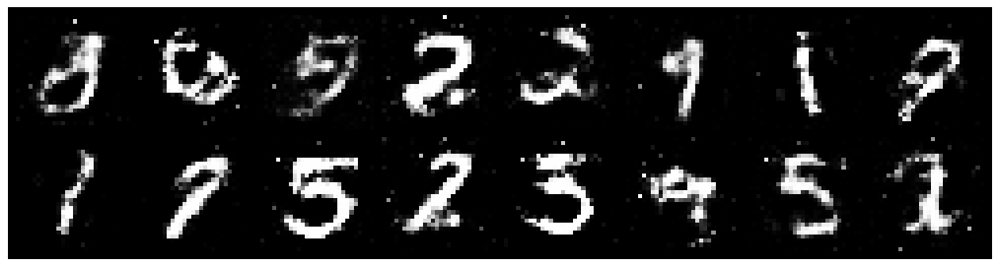

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.0540, Generator Loss: 1.0619
D(x): 0.6059, D(G(z)): 0.3395


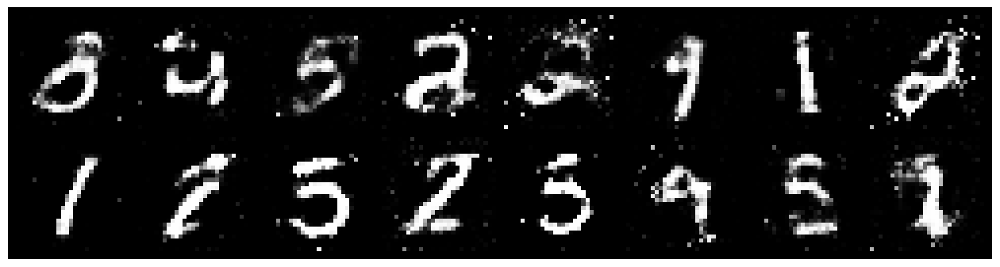

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.1765, Generator Loss: 1.0308
D(x): 0.6125, D(G(z)): 0.4074


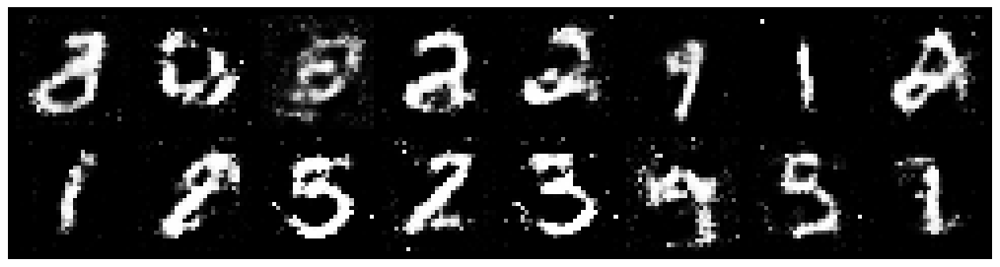

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.2300, Generator Loss: 1.1169
D(x): 0.5633, D(G(z)): 0.3827


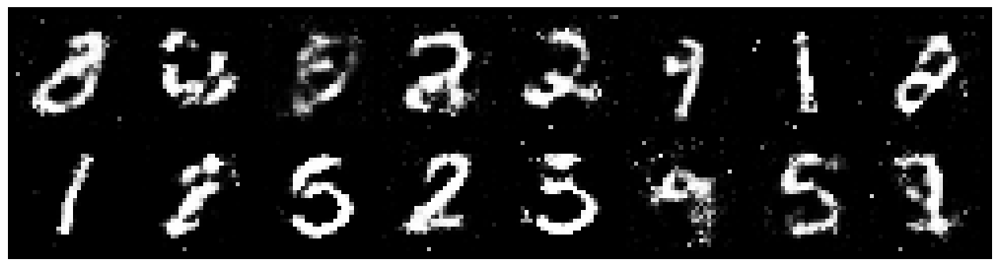

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.3647, Generator Loss: 1.0242
D(x): 0.5491, D(G(z)): 0.4228


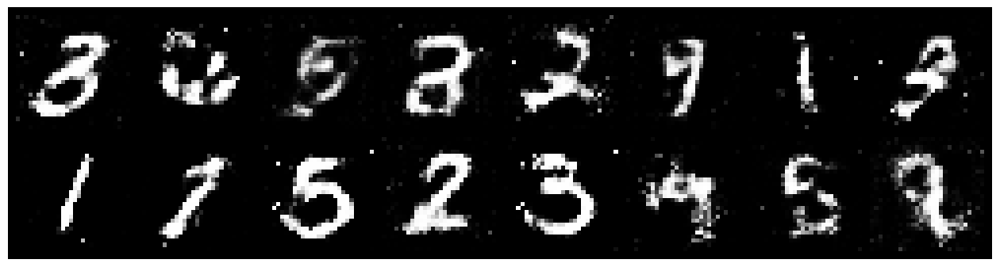

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.2034, Generator Loss: 1.0035
D(x): 0.6150, D(G(z)): 0.4257


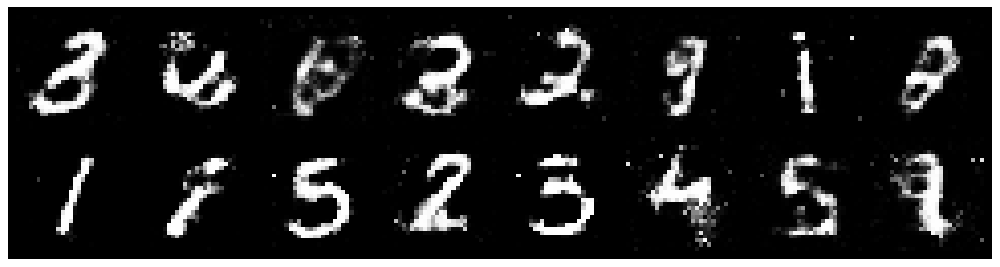

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.3539, Generator Loss: 0.8837
D(x): 0.5752, D(G(z)): 0.4758


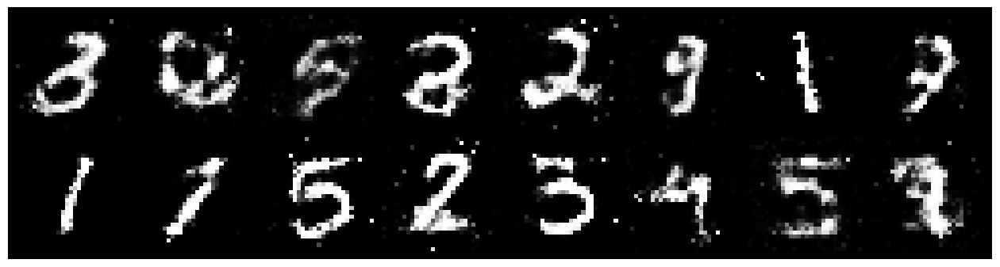

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.1082, Generator Loss: 1.0863
D(x): 0.5731, D(G(z)): 0.3609


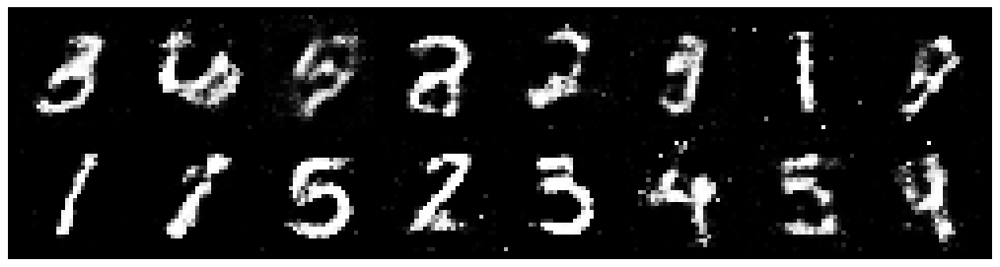

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.1069, Generator Loss: 0.9695
D(x): 0.5872, D(G(z)): 0.3670


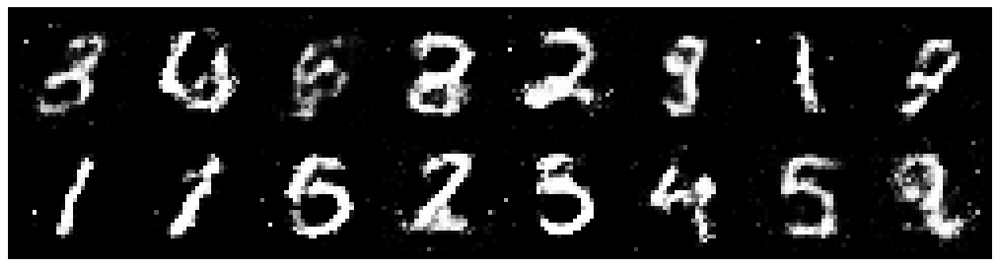

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.0527, Generator Loss: 1.4258
D(x): 0.6083, D(G(z)): 0.2885


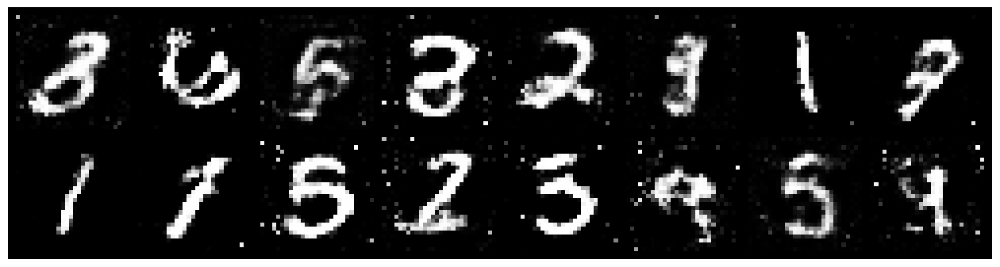

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.1201, Generator Loss: 1.1897
D(x): 0.5735, D(G(z)): 0.3473


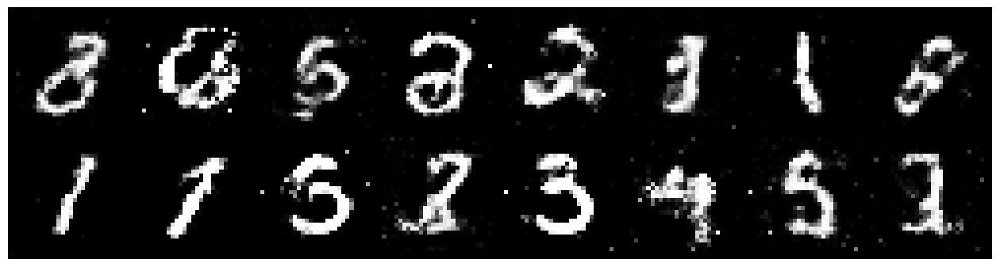

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.1726, Generator Loss: 1.1107
D(x): 0.6286, D(G(z)): 0.4252


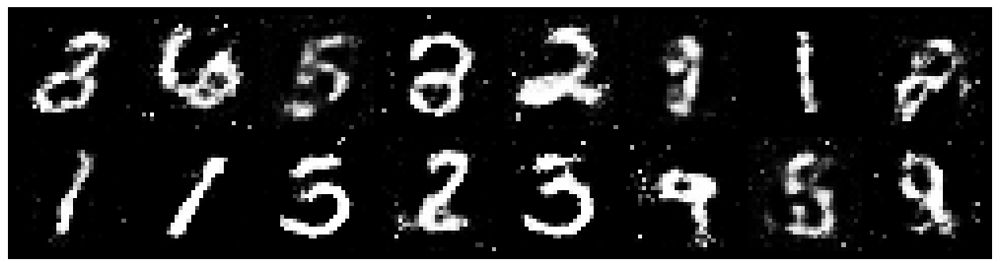

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.2948, Generator Loss: 0.9536
D(x): 0.5963, D(G(z)): 0.4600


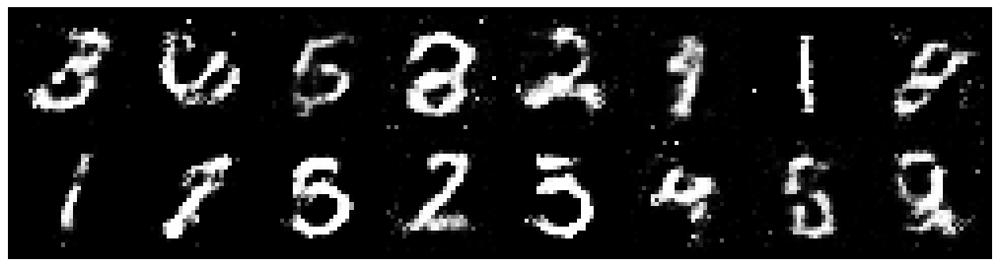

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.2068, Generator Loss: 1.3567
D(x): 0.5326, D(G(z)): 0.3309


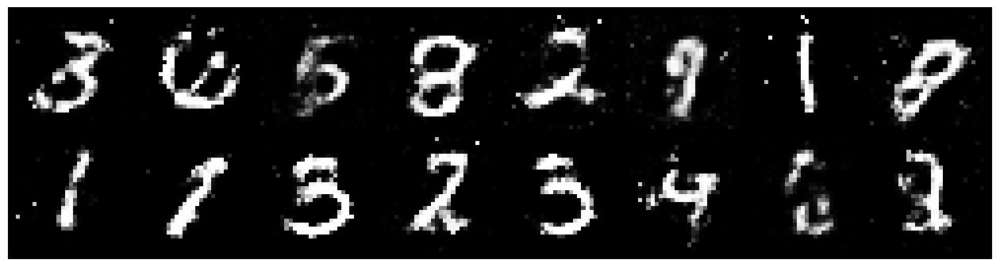

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.2856, Generator Loss: 0.8932
D(x): 0.5958, D(G(z)): 0.4930


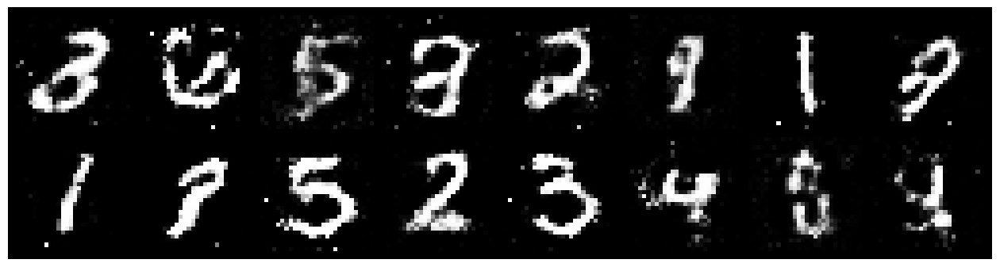

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.1321, Generator Loss: 1.4729
D(x): 0.6152, D(G(z)): 0.3782


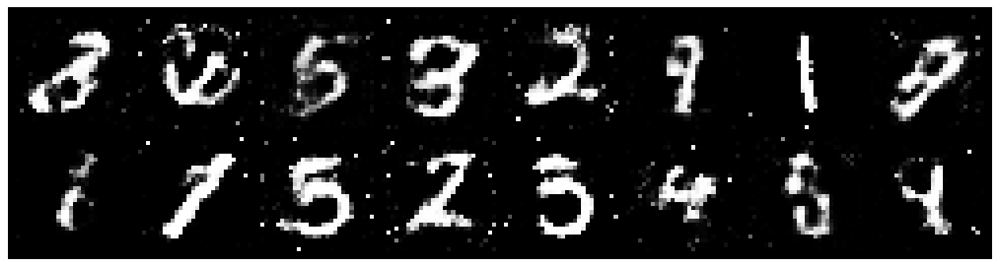

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.1771, Generator Loss: 1.0781
D(x): 0.5877, D(G(z)): 0.3878


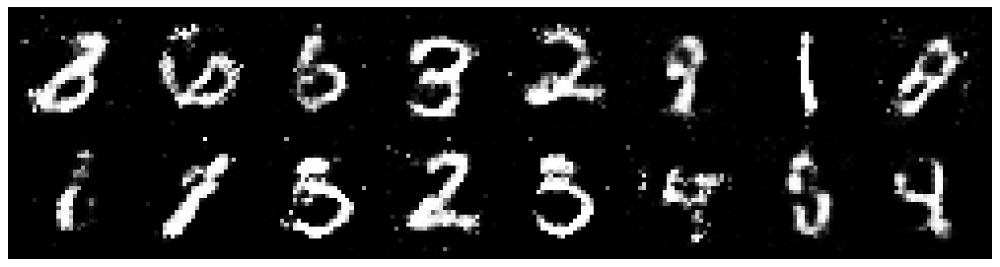

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.2088, Generator Loss: 1.1163
D(x): 0.5344, D(G(z)): 0.3747


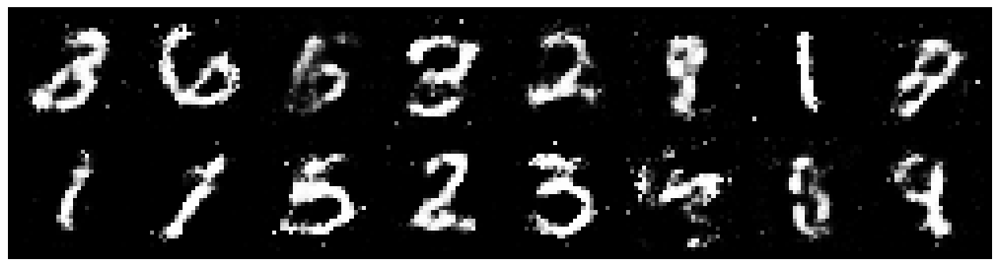

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.2112, Generator Loss: 1.1828
D(x): 0.5353, D(G(z)): 0.3403


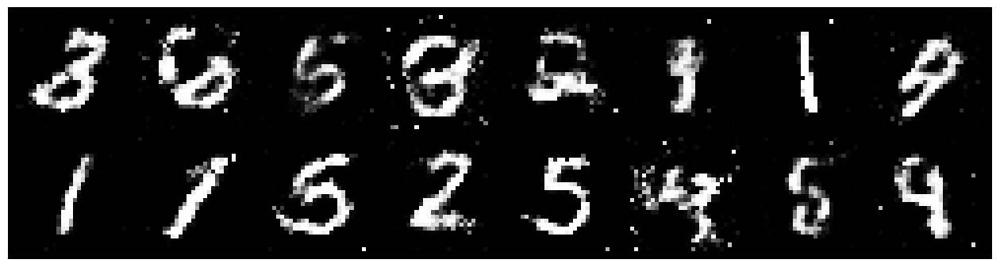

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.0702, Generator Loss: 1.2031
D(x): 0.6039, D(G(z)): 0.3552


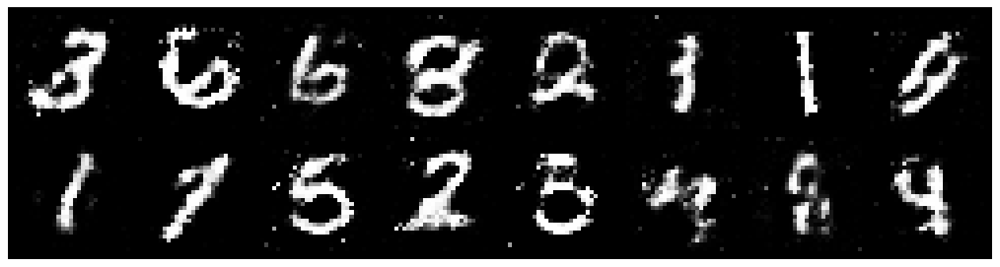

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.1698, Generator Loss: 0.9268
D(x): 0.6349, D(G(z)): 0.4533


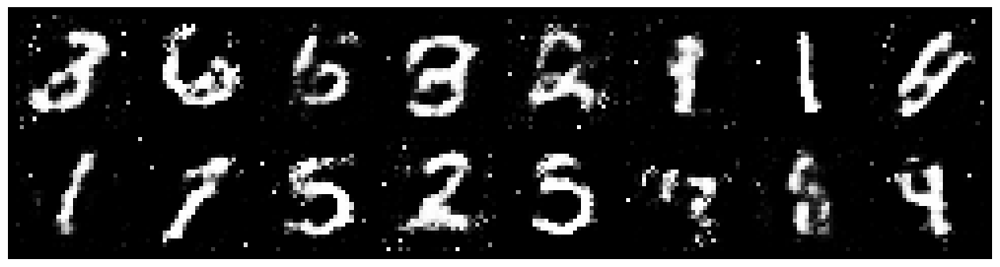

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.0847, Generator Loss: 1.2493
D(x): 0.6400, D(G(z)): 0.4086


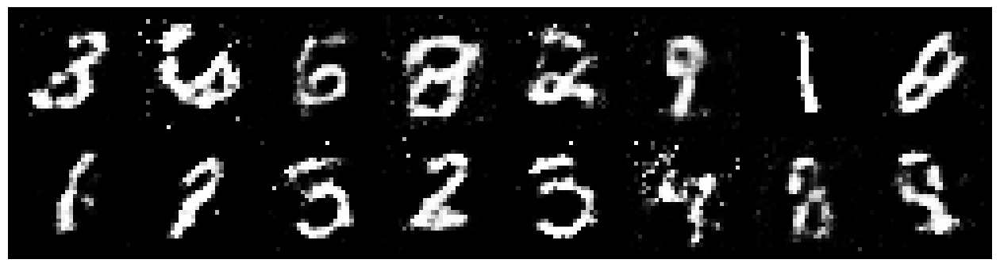

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.1009, Generator Loss: 1.1837
D(x): 0.5953, D(G(z)): 0.3669


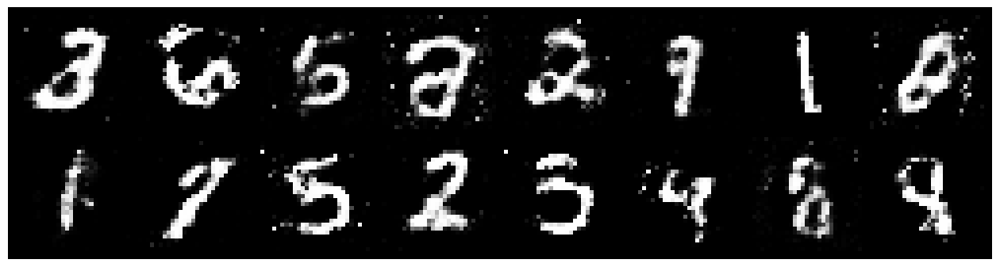

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.3124, Generator Loss: 1.0041
D(x): 0.6105, D(G(z)): 0.4736


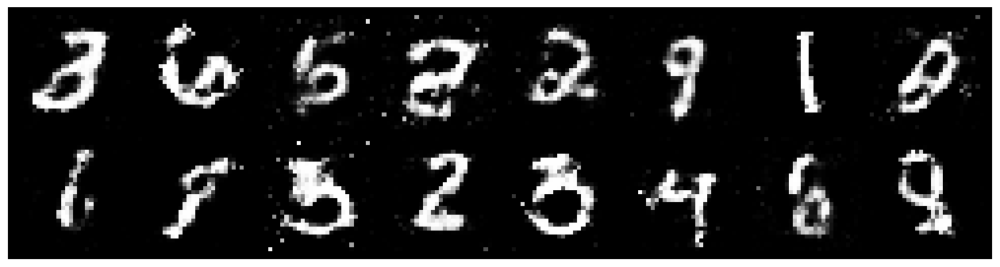

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.2935, Generator Loss: 0.9634
D(x): 0.5342, D(G(z)): 0.4200


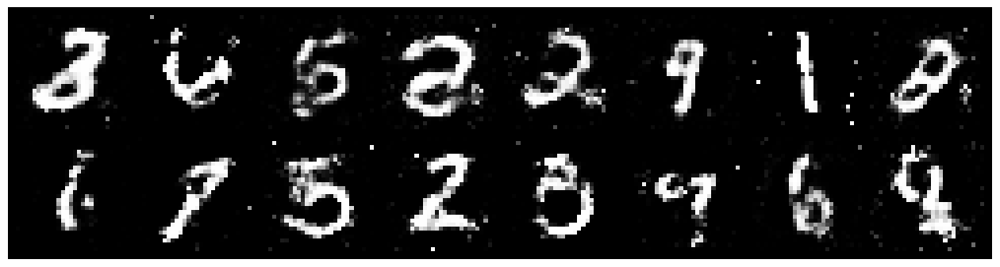

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.0863, Generator Loss: 1.0940
D(x): 0.5943, D(G(z)): 0.3720


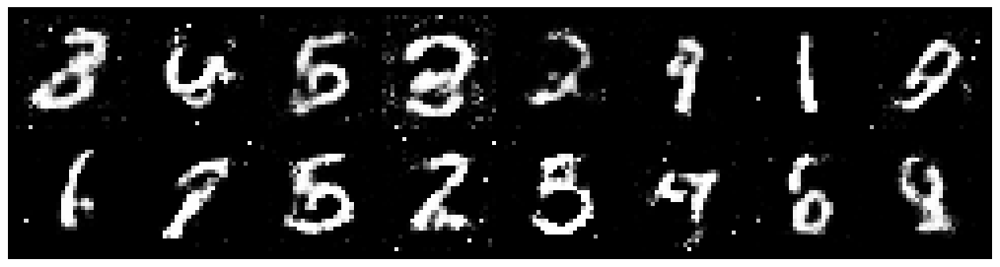

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.1493, Generator Loss: 1.1074
D(x): 0.6070, D(G(z)): 0.3682


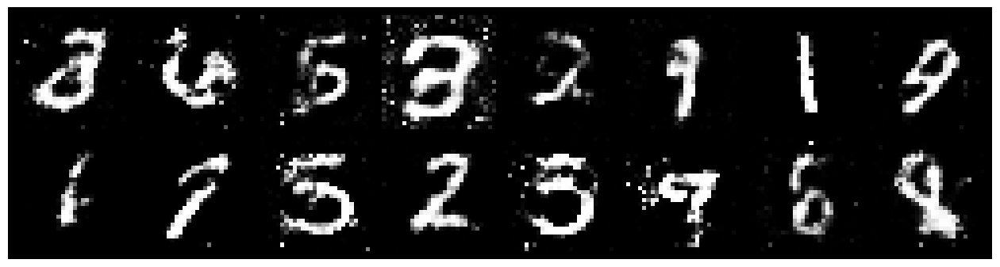

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.2733, Generator Loss: 0.9028
D(x): 0.5770, D(G(z)): 0.4646


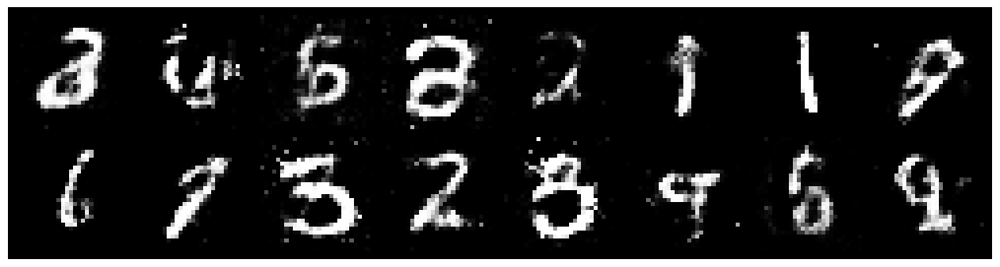

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.0960, Generator Loss: 1.0153
D(x): 0.6221, D(G(z)): 0.3881


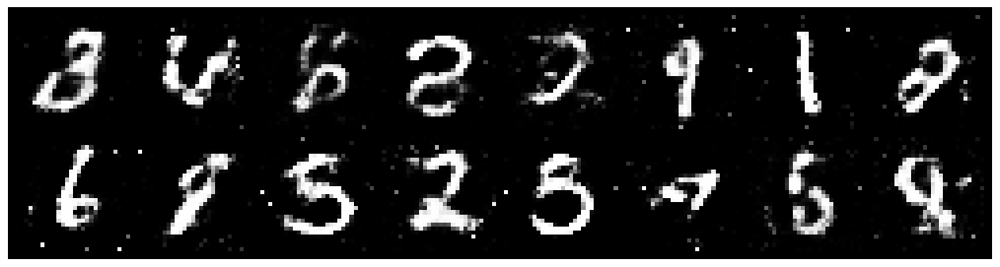

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.1962, Generator Loss: 1.0162
D(x): 0.5575, D(G(z)): 0.4062


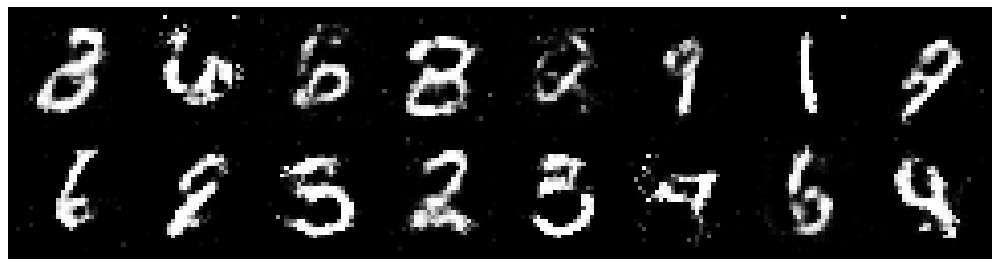

Epoch: [62/200], Batch Num: [300/600]
Discriminator Loss: 1.3684, Generator Loss: 0.9556
D(x): 0.5083, D(G(z)): 0.4306


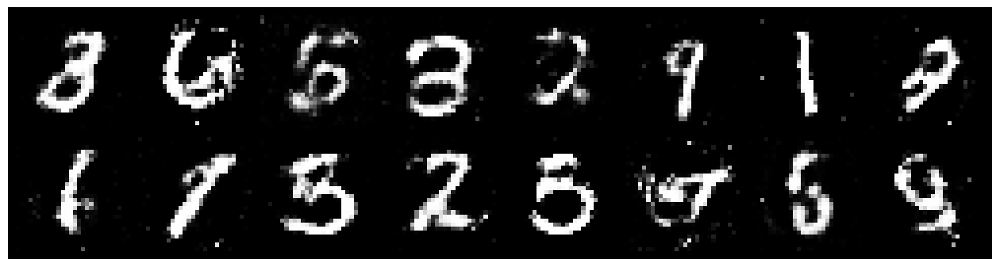

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.0991, Generator Loss: 0.9080
D(x): 0.6223, D(G(z)): 0.4066


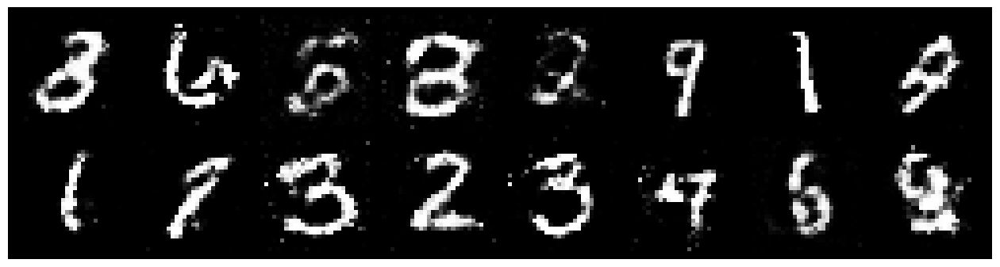

Epoch: [63/200], Batch Num: [300/600]
Discriminator Loss: 1.1945, Generator Loss: 1.0916
D(x): 0.5475, D(G(z)): 0.3951


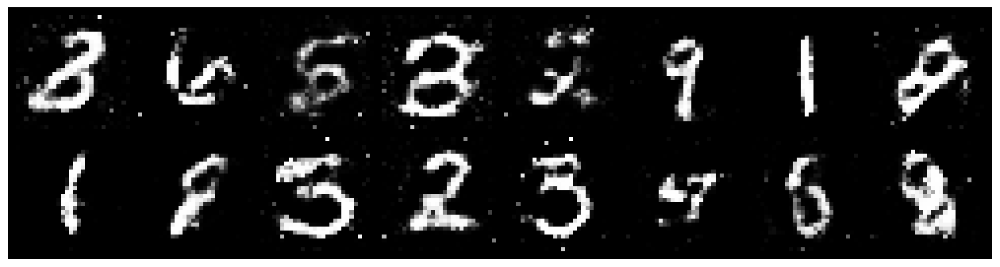

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 1.1874, Generator Loss: 1.0323
D(x): 0.5697, D(G(z)): 0.4194


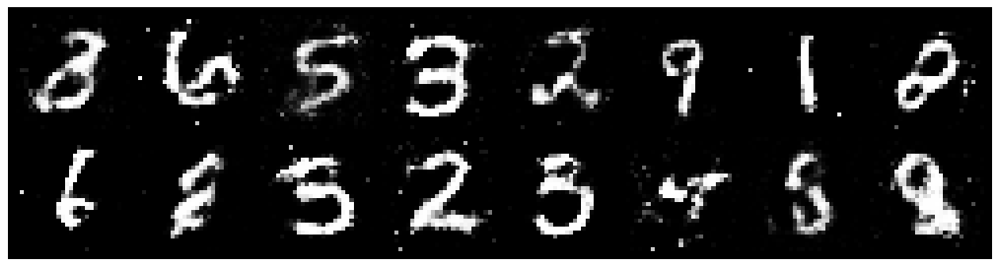

Epoch: [64/200], Batch Num: [300/600]
Discriminator Loss: 1.3155, Generator Loss: 1.3452
D(x): 0.5280, D(G(z)): 0.3922


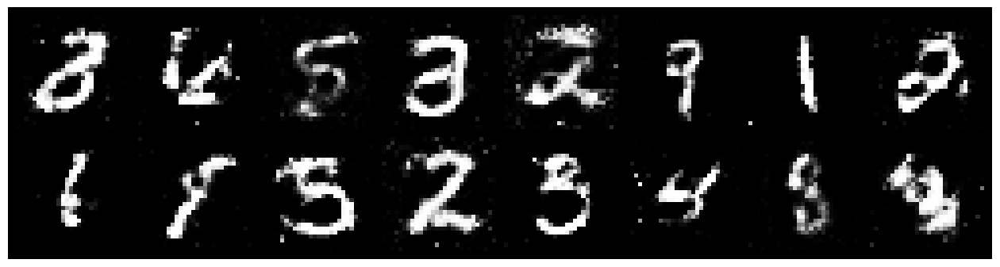

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.2200, Generator Loss: 0.9433
D(x): 0.5552, D(G(z)): 0.4061


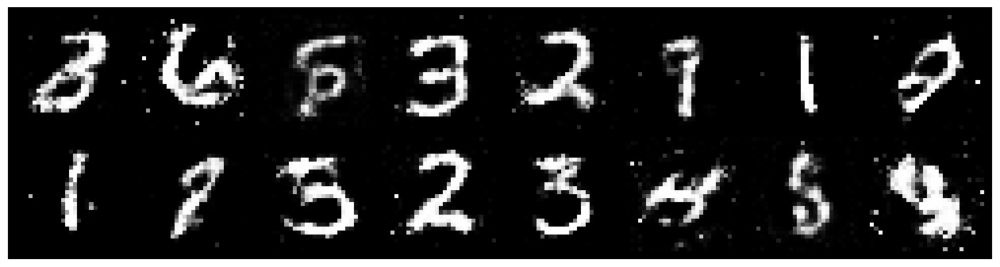

Epoch: [65/200], Batch Num: [300/600]
Discriminator Loss: 1.2249, Generator Loss: 0.9655
D(x): 0.5547, D(G(z)): 0.4121


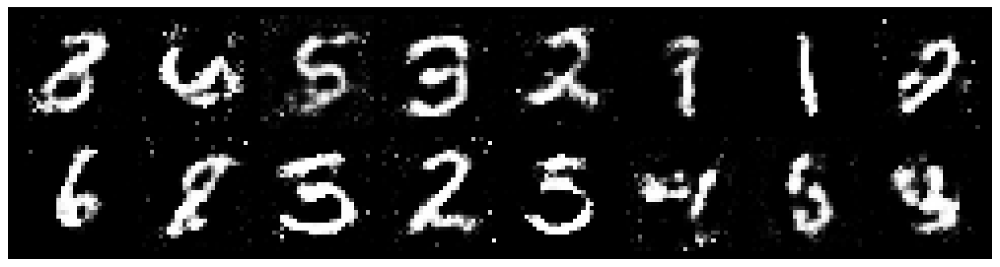

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.1915, Generator Loss: 0.9423
D(x): 0.5921, D(G(z)): 0.4351


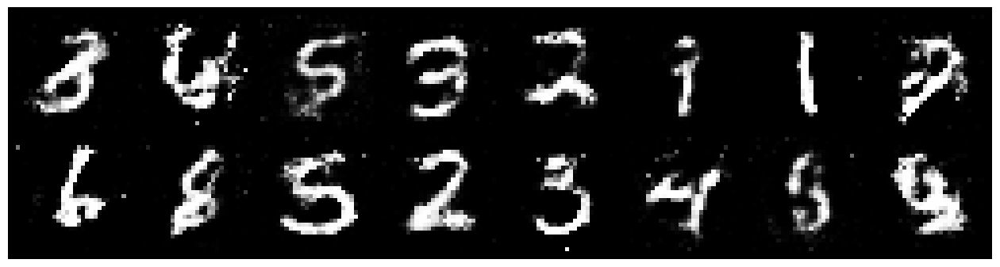

Epoch: [66/200], Batch Num: [300/600]
Discriminator Loss: 1.2368, Generator Loss: 0.9487
D(x): 0.5682, D(G(z)): 0.4424


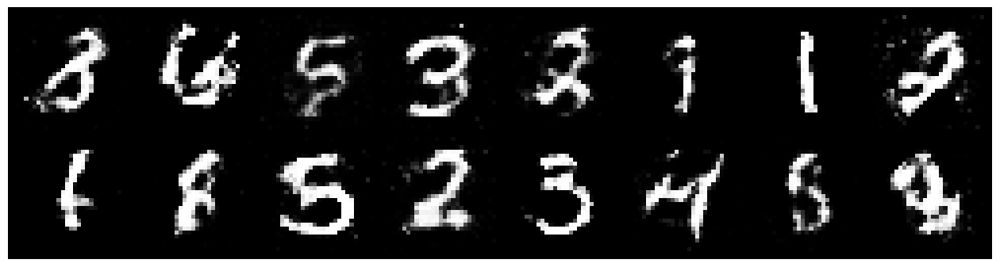

Epoch: [67/200], Batch Num: [0/600]
Discriminator Loss: 1.2296, Generator Loss: 0.8410
D(x): 0.5503, D(G(z)): 0.4059


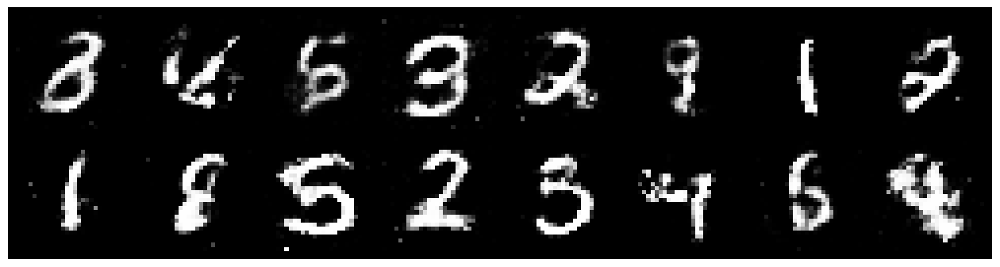

Epoch: [67/200], Batch Num: [300/600]
Discriminator Loss: 1.2321, Generator Loss: 0.9407
D(x): 0.5528, D(G(z)): 0.4275


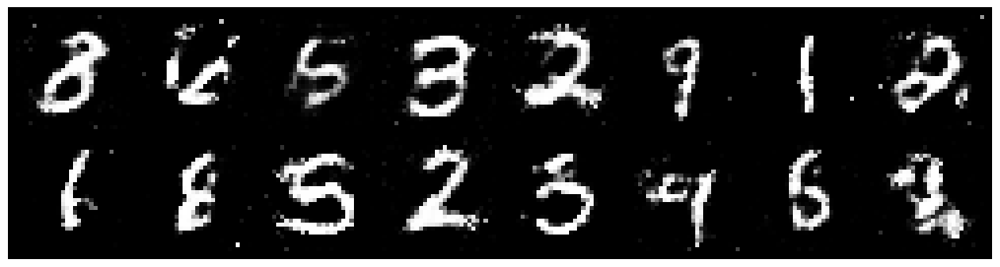

Epoch: [68/200], Batch Num: [0/600]
Discriminator Loss: 1.0940, Generator Loss: 1.1775
D(x): 0.5864, D(G(z)): 0.3589


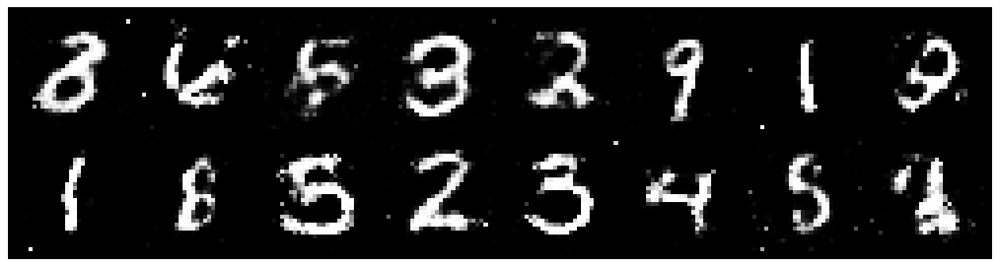

Epoch: [68/200], Batch Num: [300/600]
Discriminator Loss: 1.2902, Generator Loss: 1.1057
D(x): 0.5770, D(G(z)): 0.4051


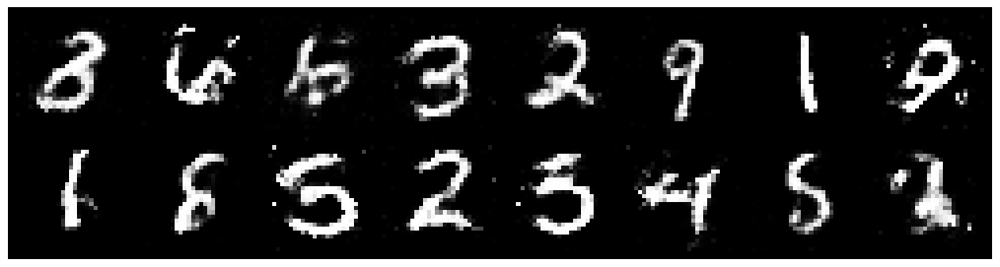

Epoch: [69/200], Batch Num: [0/600]
Discriminator Loss: 1.0743, Generator Loss: 1.2620
D(x): 0.5930, D(G(z)): 0.3471


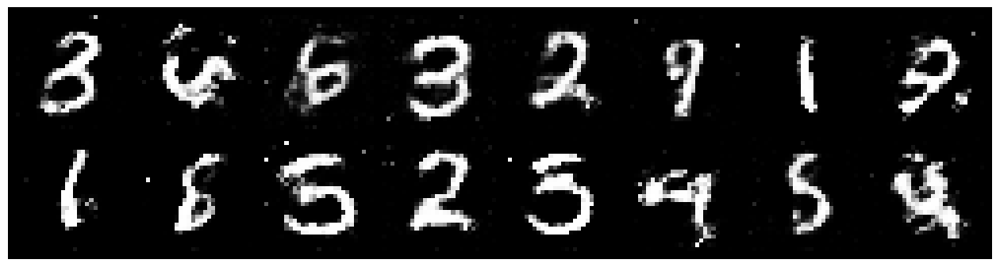

Epoch: [69/200], Batch Num: [300/600]
Discriminator Loss: 1.3173, Generator Loss: 1.0329
D(x): 0.6195, D(G(z)): 0.4736


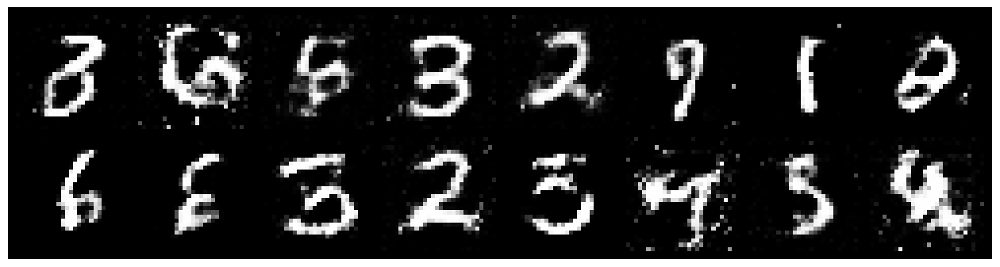

Epoch: [70/200], Batch Num: [0/600]
Discriminator Loss: 1.3586, Generator Loss: 1.1166
D(x): 0.5282, D(G(z)): 0.3974


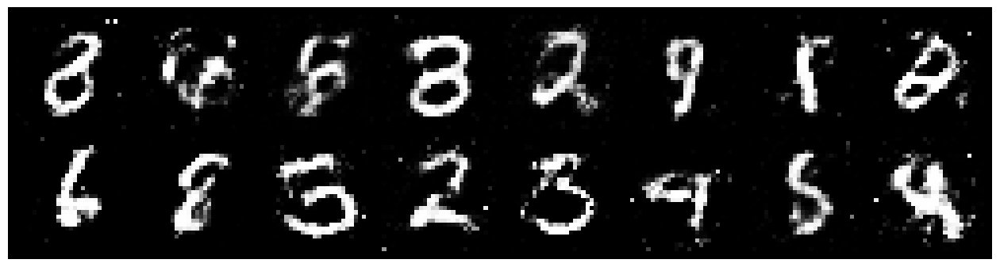

Epoch: [70/200], Batch Num: [300/600]
Discriminator Loss: 1.2157, Generator Loss: 0.9144
D(x): 0.5812, D(G(z)): 0.4315


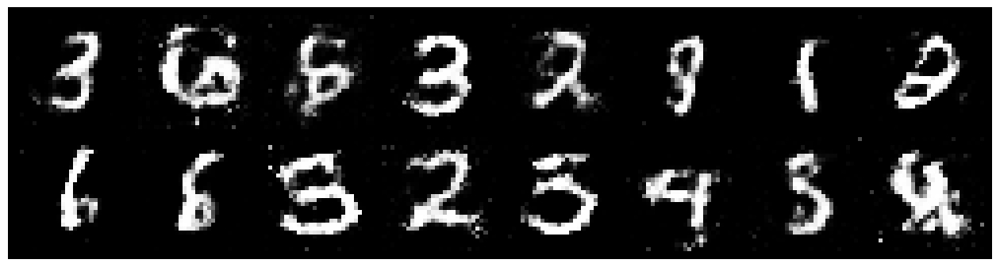

Epoch: [71/200], Batch Num: [0/600]
Discriminator Loss: 1.0696, Generator Loss: 1.2791
D(x): 0.6432, D(G(z)): 0.3427


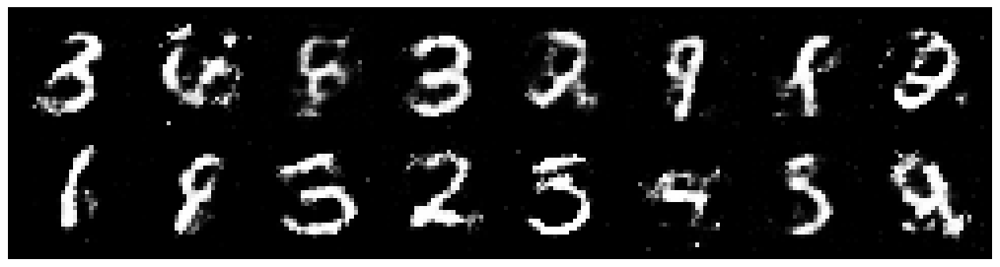

Epoch: [71/200], Batch Num: [300/600]
Discriminator Loss: 1.2652, Generator Loss: 1.0644
D(x): 0.6273, D(G(z)): 0.4725


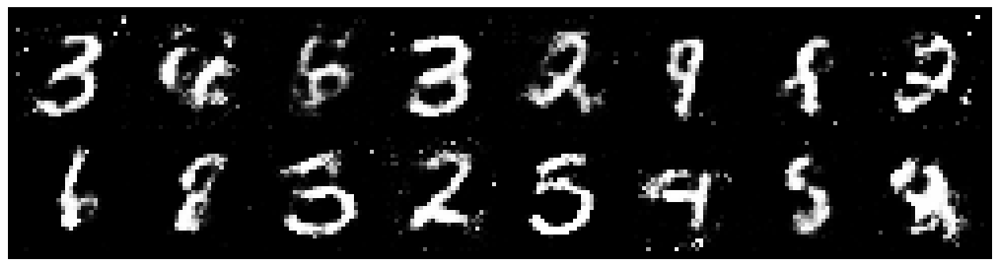

Epoch: [72/200], Batch Num: [0/600]
Discriminator Loss: 1.2025, Generator Loss: 0.9408
D(x): 0.5718, D(G(z)): 0.3909


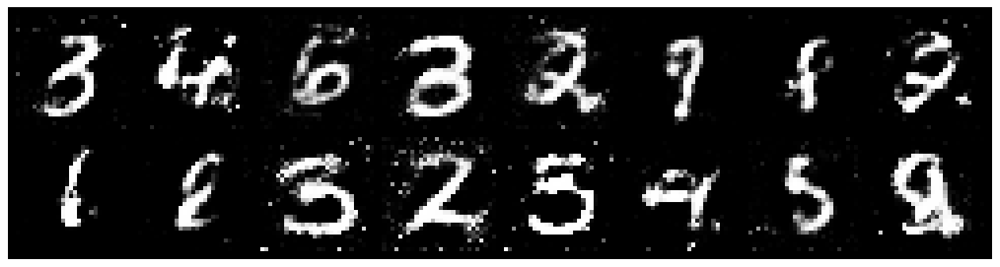

Epoch: [72/200], Batch Num: [300/600]
Discriminator Loss: 1.1464, Generator Loss: 0.8942
D(x): 0.6098, D(G(z)): 0.4131


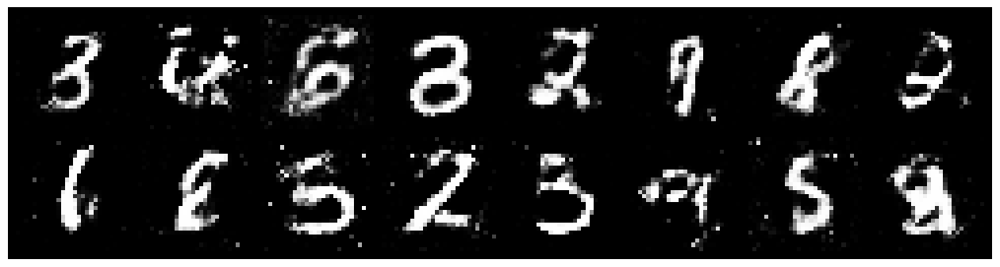

Epoch: [73/200], Batch Num: [0/600]
Discriminator Loss: 1.2853, Generator Loss: 0.7528
D(x): 0.5746, D(G(z)): 0.4820


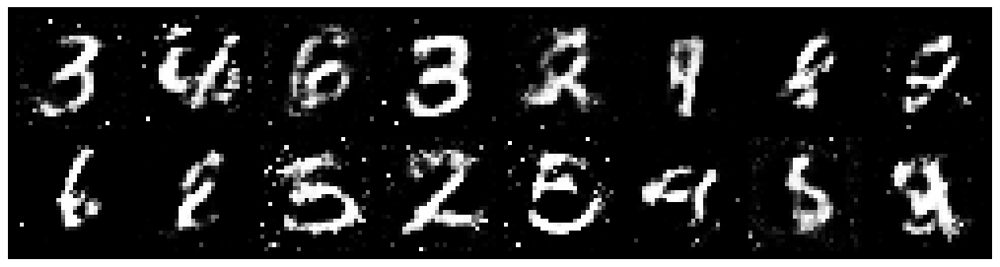

Epoch: [73/200], Batch Num: [300/600]
Discriminator Loss: 1.3788, Generator Loss: 0.8011
D(x): 0.5332, D(G(z)): 0.4155


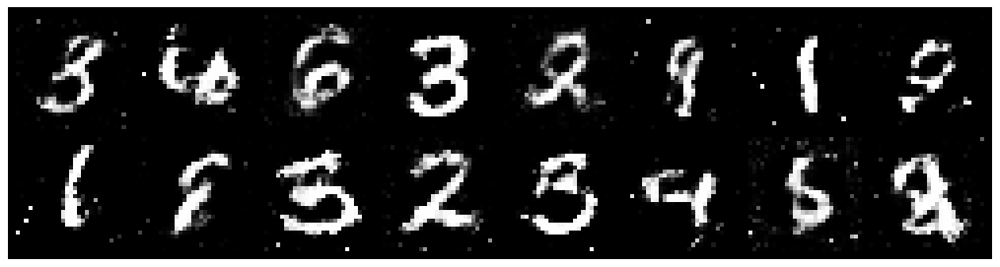

Epoch: [74/200], Batch Num: [0/600]
Discriminator Loss: 1.3055, Generator Loss: 1.0719
D(x): 0.5549, D(G(z)): 0.4170


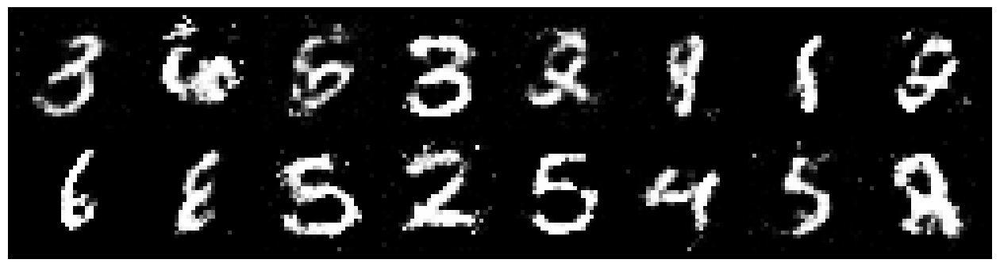

Epoch: [74/200], Batch Num: [300/600]
Discriminator Loss: 1.1672, Generator Loss: 0.8835
D(x): 0.6147, D(G(z)): 0.4358


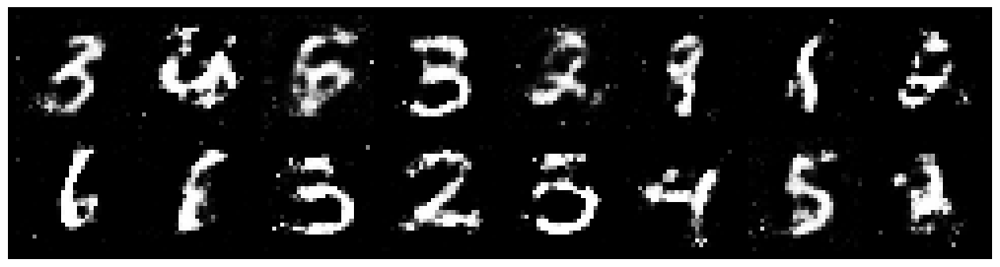

Epoch: [75/200], Batch Num: [0/600]
Discriminator Loss: 1.1377, Generator Loss: 1.0791
D(x): 0.6144, D(G(z)): 0.3980


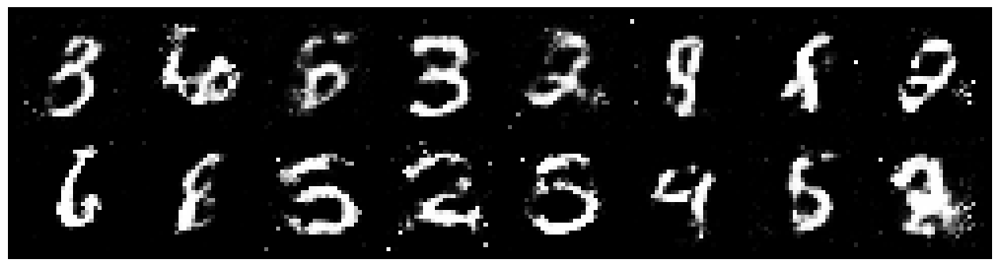

Epoch: [75/200], Batch Num: [300/600]
Discriminator Loss: 1.1669, Generator Loss: 1.0389
D(x): 0.6088, D(G(z)): 0.3837


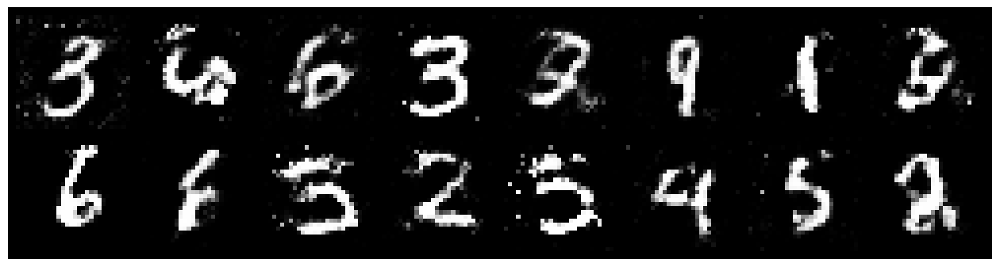

Epoch: [76/200], Batch Num: [0/600]
Discriminator Loss: 1.1291, Generator Loss: 1.2052
D(x): 0.6059, D(G(z)): 0.3849


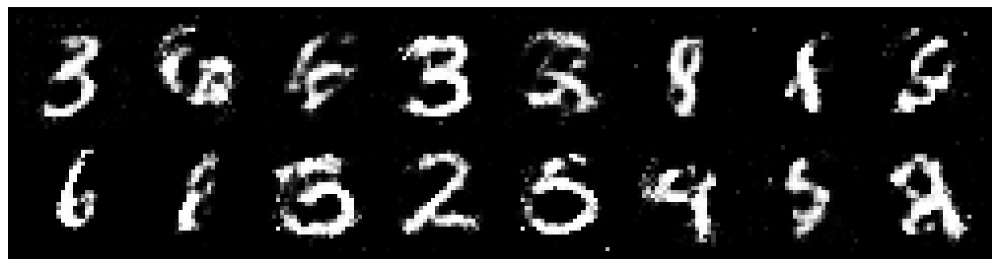

Epoch: [76/200], Batch Num: [300/600]
Discriminator Loss: 1.2077, Generator Loss: 0.9806
D(x): 0.6388, D(G(z)): 0.4690


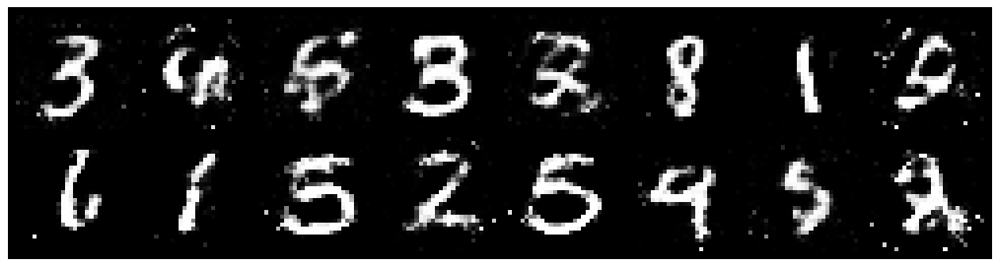

Epoch: [77/200], Batch Num: [0/600]
Discriminator Loss: 1.3449, Generator Loss: 1.0396
D(x): 0.5559, D(G(z)): 0.4472


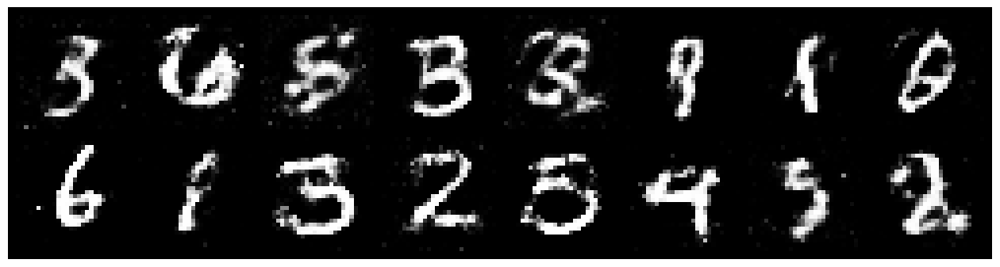

Epoch: [77/200], Batch Num: [300/600]
Discriminator Loss: 1.1564, Generator Loss: 0.9594
D(x): 0.5606, D(G(z)): 0.4001


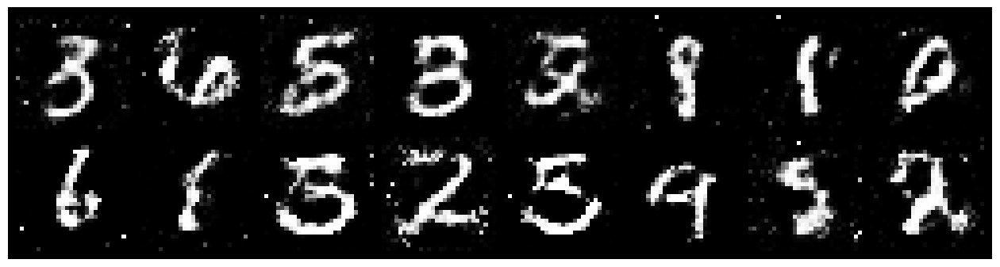

Epoch: [78/200], Batch Num: [0/600]
Discriminator Loss: 1.2824, Generator Loss: 0.8246
D(x): 0.5426, D(G(z)): 0.4541


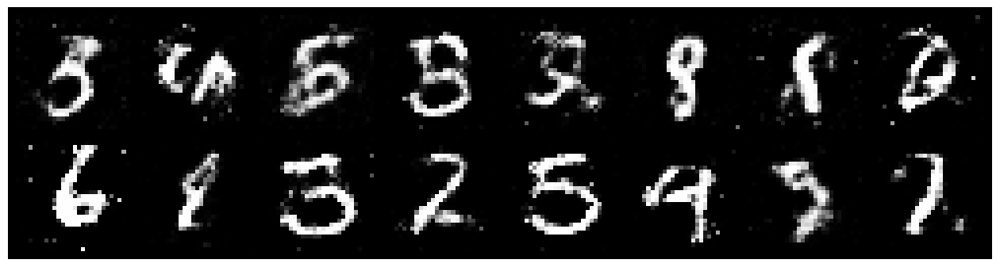

Epoch: [78/200], Batch Num: [300/600]
Discriminator Loss: 1.2131, Generator Loss: 0.8317
D(x): 0.5709, D(G(z)): 0.4388


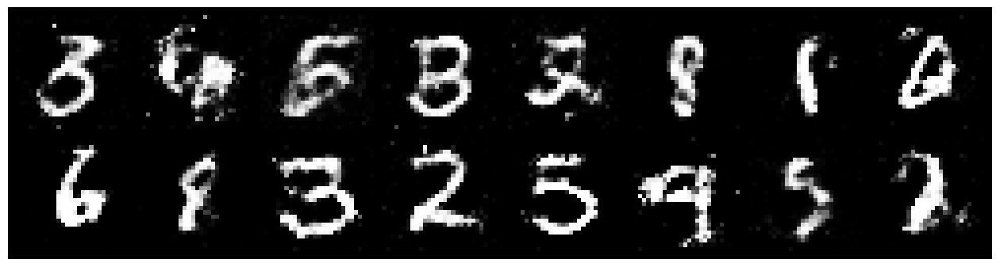

Epoch: [79/200], Batch Num: [0/600]
Discriminator Loss: 1.2159, Generator Loss: 0.9542
D(x): 0.5738, D(G(z)): 0.4347


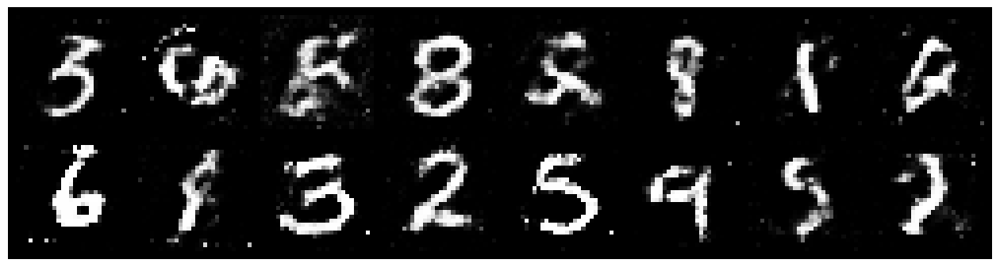

Epoch: [79/200], Batch Num: [300/600]
Discriminator Loss: 1.1899, Generator Loss: 0.8571
D(x): 0.5887, D(G(z)): 0.4294


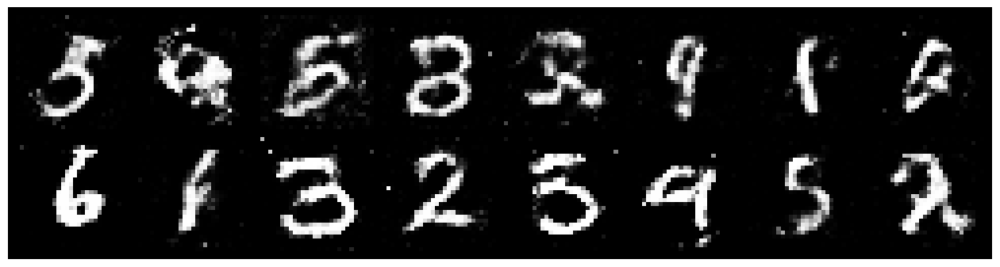

Epoch: [80/200], Batch Num: [0/600]
Discriminator Loss: 1.1684, Generator Loss: 1.3591
D(x): 0.5913, D(G(z)): 0.3768


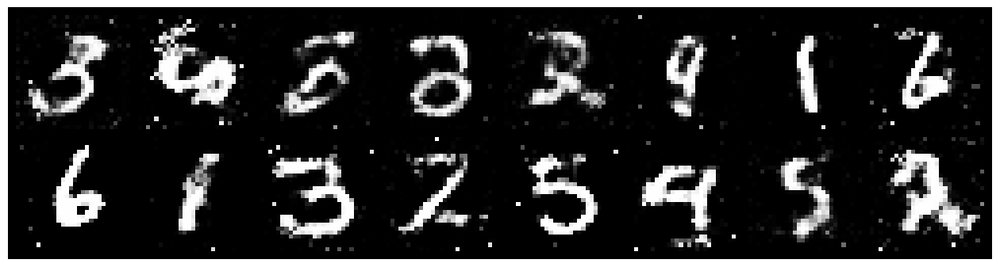

Epoch: [80/200], Batch Num: [300/600]
Discriminator Loss: 1.2282, Generator Loss: 0.9364
D(x): 0.5814, D(G(z)): 0.4466


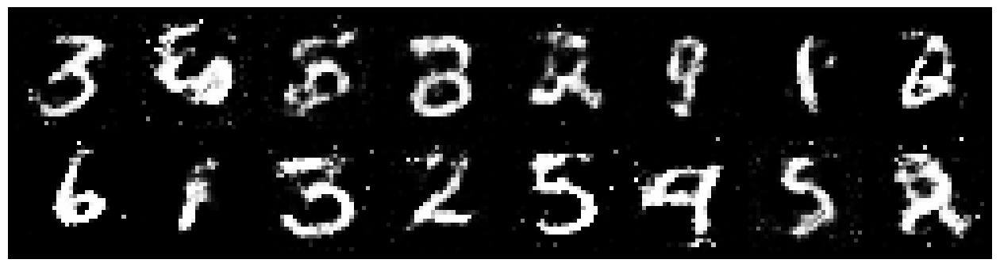

Epoch: [81/200], Batch Num: [0/600]
Discriminator Loss: 1.1921, Generator Loss: 1.0519
D(x): 0.5510, D(G(z)): 0.4060


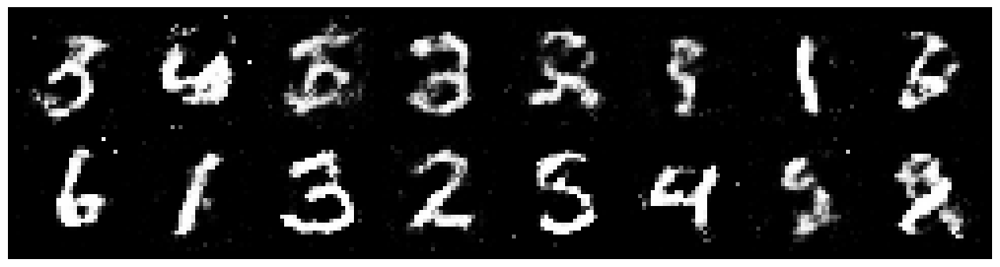

Epoch: [81/200], Batch Num: [300/600]
Discriminator Loss: 1.2604, Generator Loss: 0.8867
D(x): 0.5595, D(G(z)): 0.4561


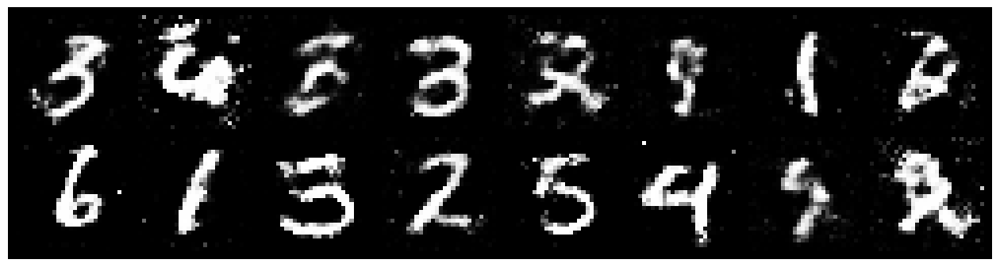

Epoch: [82/200], Batch Num: [0/600]
Discriminator Loss: 1.2976, Generator Loss: 0.8162
D(x): 0.5818, D(G(z)): 0.4833


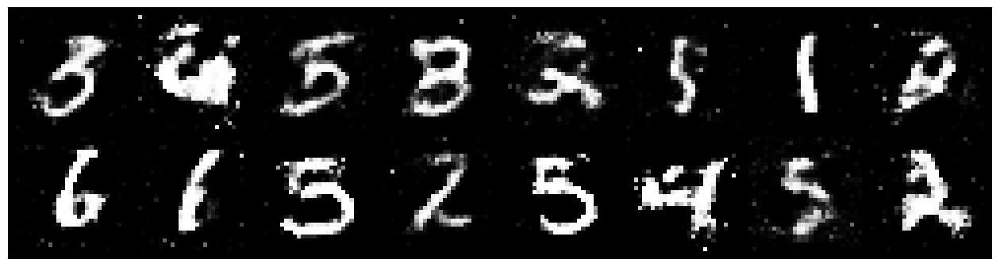

Epoch: [82/200], Batch Num: [300/600]
Discriminator Loss: 1.2353, Generator Loss: 1.0007
D(x): 0.6207, D(G(z)): 0.4552


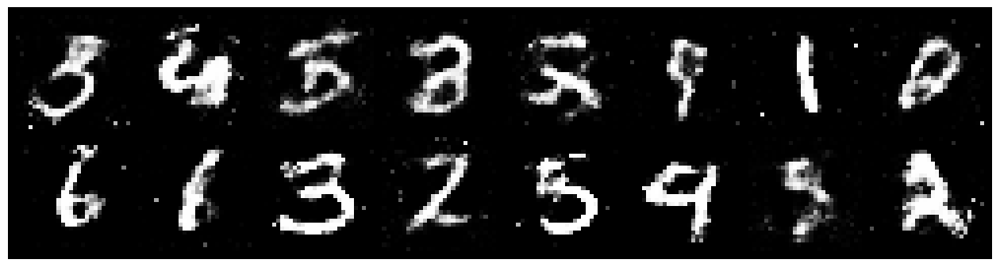

Epoch: [83/200], Batch Num: [0/600]
Discriminator Loss: 1.2861, Generator Loss: 1.1640
D(x): 0.5652, D(G(z)): 0.4174


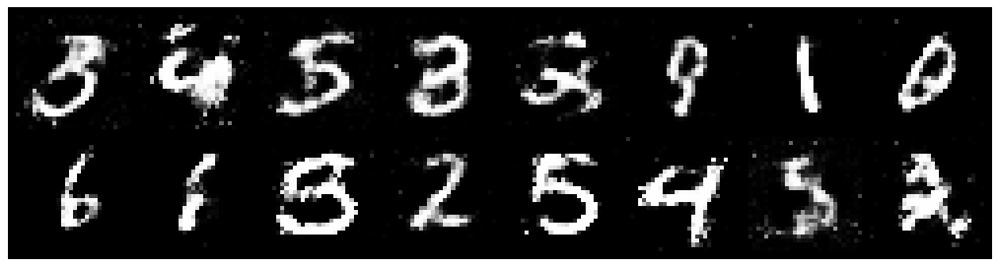

Epoch: [83/200], Batch Num: [300/600]
Discriminator Loss: 1.2662, Generator Loss: 1.0161
D(x): 0.5948, D(G(z)): 0.4477


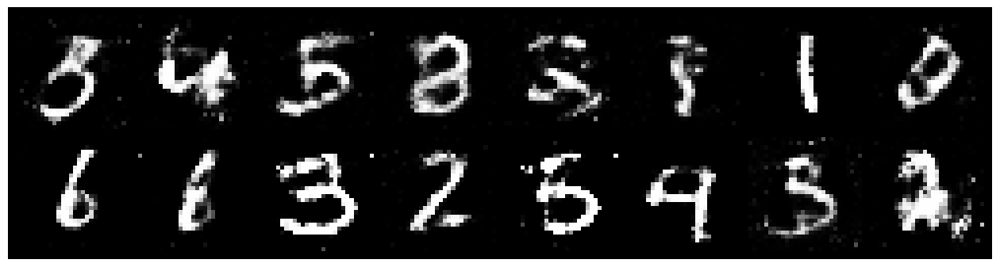

Epoch: [84/200], Batch Num: [0/600]
Discriminator Loss: 1.1842, Generator Loss: 0.9984
D(x): 0.5753, D(G(z)): 0.4029


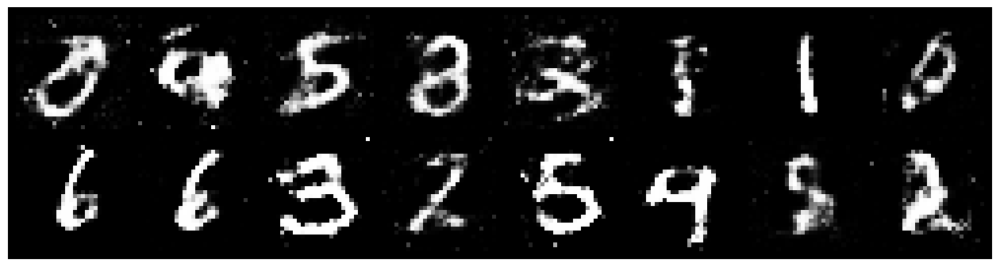

Epoch: [84/200], Batch Num: [300/600]
Discriminator Loss: 1.1216, Generator Loss: 1.1091
D(x): 0.6397, D(G(z)): 0.3893


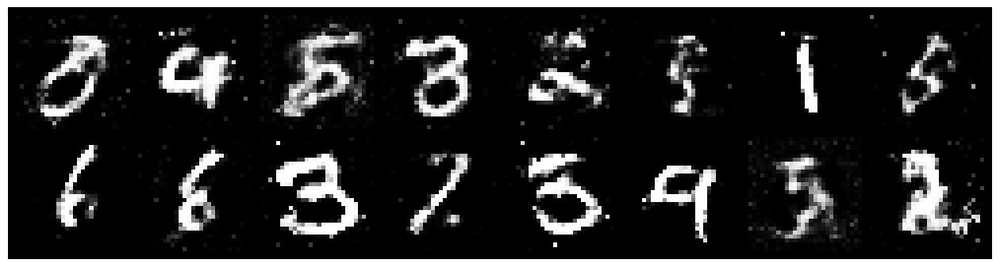

Epoch: [85/200], Batch Num: [0/600]
Discriminator Loss: 1.2002, Generator Loss: 0.9468
D(x): 0.5906, D(G(z)): 0.4388


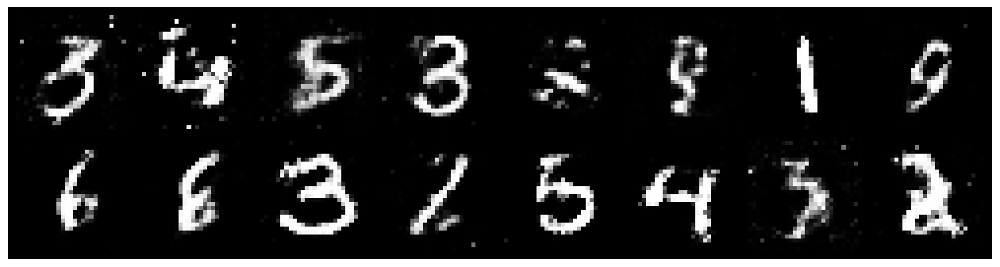

Epoch: [85/200], Batch Num: [300/600]
Discriminator Loss: 1.2620, Generator Loss: 0.8682
D(x): 0.5791, D(G(z)): 0.4634


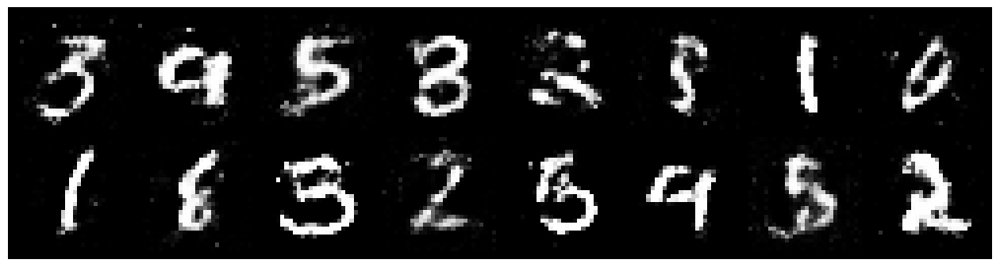

Epoch: [86/200], Batch Num: [0/600]
Discriminator Loss: 1.1734, Generator Loss: 0.9043
D(x): 0.5720, D(G(z)): 0.4247


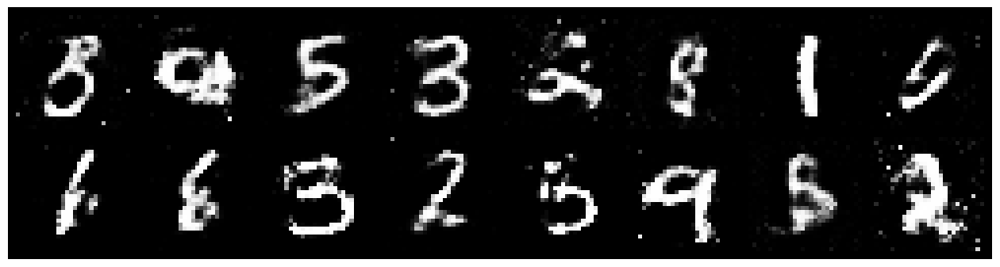

Epoch: [86/200], Batch Num: [300/600]
Discriminator Loss: 1.2347, Generator Loss: 0.9987
D(x): 0.5580, D(G(z)): 0.4222


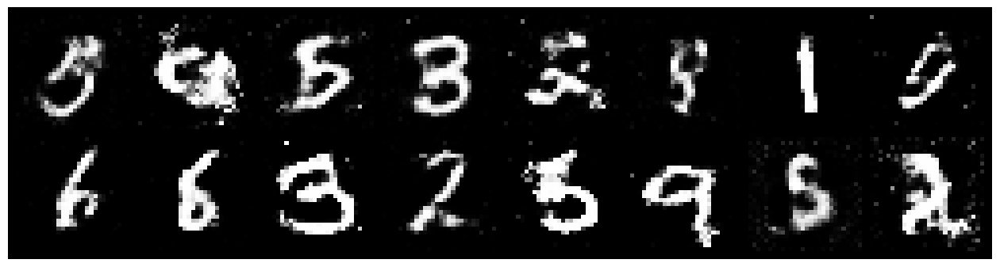

Epoch: [87/200], Batch Num: [0/600]
Discriminator Loss: 1.3062, Generator Loss: 0.8854
D(x): 0.5926, D(G(z)): 0.4721


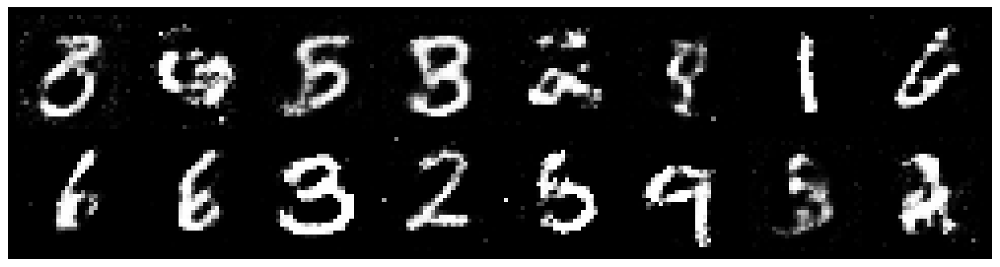

Epoch: [87/200], Batch Num: [300/600]
Discriminator Loss: 1.3224, Generator Loss: 0.9842
D(x): 0.5706, D(G(z)): 0.4585


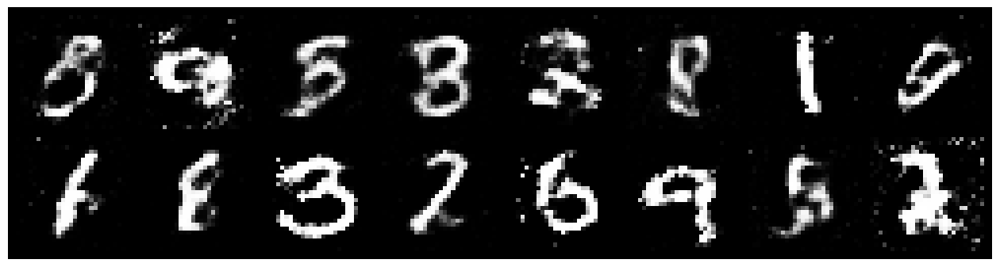

Epoch: [88/200], Batch Num: [0/600]
Discriminator Loss: 1.2125, Generator Loss: 0.9126
D(x): 0.5584, D(G(z)): 0.4141


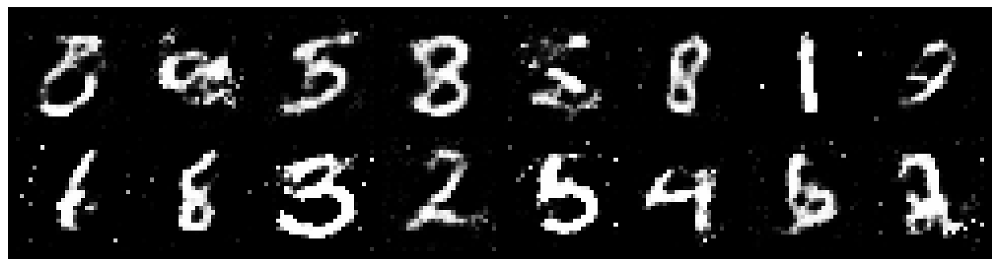

Epoch: [88/200], Batch Num: [300/600]
Discriminator Loss: 1.1596, Generator Loss: 1.0599
D(x): 0.6093, D(G(z)): 0.3983


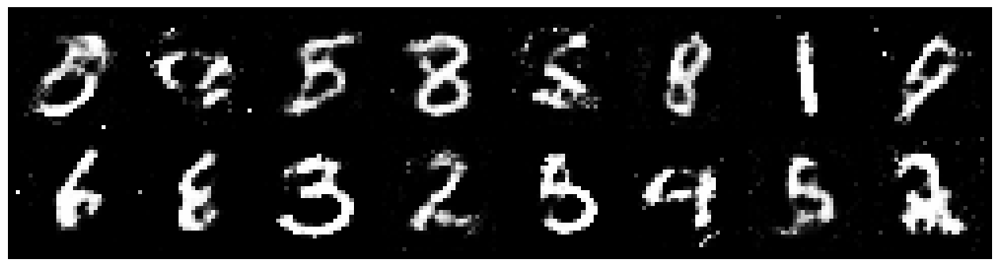

Epoch: [89/200], Batch Num: [0/600]
Discriminator Loss: 1.2420, Generator Loss: 1.0380
D(x): 0.6052, D(G(z)): 0.4495


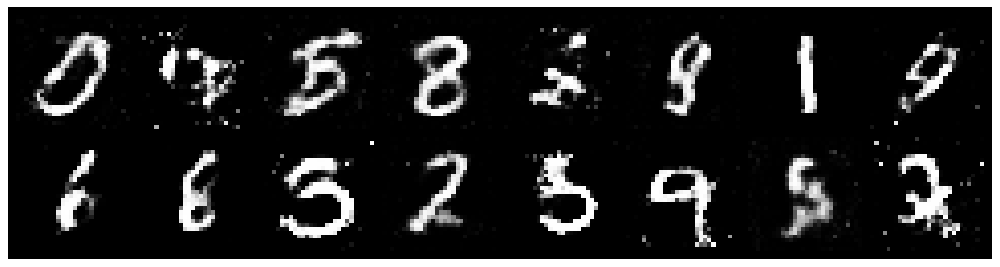

Epoch: [89/200], Batch Num: [300/600]
Discriminator Loss: 1.1941, Generator Loss: 0.9996
D(x): 0.5676, D(G(z)): 0.4114


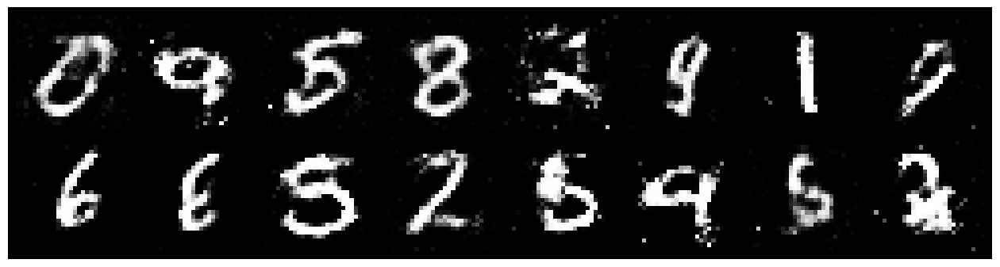

Epoch: [90/200], Batch Num: [0/600]
Discriminator Loss: 1.3958, Generator Loss: 0.9020
D(x): 0.5226, D(G(z)): 0.4789


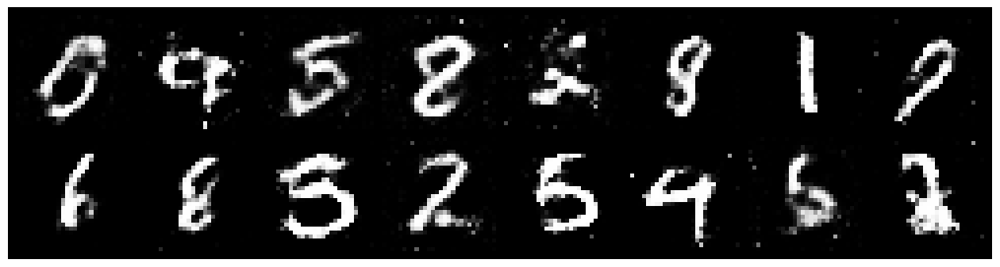

Epoch: [90/200], Batch Num: [300/600]
Discriminator Loss: 1.2268, Generator Loss: 1.0098
D(x): 0.5407, D(G(z)): 0.3971


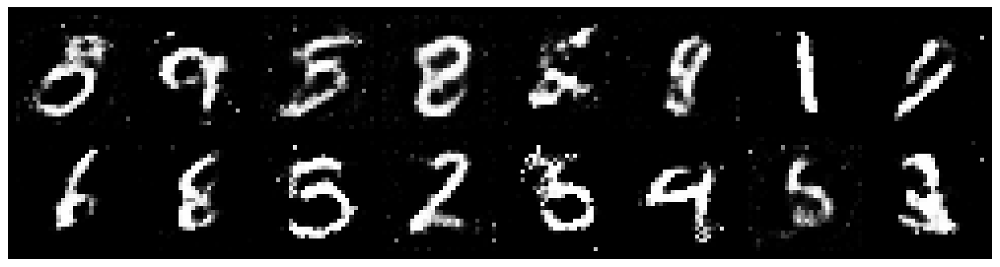

Epoch: [91/200], Batch Num: [0/600]
Discriminator Loss: 1.3037, Generator Loss: 0.8775
D(x): 0.5326, D(G(z)): 0.4474


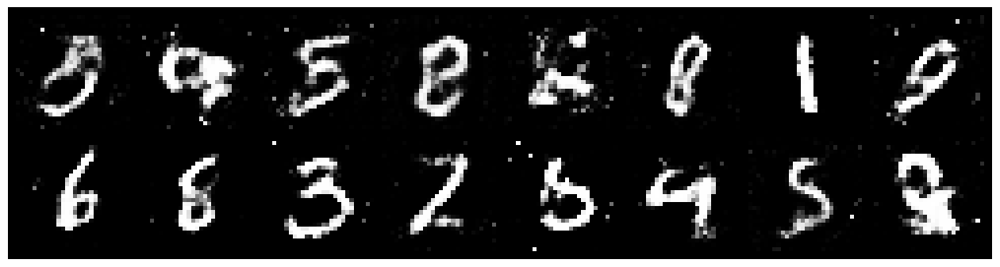

Epoch: [91/200], Batch Num: [300/600]
Discriminator Loss: 1.1132, Generator Loss: 1.2490
D(x): 0.5887, D(G(z)): 0.3874


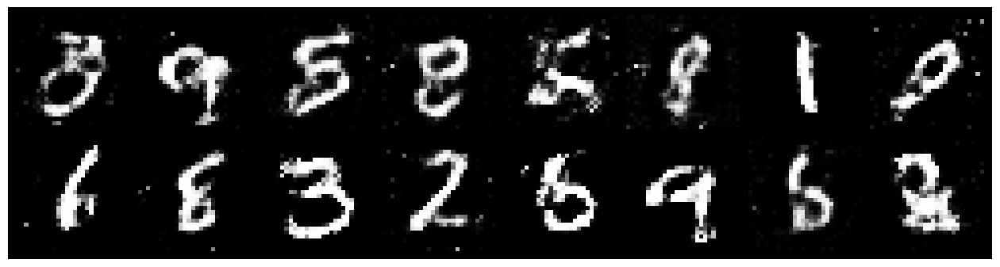

Epoch: [92/200], Batch Num: [0/600]
Discriminator Loss: 1.2651, Generator Loss: 0.8813
D(x): 0.5370, D(G(z)): 0.4273


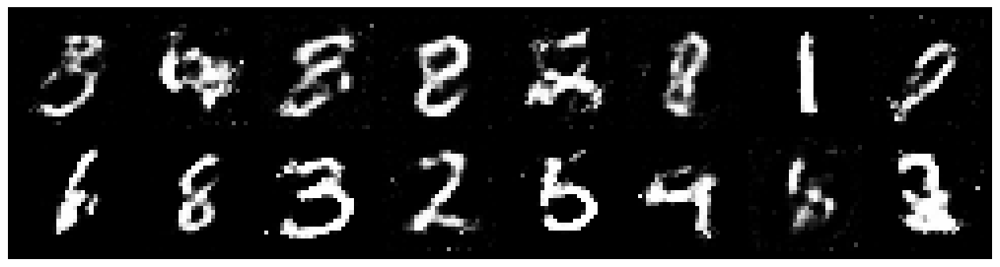

Epoch: [92/200], Batch Num: [300/600]
Discriminator Loss: 1.2260, Generator Loss: 0.8981
D(x): 0.5374, D(G(z)): 0.4053


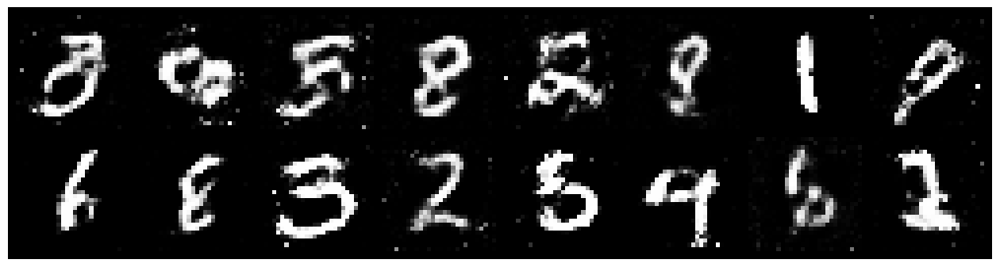

Epoch: [93/200], Batch Num: [0/600]
Discriminator Loss: 1.1282, Generator Loss: 1.1135
D(x): 0.5652, D(G(z)): 0.3623


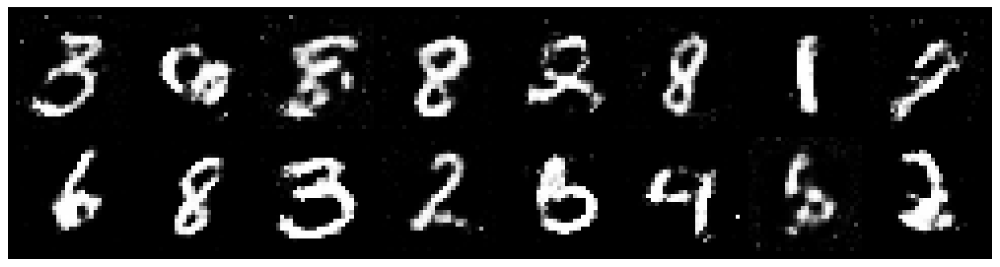

Epoch: [93/200], Batch Num: [300/600]
Discriminator Loss: 1.1884, Generator Loss: 1.1700
D(x): 0.5894, D(G(z)): 0.4000


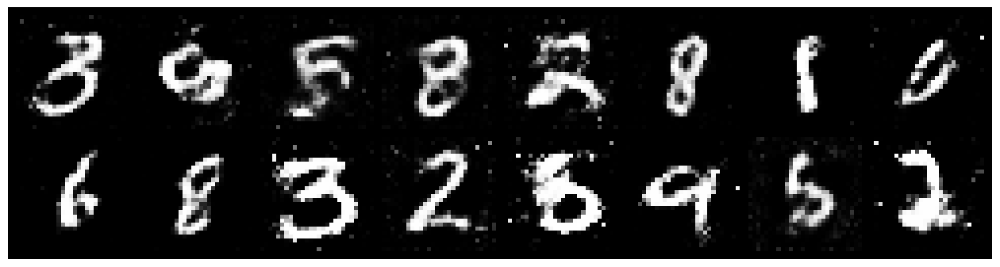

Epoch: [94/200], Batch Num: [0/600]
Discriminator Loss: 1.1987, Generator Loss: 1.1228
D(x): 0.5766, D(G(z)): 0.3966


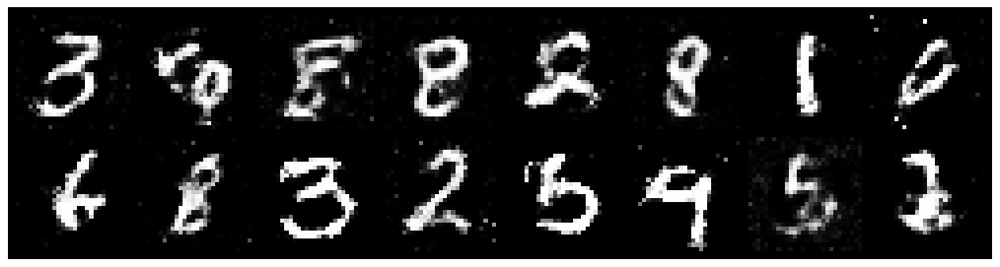

Epoch: [94/200], Batch Num: [300/600]
Discriminator Loss: 1.1738, Generator Loss: 0.9215
D(x): 0.5715, D(G(z)): 0.4004


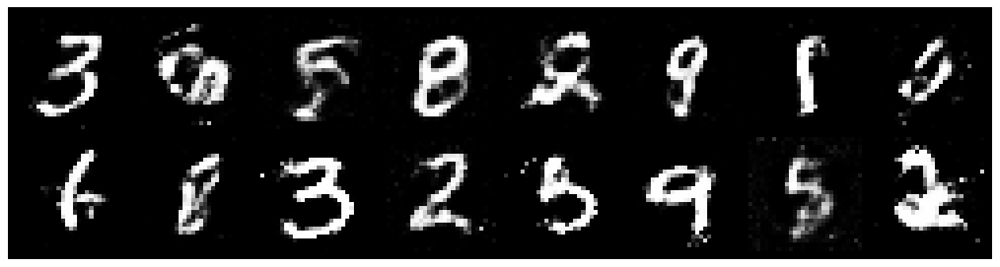

Epoch: [95/200], Batch Num: [0/600]
Discriminator Loss: 1.2928, Generator Loss: 0.9437
D(x): 0.5557, D(G(z)): 0.4568


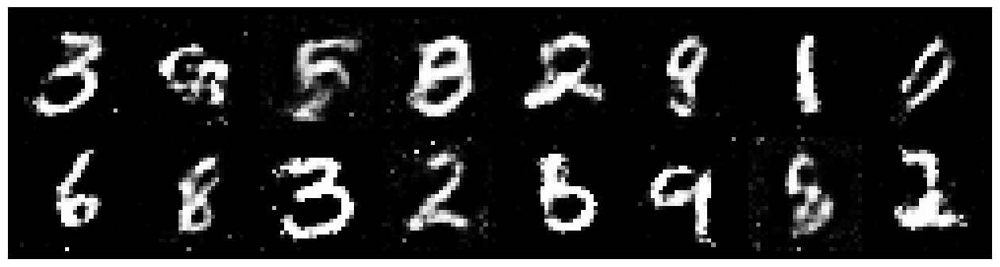

Epoch: [95/200], Batch Num: [300/600]
Discriminator Loss: 1.1269, Generator Loss: 1.2395
D(x): 0.5863, D(G(z)): 0.3796


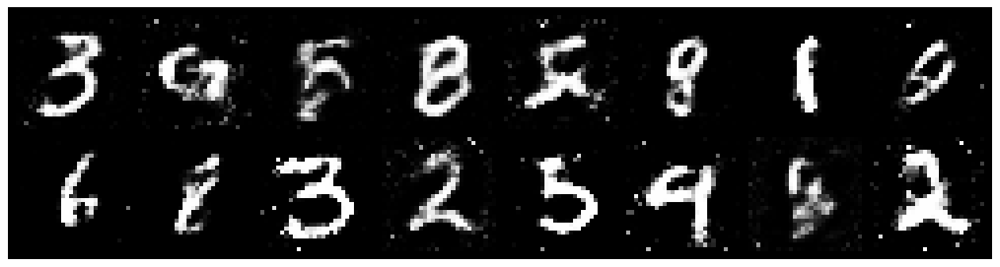

Epoch: [96/200], Batch Num: [0/600]
Discriminator Loss: 1.2952, Generator Loss: 0.9825
D(x): 0.5331, D(G(z)): 0.4300


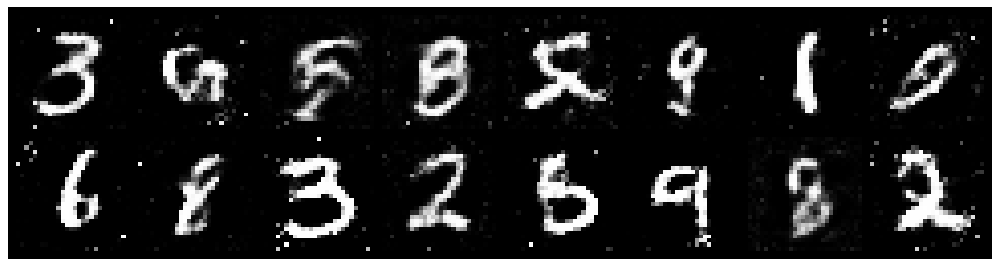

Epoch: [96/200], Batch Num: [300/600]
Discriminator Loss: 1.1390, Generator Loss: 0.9604
D(x): 0.5936, D(G(z)): 0.4065


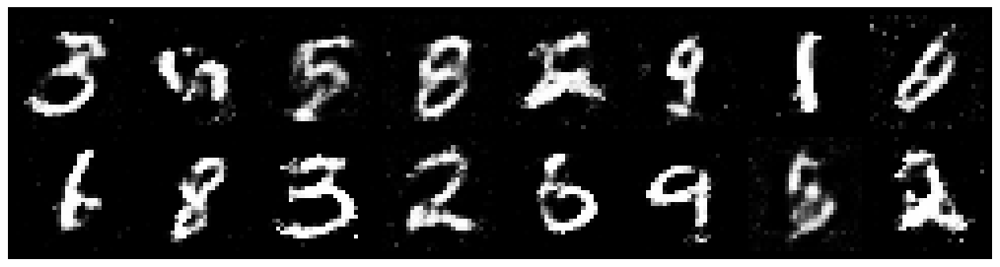

Epoch: [97/200], Batch Num: [0/600]
Discriminator Loss: 1.1627, Generator Loss: 0.9833
D(x): 0.5654, D(G(z)): 0.3982


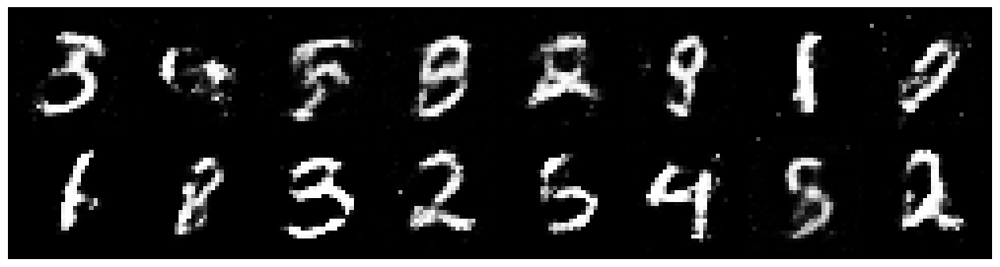

Epoch: [97/200], Batch Num: [300/600]
Discriminator Loss: 1.2349, Generator Loss: 1.0501
D(x): 0.5617, D(G(z)): 0.4242


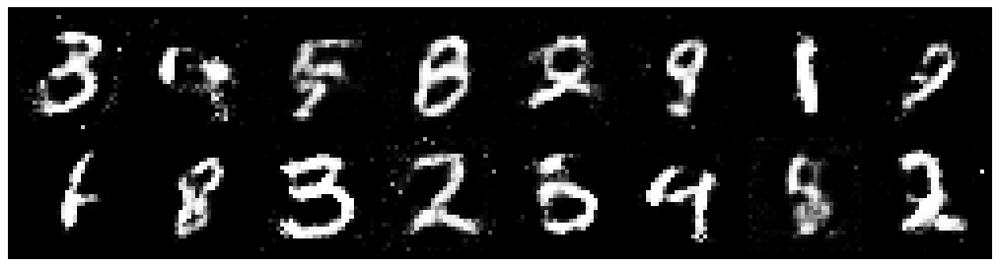

Epoch: [98/200], Batch Num: [0/600]
Discriminator Loss: 1.2434, Generator Loss: 0.9510
D(x): 0.5616, D(G(z)): 0.4199


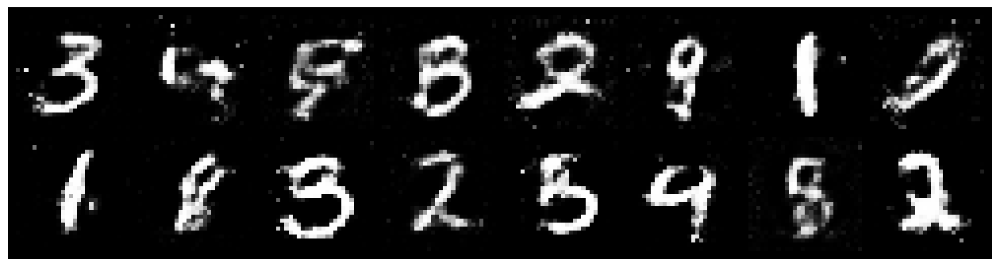

Epoch: [98/200], Batch Num: [300/600]
Discriminator Loss: 1.3468, Generator Loss: 0.7948
D(x): 0.5214, D(G(z)): 0.4576


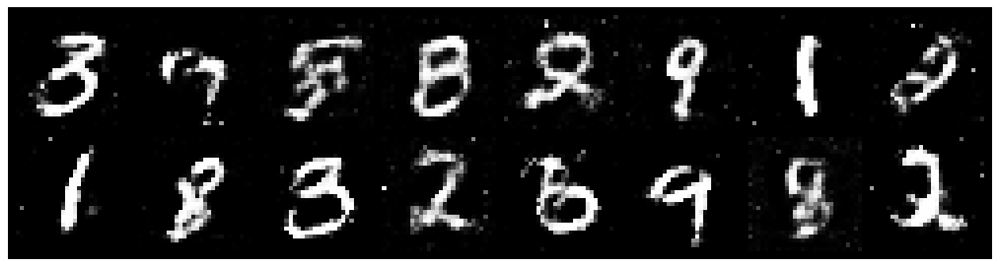

Epoch: [99/200], Batch Num: [0/600]
Discriminator Loss: 1.2819, Generator Loss: 0.8173
D(x): 0.5521, D(G(z)): 0.4553


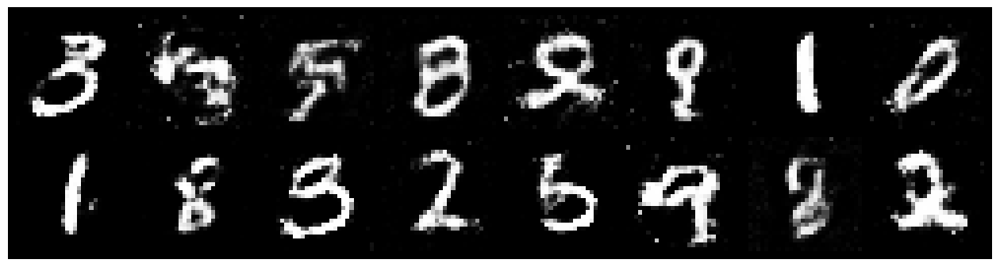

Epoch: [99/200], Batch Num: [300/600]
Discriminator Loss: 1.1826, Generator Loss: 1.0399
D(x): 0.5741, D(G(z)): 0.3966


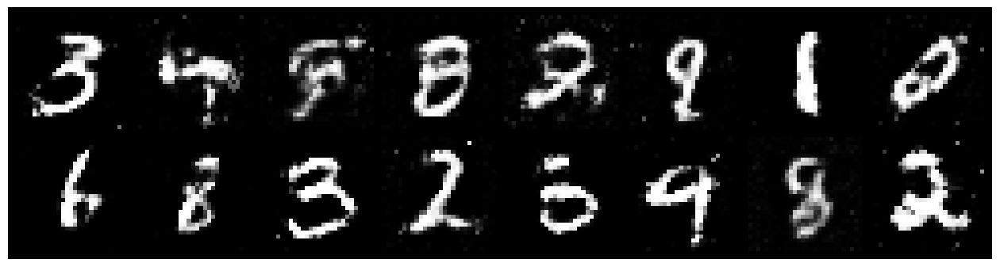

Epoch: [100/200], Batch Num: [0/600]
Discriminator Loss: 1.1887, Generator Loss: 1.0075
D(x): 0.5905, D(G(z)): 0.4154


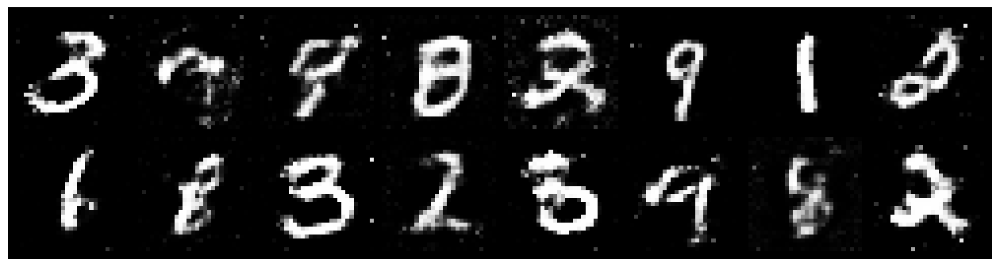

Epoch: [100/200], Batch Num: [300/600]
Discriminator Loss: 1.2255, Generator Loss: 0.9756
D(x): 0.5974, D(G(z)): 0.4444


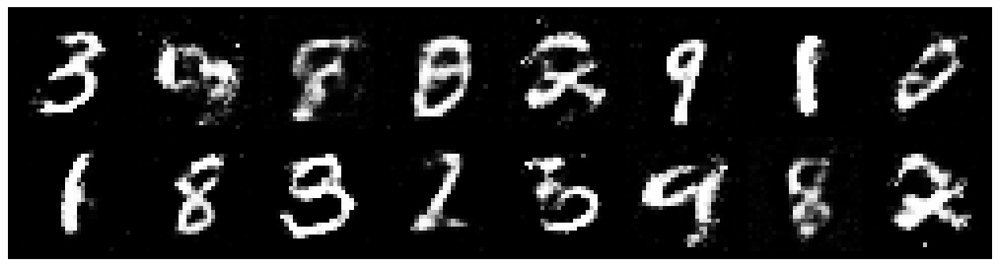

Epoch: [101/200], Batch Num: [0/600]
Discriminator Loss: 1.2429, Generator Loss: 1.0114
D(x): 0.5749, D(G(z)): 0.4287


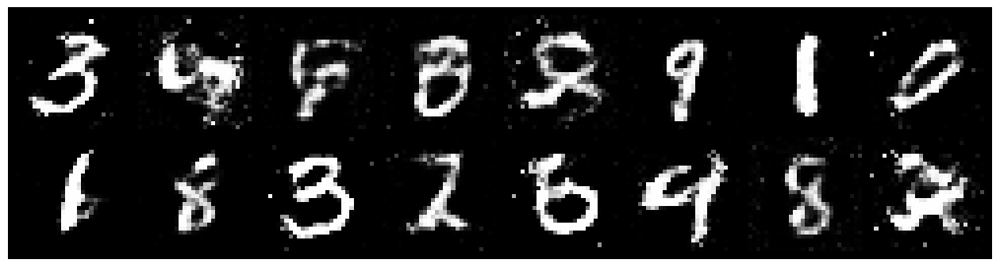

Epoch: [101/200], Batch Num: [300/600]
Discriminator Loss: 1.1598, Generator Loss: 1.0568
D(x): 0.5824, D(G(z)): 0.3943


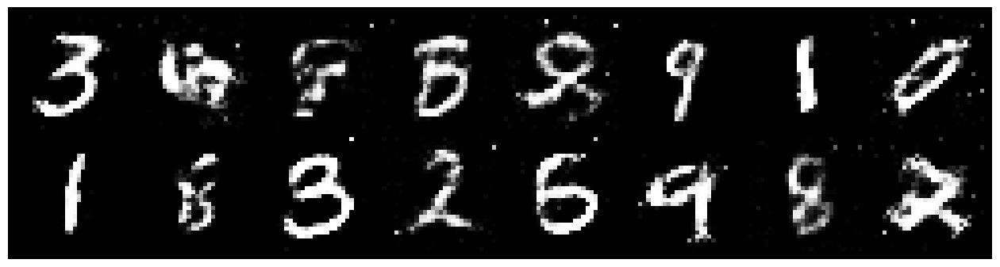

Epoch: [102/200], Batch Num: [0/600]
Discriminator Loss: 1.2074, Generator Loss: 0.9779
D(x): 0.5340, D(G(z)): 0.3895


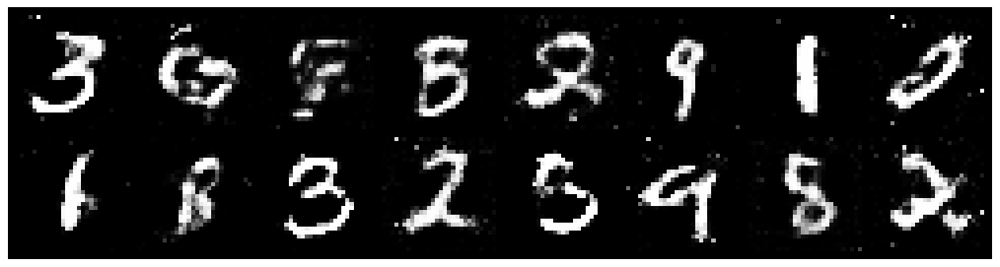

Epoch: [102/200], Batch Num: [300/600]
Discriminator Loss: 1.2100, Generator Loss: 1.0105
D(x): 0.5497, D(G(z)): 0.4111


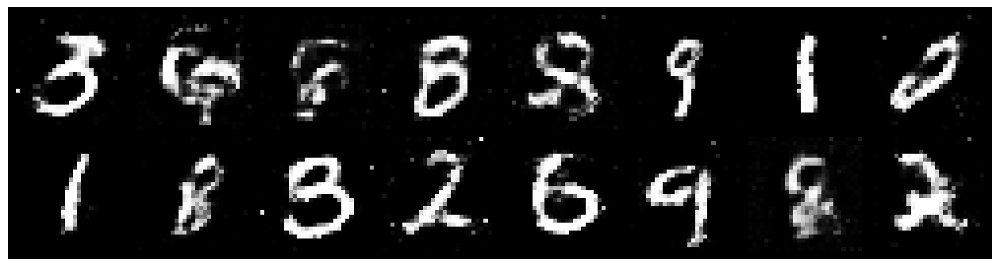

Epoch: [103/200], Batch Num: [0/600]
Discriminator Loss: 1.2784, Generator Loss: 1.0136
D(x): 0.5574, D(G(z)): 0.4258


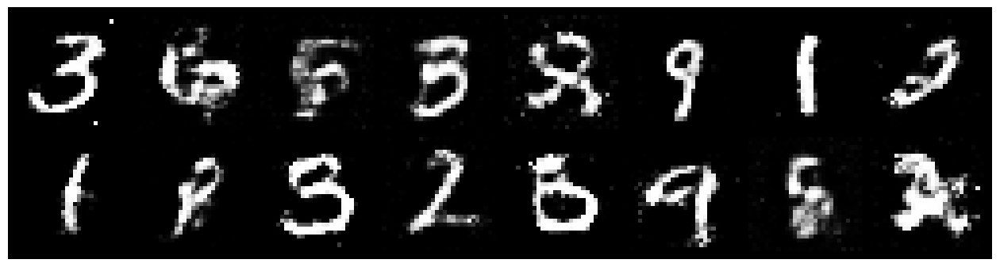

Epoch: [103/200], Batch Num: [300/600]
Discriminator Loss: 1.1887, Generator Loss: 0.9825
D(x): 0.5449, D(G(z)): 0.3942


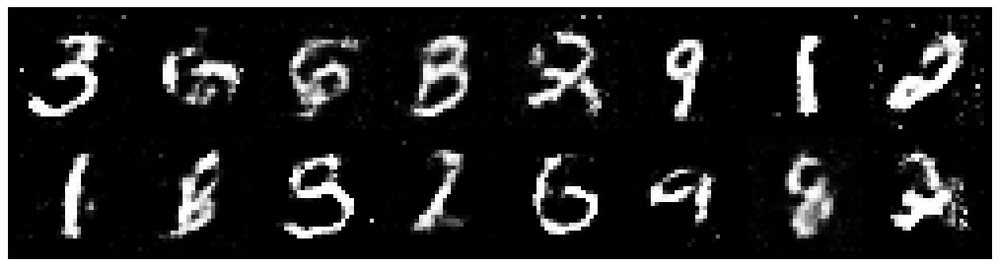

Epoch: [104/200], Batch Num: [0/600]
Discriminator Loss: 1.2063, Generator Loss: 1.0163
D(x): 0.5246, D(G(z)): 0.3856


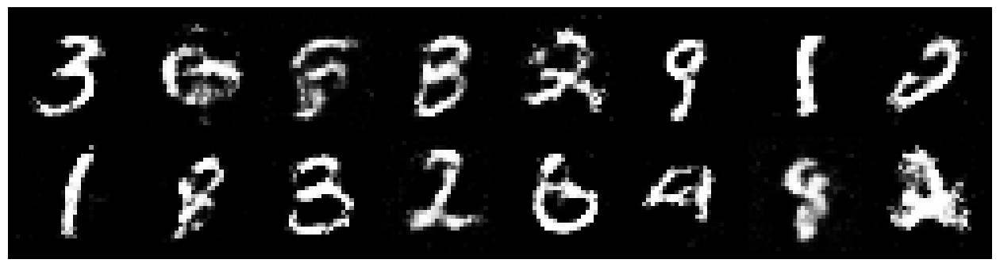

Epoch: [104/200], Batch Num: [300/600]
Discriminator Loss: 1.1453, Generator Loss: 0.8694
D(x): 0.5779, D(G(z)): 0.4232


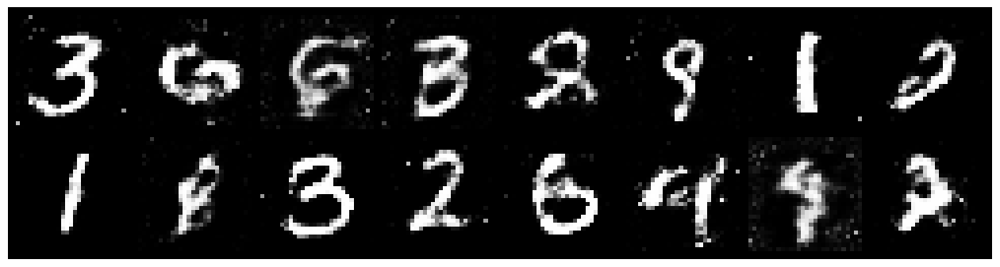

Epoch: [105/200], Batch Num: [0/600]
Discriminator Loss: 1.1974, Generator Loss: 0.9767
D(x): 0.5620, D(G(z)): 0.4077


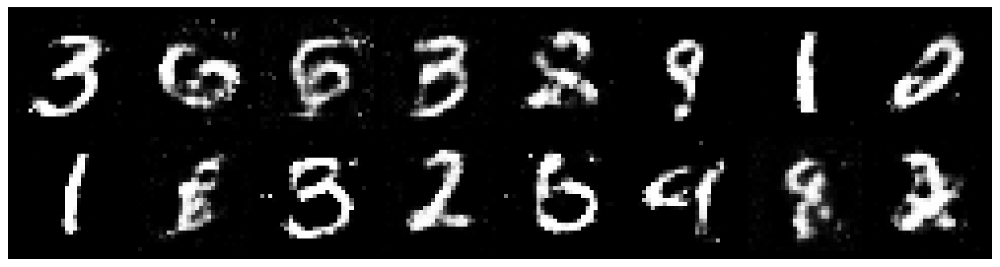

Epoch: [105/200], Batch Num: [300/600]
Discriminator Loss: 1.2592, Generator Loss: 1.1029
D(x): 0.5350, D(G(z)): 0.4002


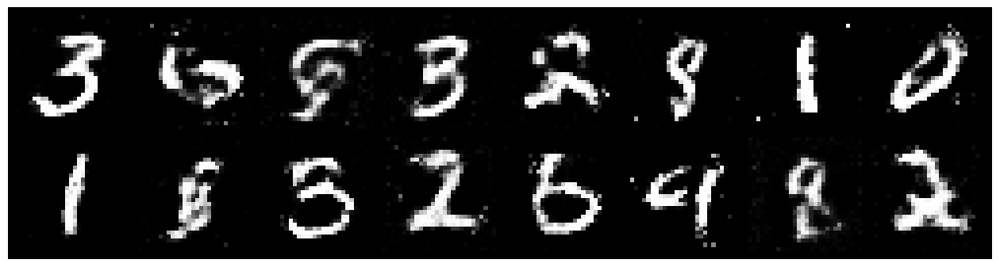

Epoch: [106/200], Batch Num: [0/600]
Discriminator Loss: 1.1676, Generator Loss: 1.0600
D(x): 0.5376, D(G(z)): 0.3570


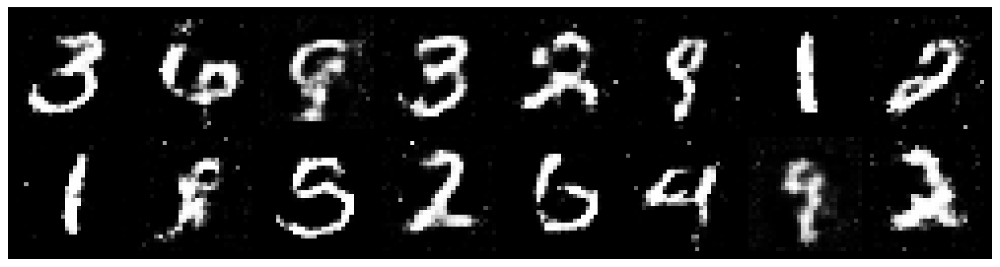

Epoch: [106/200], Batch Num: [300/600]
Discriminator Loss: 1.1012, Generator Loss: 1.0802
D(x): 0.5745, D(G(z)): 0.3629


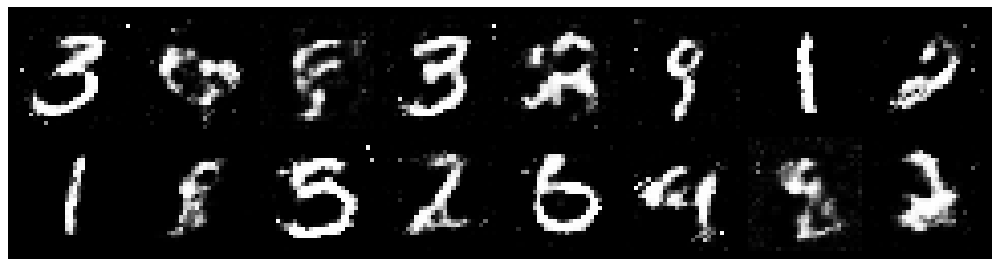

Epoch: [107/200], Batch Num: [0/600]
Discriminator Loss: 1.2393, Generator Loss: 0.8340
D(x): 0.5558, D(G(z)): 0.4489


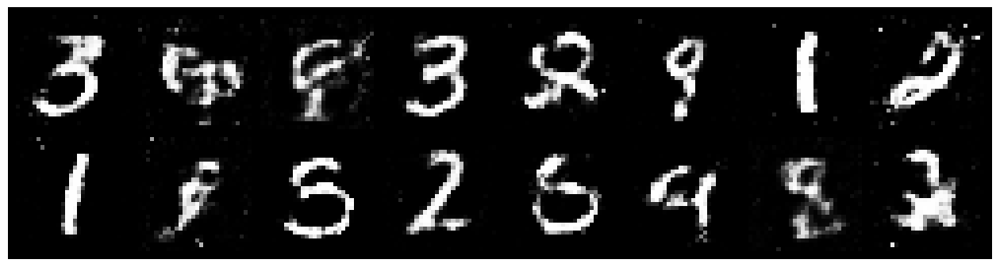

Epoch: [107/200], Batch Num: [300/600]
Discriminator Loss: 1.2986, Generator Loss: 0.9734
D(x): 0.5607, D(G(z)): 0.4427


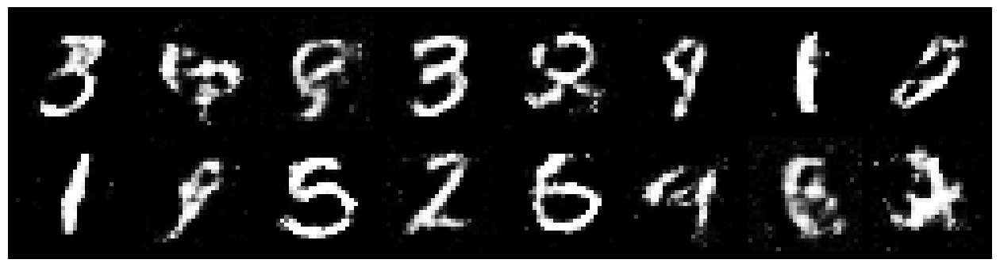

Epoch: [108/200], Batch Num: [0/600]
Discriminator Loss: 1.4262, Generator Loss: 0.7782
D(x): 0.4865, D(G(z)): 0.4379


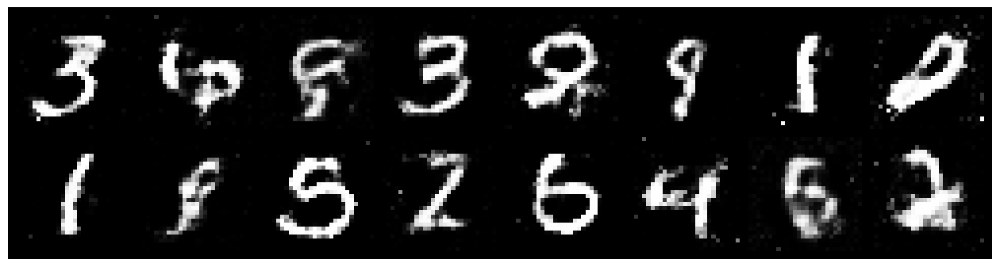

Epoch: [108/200], Batch Num: [300/600]
Discriminator Loss: 1.2251, Generator Loss: 0.9031
D(x): 0.5693, D(G(z)): 0.4356


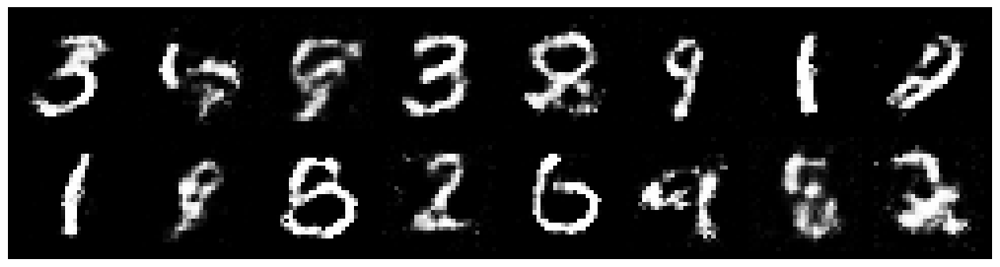

Epoch: [109/200], Batch Num: [0/600]
Discriminator Loss: 1.2974, Generator Loss: 0.7931
D(x): 0.5776, D(G(z)): 0.4799


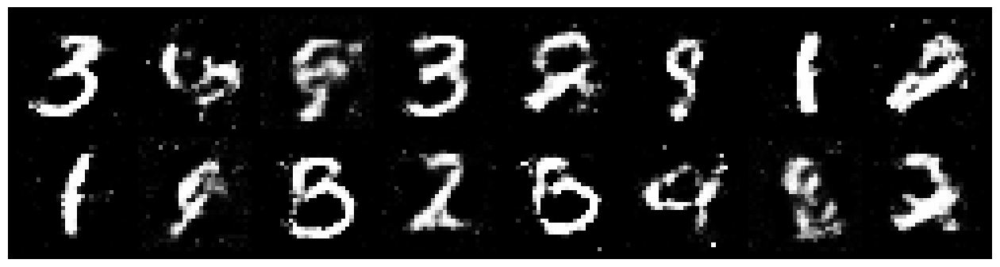

Epoch: [109/200], Batch Num: [300/600]
Discriminator Loss: 1.4105, Generator Loss: 0.7435
D(x): 0.5435, D(G(z)): 0.5160


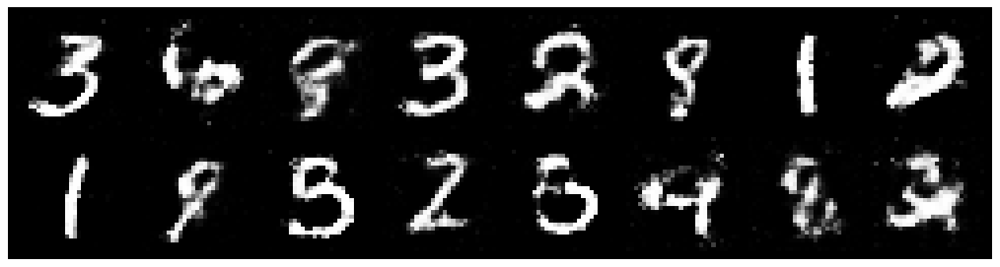

Epoch: [110/200], Batch Num: [0/600]
Discriminator Loss: 1.2757, Generator Loss: 1.0957
D(x): 0.5425, D(G(z)): 0.3999


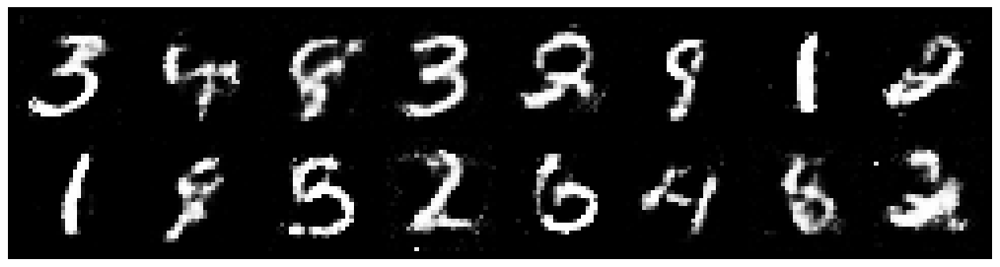

Epoch: [110/200], Batch Num: [300/600]
Discriminator Loss: 1.1732, Generator Loss: 0.9829
D(x): 0.6033, D(G(z)): 0.4229


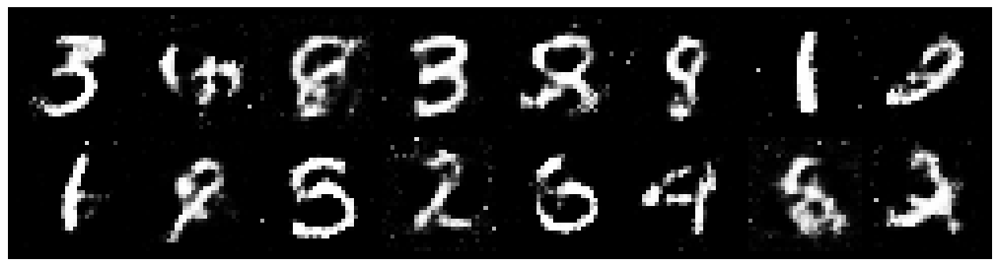

Epoch: [111/200], Batch Num: [0/600]
Discriminator Loss: 1.1070, Generator Loss: 1.0407
D(x): 0.5641, D(G(z)): 0.3700


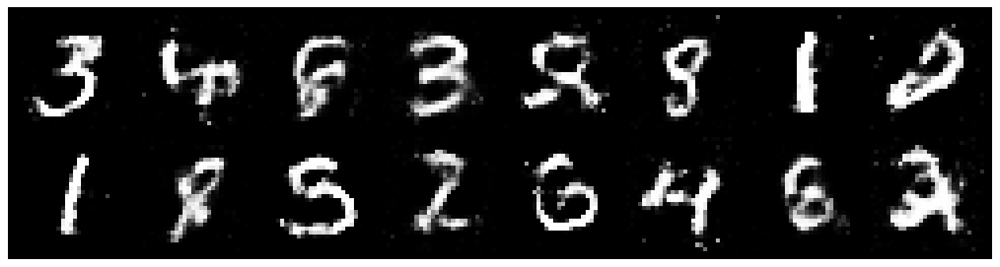

Epoch: [111/200], Batch Num: [300/600]
Discriminator Loss: 1.1616, Generator Loss: 1.0649
D(x): 0.5858, D(G(z)): 0.4063


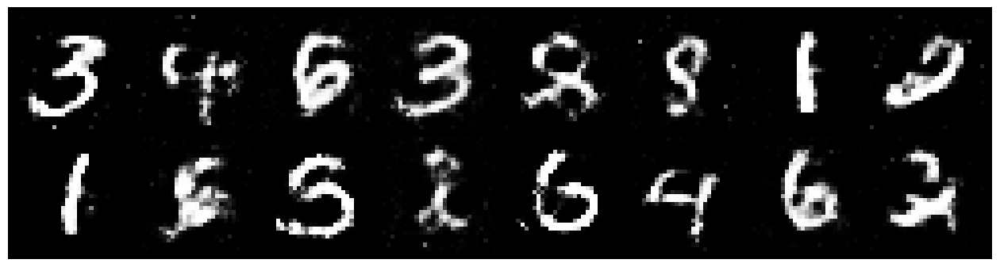

Epoch: [112/200], Batch Num: [0/600]
Discriminator Loss: 1.2181, Generator Loss: 0.9760
D(x): 0.5476, D(G(z)): 0.4002


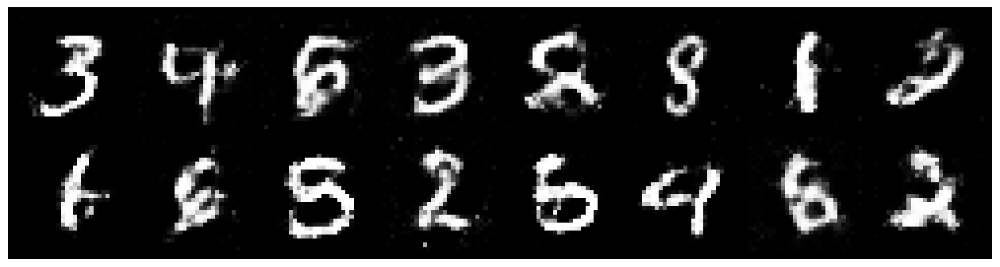

Epoch: [112/200], Batch Num: [300/600]
Discriminator Loss: 1.2505, Generator Loss: 0.8855
D(x): 0.5892, D(G(z)): 0.4667


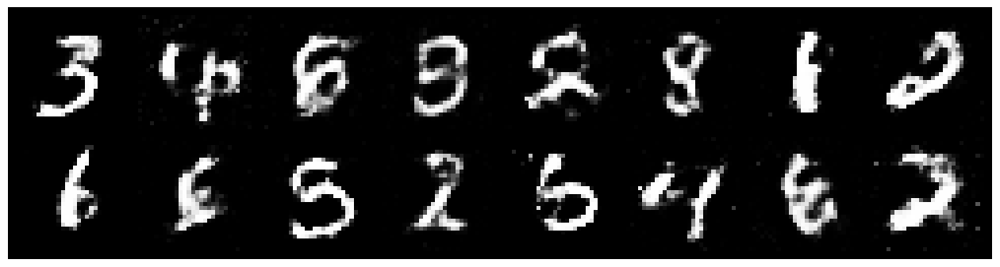

Epoch: [113/200], Batch Num: [0/600]
Discriminator Loss: 1.1967, Generator Loss: 0.9306
D(x): 0.5812, D(G(z)): 0.4101


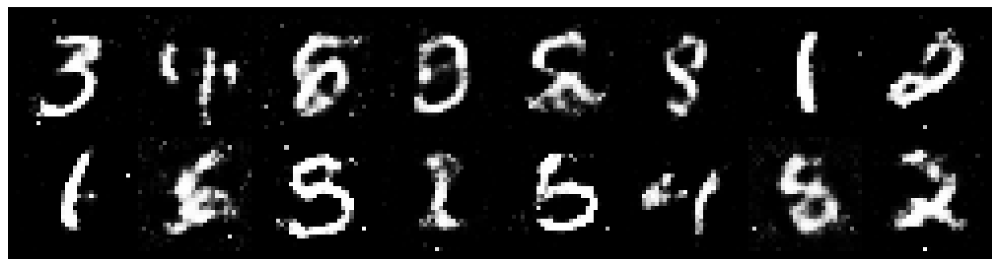

Epoch: [113/200], Batch Num: [300/600]
Discriminator Loss: 1.1278, Generator Loss: 0.9474
D(x): 0.5863, D(G(z)): 0.3957


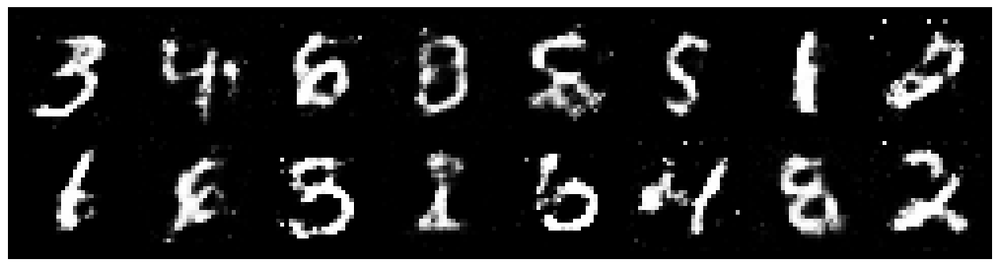

Epoch: [114/200], Batch Num: [0/600]
Discriminator Loss: 1.3865, Generator Loss: 1.0732
D(x): 0.4955, D(G(z)): 0.4251


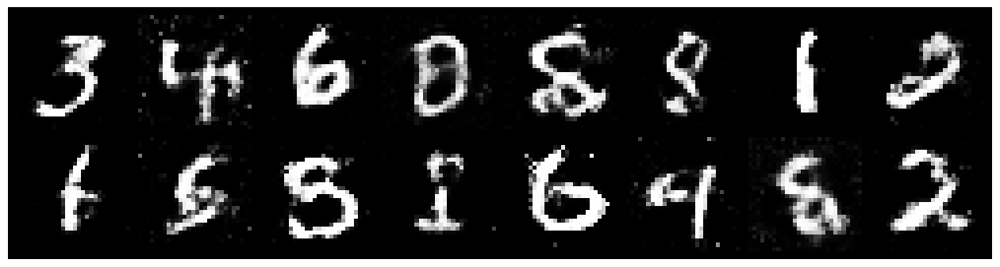

Epoch: [114/200], Batch Num: [300/600]
Discriminator Loss: 1.2862, Generator Loss: 0.8780
D(x): 0.5381, D(G(z)): 0.4237


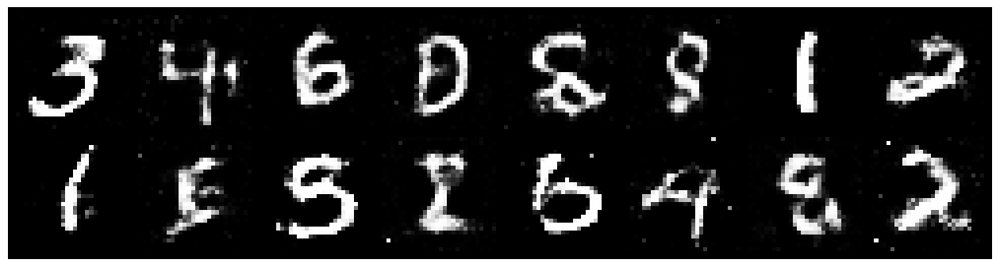

Epoch: [115/200], Batch Num: [0/600]
Discriminator Loss: 1.2403, Generator Loss: 0.9912
D(x): 0.5252, D(G(z)): 0.3974


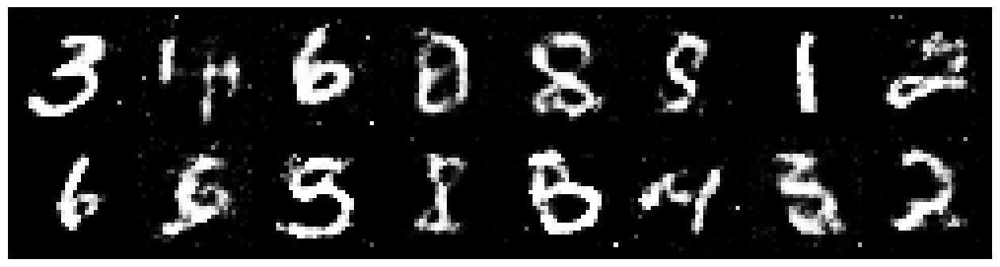

Epoch: [115/200], Batch Num: [300/600]
Discriminator Loss: 1.2146, Generator Loss: 0.9575
D(x): 0.5739, D(G(z)): 0.4322


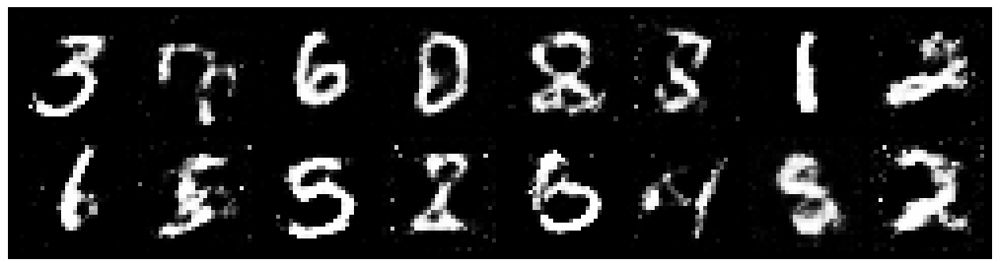

Epoch: [116/200], Batch Num: [0/600]
Discriminator Loss: 1.1885, Generator Loss: 1.0703
D(x): 0.5790, D(G(z)): 0.4123


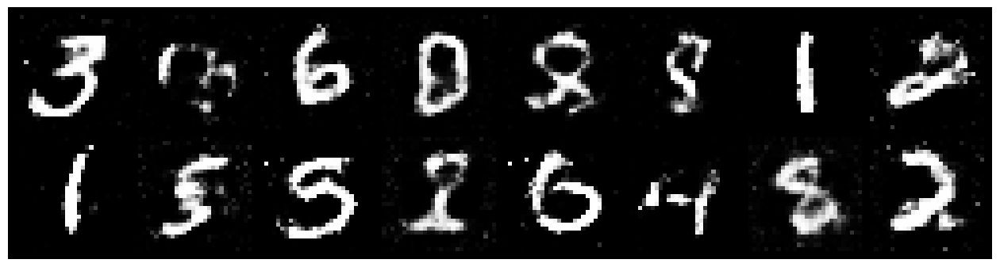

Epoch: [116/200], Batch Num: [300/600]
Discriminator Loss: 1.2019, Generator Loss: 0.9558
D(x): 0.5783, D(G(z)): 0.3946


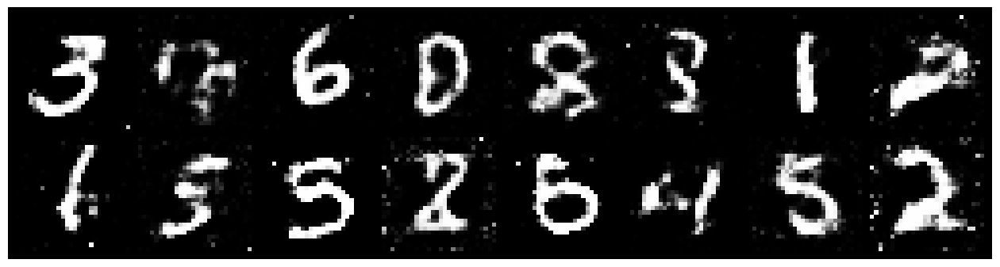

Epoch: [117/200], Batch Num: [0/600]
Discriminator Loss: 1.0807, Generator Loss: 1.1287
D(x): 0.5703, D(G(z)): 0.3559


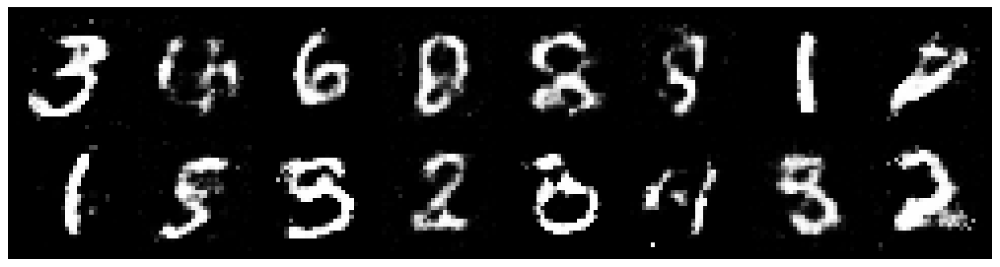

Epoch: [117/200], Batch Num: [300/600]
Discriminator Loss: 1.2402, Generator Loss: 0.9546
D(x): 0.5840, D(G(z)): 0.4378


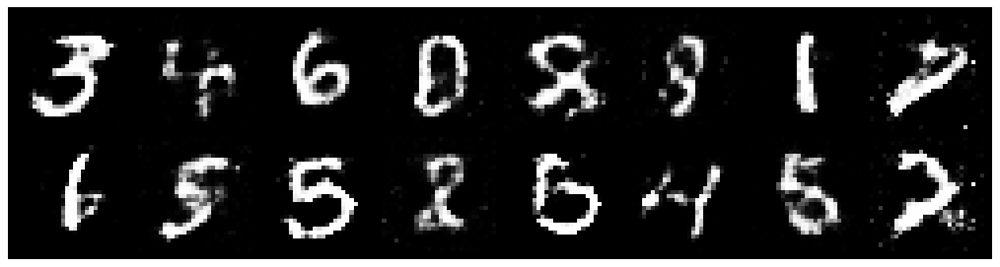

Epoch: [118/200], Batch Num: [0/600]
Discriminator Loss: 1.2563, Generator Loss: 0.8878
D(x): 0.5347, D(G(z)): 0.4306


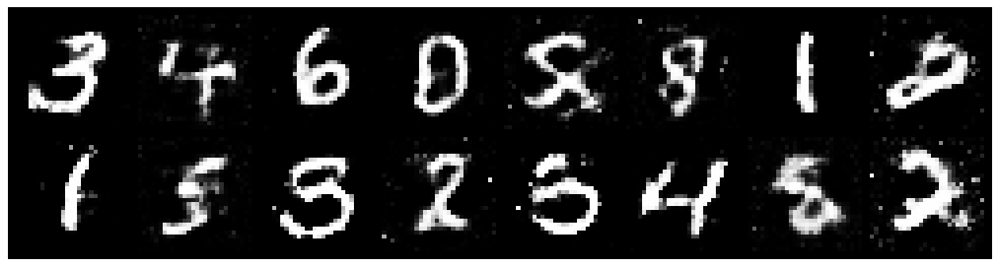

Epoch: [118/200], Batch Num: [300/600]
Discriminator Loss: 1.4014, Generator Loss: 0.9654
D(x): 0.4916, D(G(z)): 0.4370


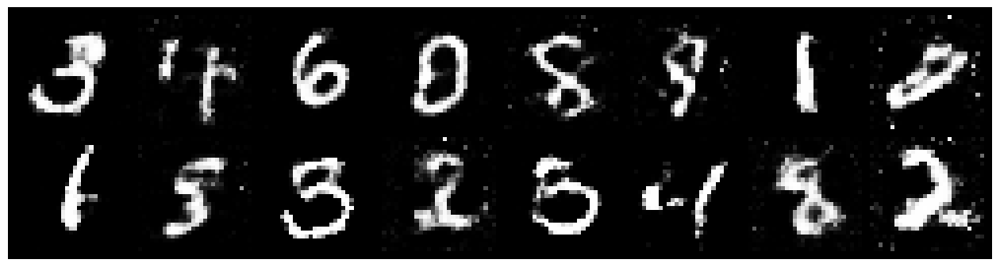

Epoch: [119/200], Batch Num: [0/600]
Discriminator Loss: 1.2334, Generator Loss: 1.0362
D(x): 0.5353, D(G(z)): 0.3994


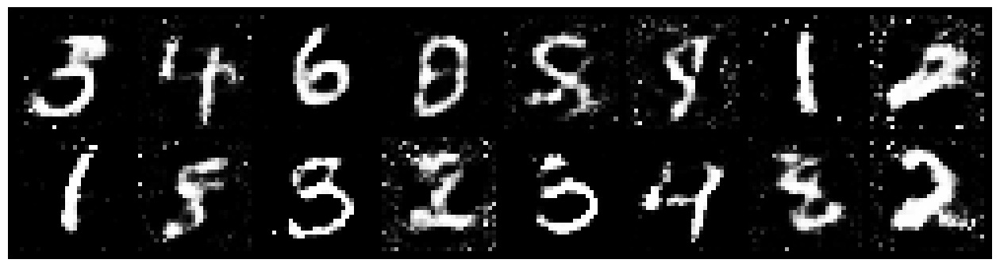

Epoch: [119/200], Batch Num: [300/600]
Discriminator Loss: 1.2986, Generator Loss: 0.8507
D(x): 0.5481, D(G(z)): 0.4694


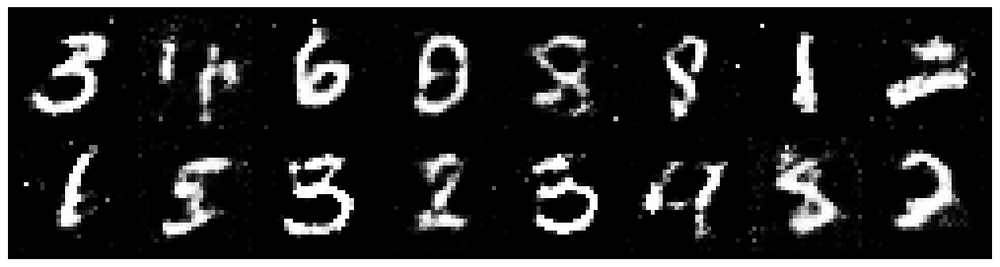

Epoch: [120/200], Batch Num: [0/600]
Discriminator Loss: 1.2237, Generator Loss: 0.8944
D(x): 0.5530, D(G(z)): 0.4168


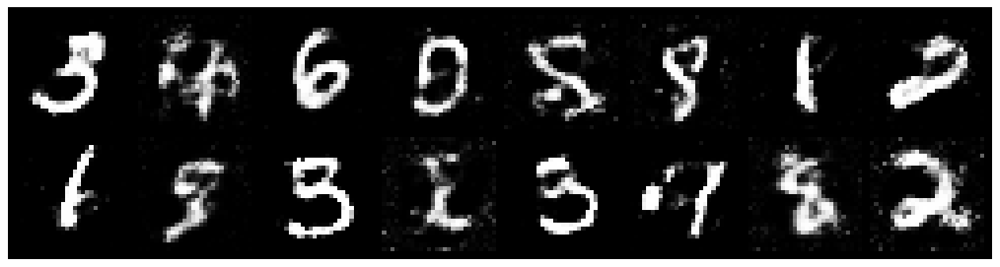

Epoch: [120/200], Batch Num: [300/600]
Discriminator Loss: 1.2439, Generator Loss: 0.8832
D(x): 0.5701, D(G(z)): 0.4562


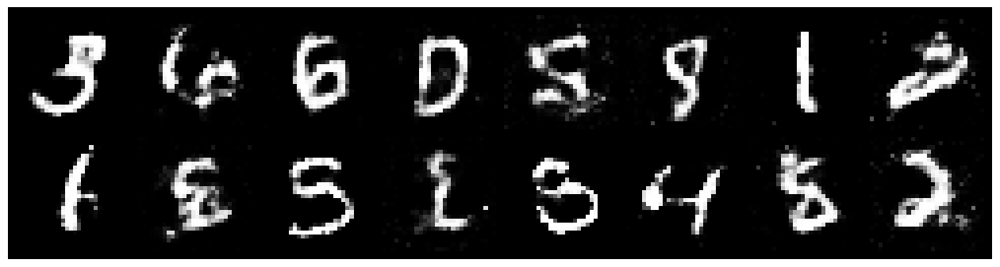

Epoch: [121/200], Batch Num: [0/600]
Discriminator Loss: 1.2235, Generator Loss: 0.8847
D(x): 0.5469, D(G(z)): 0.4245


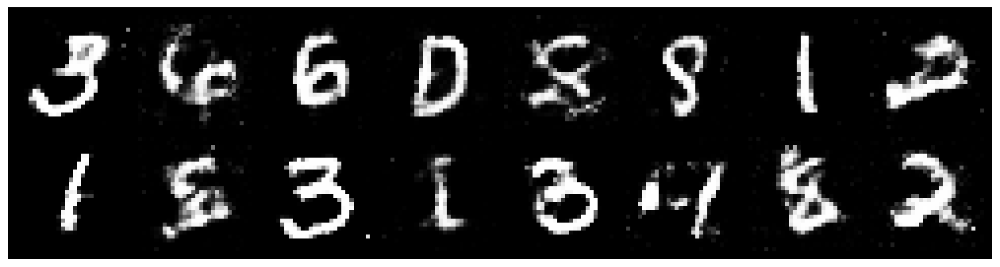

Epoch: [121/200], Batch Num: [300/600]
Discriminator Loss: 1.3232, Generator Loss: 0.8769
D(x): 0.5501, D(G(z)): 0.4472


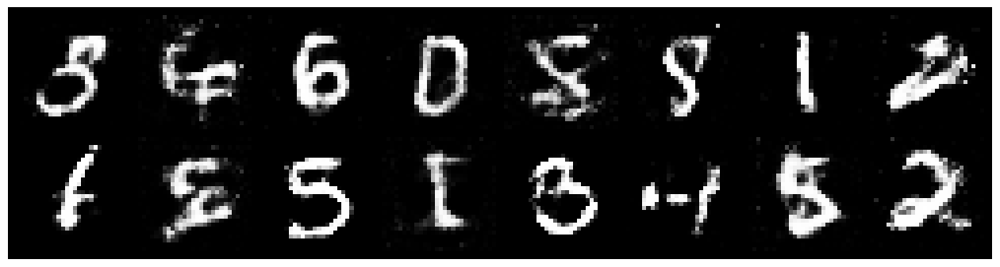

Epoch: [122/200], Batch Num: [0/600]
Discriminator Loss: 1.3192, Generator Loss: 0.8778
D(x): 0.5320, D(G(z)): 0.4487


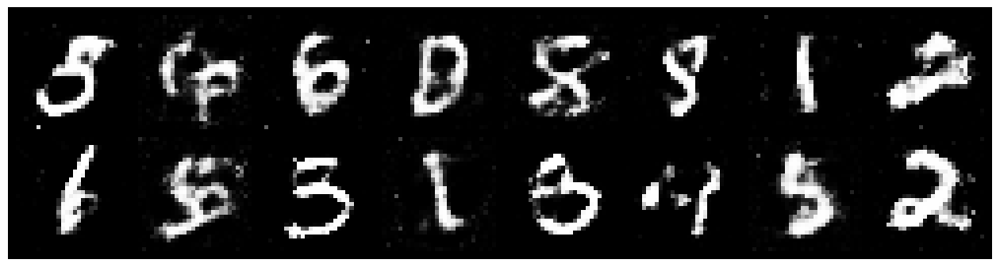

Epoch: [122/200], Batch Num: [300/600]
Discriminator Loss: 1.2443, Generator Loss: 1.0202
D(x): 0.5430, D(G(z)): 0.4206


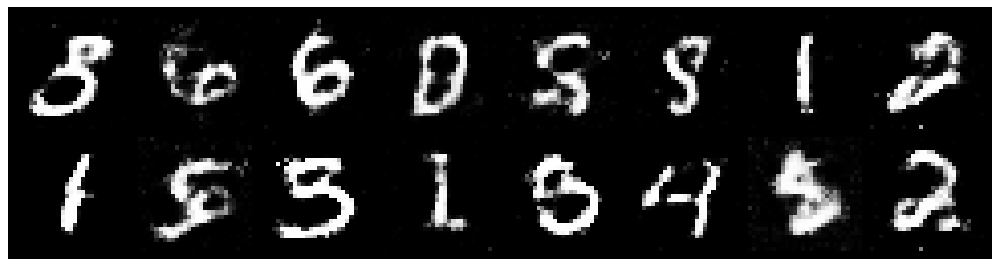

Epoch: [123/200], Batch Num: [0/600]
Discriminator Loss: 1.1890, Generator Loss: 1.2072
D(x): 0.5994, D(G(z)): 0.3950


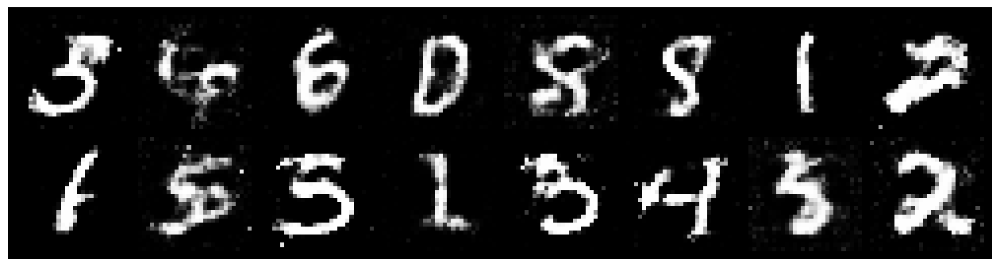

Epoch: [123/200], Batch Num: [300/600]
Discriminator Loss: 1.2845, Generator Loss: 0.8137
D(x): 0.5508, D(G(z)): 0.4530


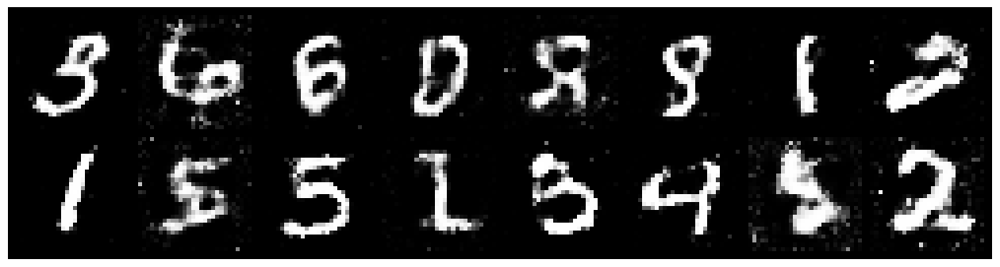

Epoch: [124/200], Batch Num: [0/600]
Discriminator Loss: 1.3484, Generator Loss: 1.0376
D(x): 0.5534, D(G(z)): 0.4631


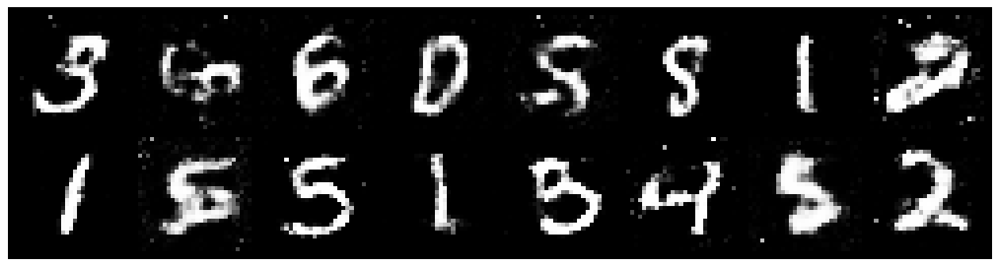

Epoch: [124/200], Batch Num: [300/600]
Discriminator Loss: 1.2914, Generator Loss: 0.7563
D(x): 0.5591, D(G(z)): 0.4762


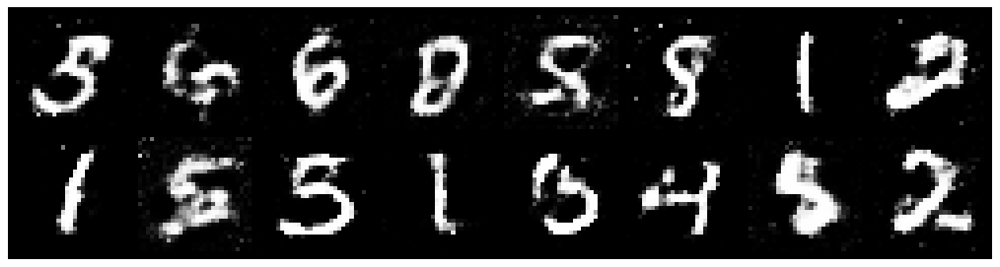

Epoch: [125/200], Batch Num: [0/600]
Discriminator Loss: 1.3137, Generator Loss: 0.8247
D(x): 0.5760, D(G(z)): 0.4724


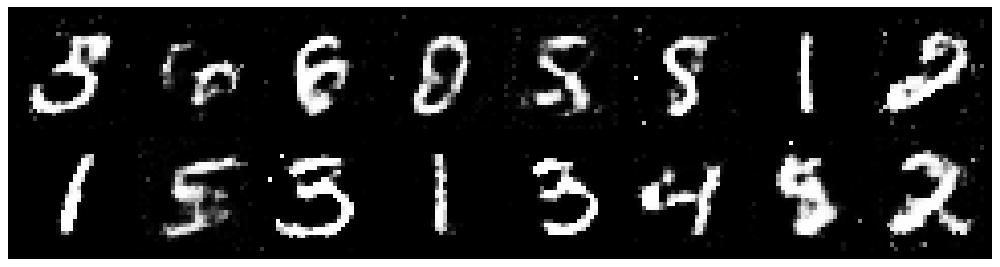

Epoch: [125/200], Batch Num: [300/600]
Discriminator Loss: 1.3328, Generator Loss: 0.8696
D(x): 0.5352, D(G(z)): 0.4560


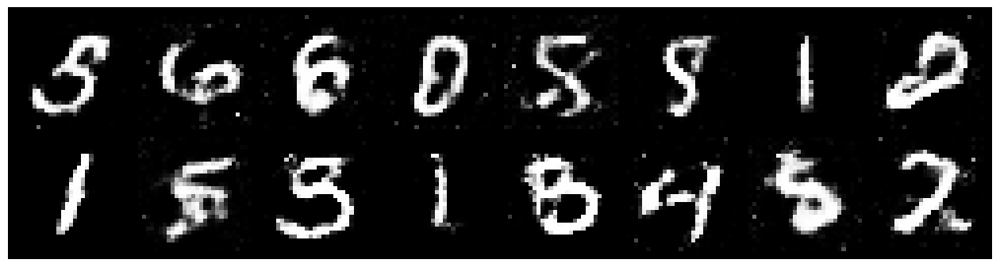

Epoch: [126/200], Batch Num: [0/600]
Discriminator Loss: 1.2845, Generator Loss: 1.0472
D(x): 0.5247, D(G(z)): 0.3925


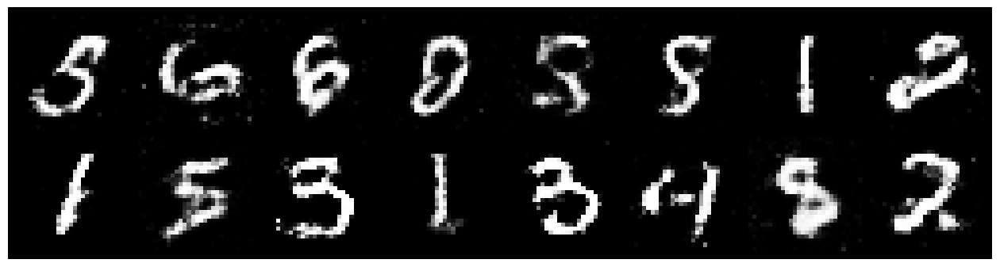

Epoch: [126/200], Batch Num: [300/600]
Discriminator Loss: 1.3333, Generator Loss: 0.8065
D(x): 0.5438, D(G(z)): 0.4712


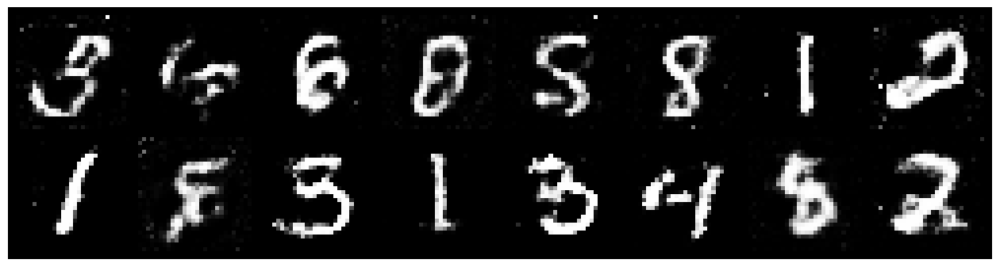

Epoch: [127/200], Batch Num: [0/600]
Discriminator Loss: 1.2863, Generator Loss: 0.8651
D(x): 0.5204, D(G(z)): 0.4287


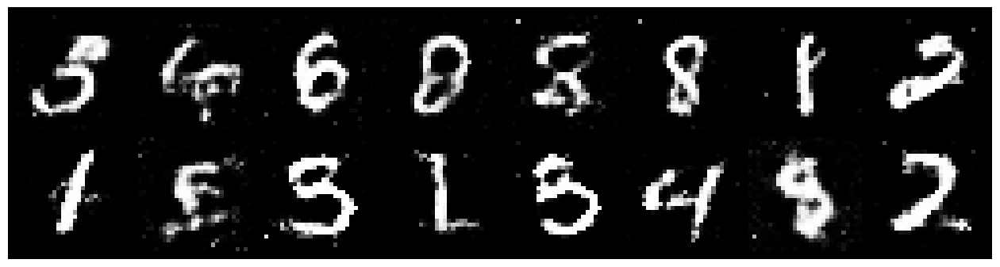

Epoch: [127/200], Batch Num: [300/600]
Discriminator Loss: 1.3169, Generator Loss: 0.9346
D(x): 0.5301, D(G(z)): 0.4400


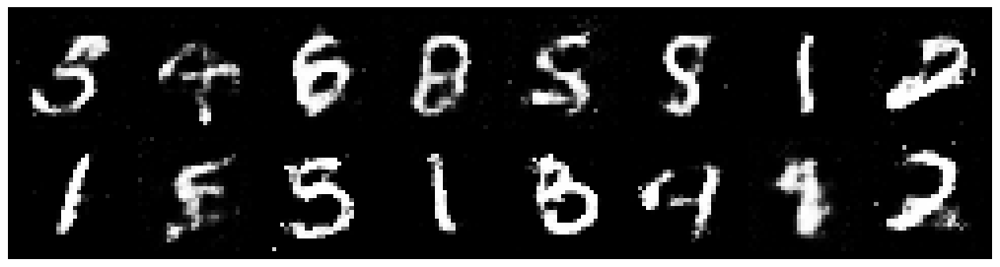

Epoch: [128/200], Batch Num: [0/600]
Discriminator Loss: 1.3010, Generator Loss: 0.9058
D(x): 0.5513, D(G(z)): 0.4519


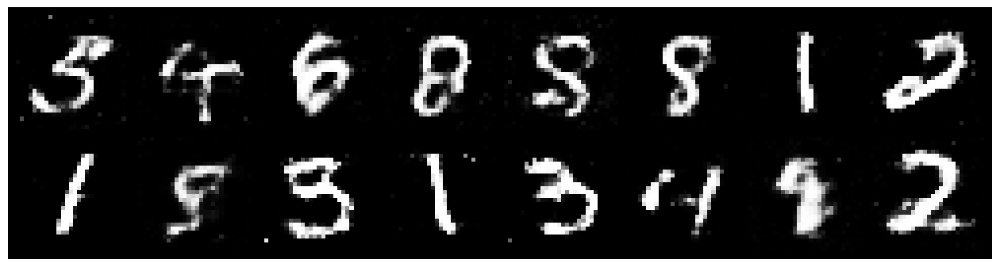

Epoch: [128/200], Batch Num: [300/600]
Discriminator Loss: 1.3377, Generator Loss: 0.7893
D(x): 0.5723, D(G(z)): 0.4944


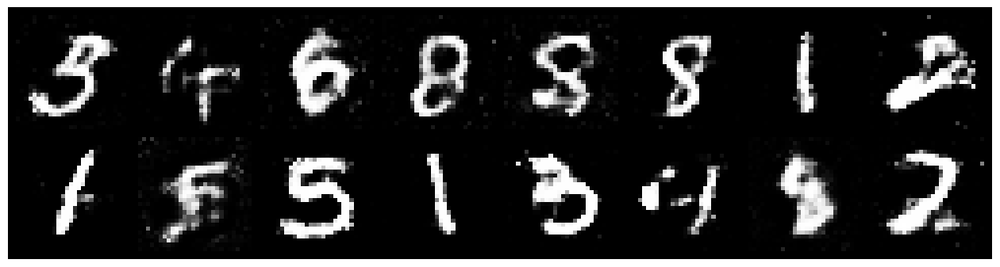

Epoch: [129/200], Batch Num: [0/600]
Discriminator Loss: 1.2774, Generator Loss: 0.9469
D(x): 0.5243, D(G(z)): 0.4244


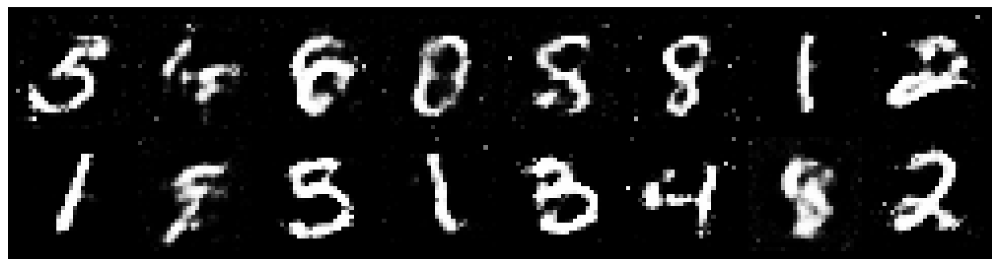

Epoch: [129/200], Batch Num: [300/600]
Discriminator Loss: 1.2411, Generator Loss: 0.9475
D(x): 0.5557, D(G(z)): 0.4407


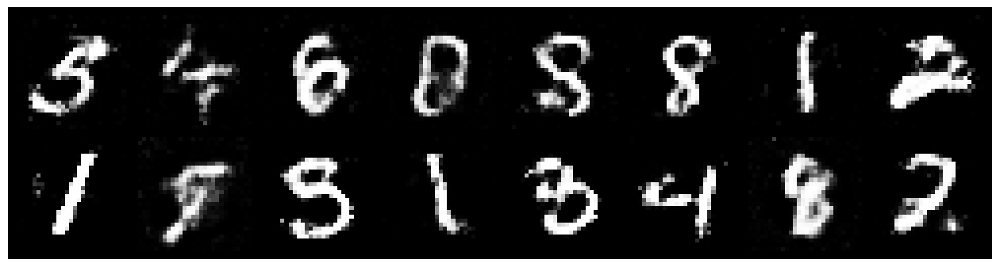

Epoch: [130/200], Batch Num: [0/600]
Discriminator Loss: 1.1770, Generator Loss: 1.0360
D(x): 0.5574, D(G(z)): 0.3885


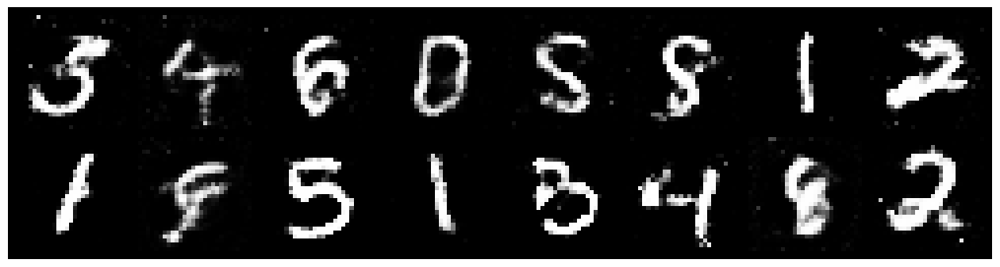

Epoch: [130/200], Batch Num: [300/600]
Discriminator Loss: 1.1865, Generator Loss: 1.0164
D(x): 0.5488, D(G(z)): 0.3921


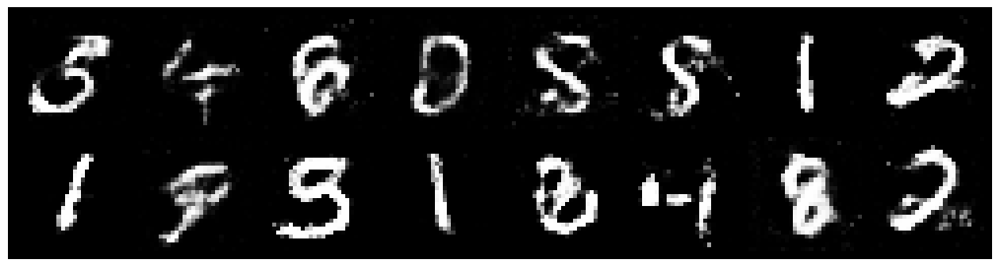

Epoch: [131/200], Batch Num: [0/600]
Discriminator Loss: 1.2125, Generator Loss: 0.9691
D(x): 0.5840, D(G(z)): 0.4206


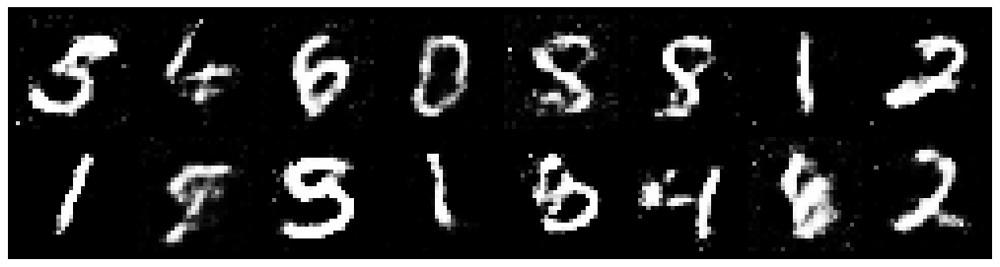

Epoch: [131/200], Batch Num: [300/600]
Discriminator Loss: 1.2326, Generator Loss: 1.0859
D(x): 0.5555, D(G(z)): 0.3947


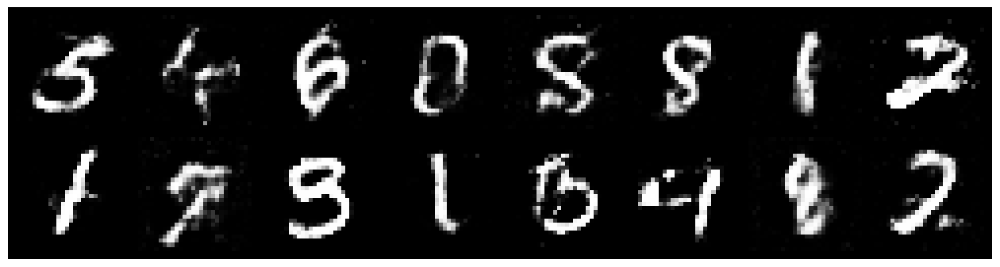

Epoch: [132/200], Batch Num: [0/600]
Discriminator Loss: 1.3045, Generator Loss: 0.8469
D(x): 0.5726, D(G(z)): 0.4716


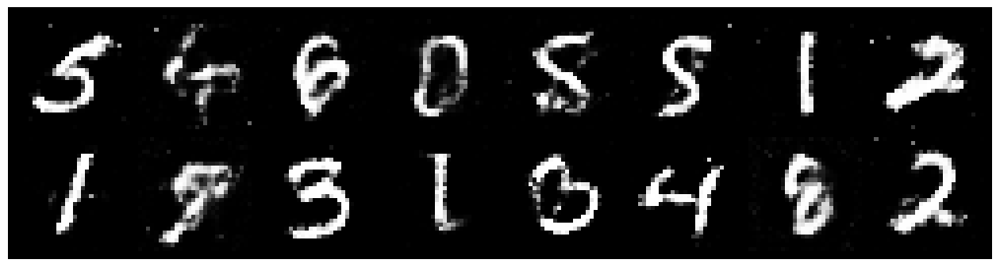

Epoch: [132/200], Batch Num: [300/600]
Discriminator Loss: 1.3243, Generator Loss: 0.8111
D(x): 0.5740, D(G(z)): 0.4910


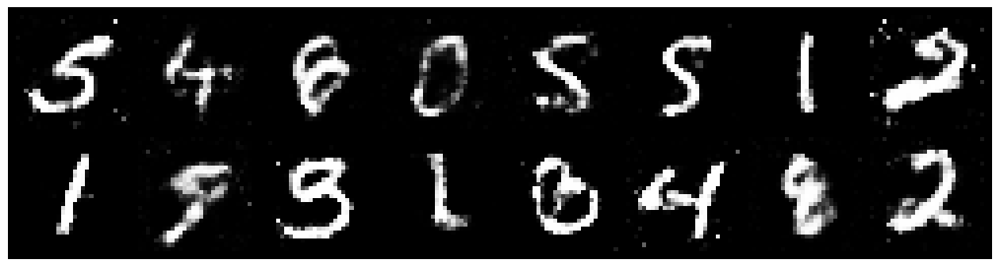

Epoch: [133/200], Batch Num: [0/600]
Discriminator Loss: 1.2127, Generator Loss: 1.0348
D(x): 0.5732, D(G(z)): 0.4292


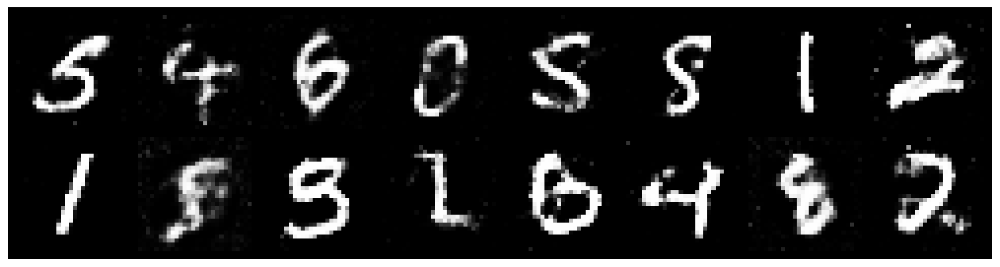

Epoch: [133/200], Batch Num: [300/600]
Discriminator Loss: 1.1897, Generator Loss: 1.0183
D(x): 0.5526, D(G(z)): 0.3901


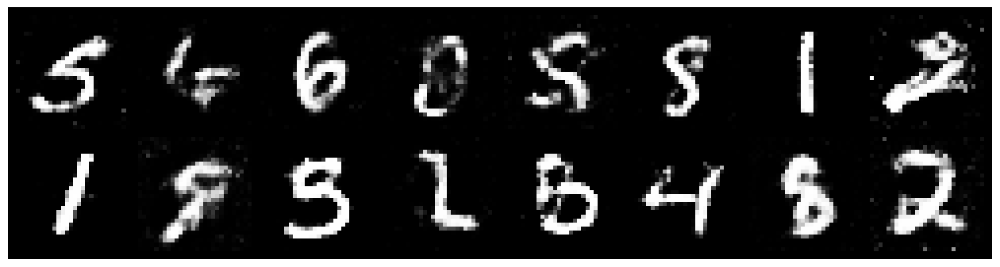

Epoch: [134/200], Batch Num: [0/600]
Discriminator Loss: 1.1713, Generator Loss: 1.0789
D(x): 0.5572, D(G(z)): 0.3722


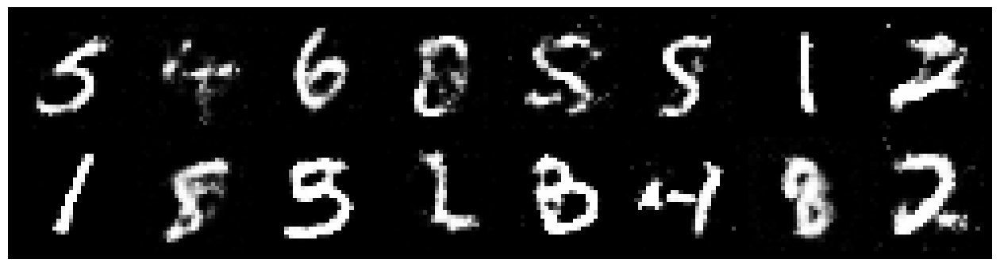

Epoch: [134/200], Batch Num: [300/600]
Discriminator Loss: 1.2845, Generator Loss: 0.8544
D(x): 0.5390, D(G(z)): 0.4492


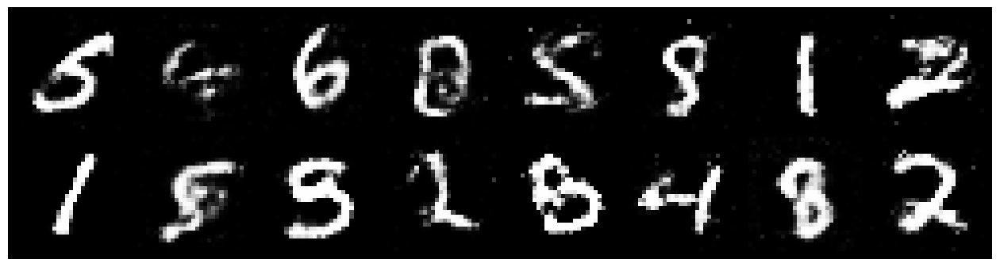

Epoch: [135/200], Batch Num: [0/600]
Discriminator Loss: 1.3284, Generator Loss: 0.8558
D(x): 0.5459, D(G(z)): 0.4464


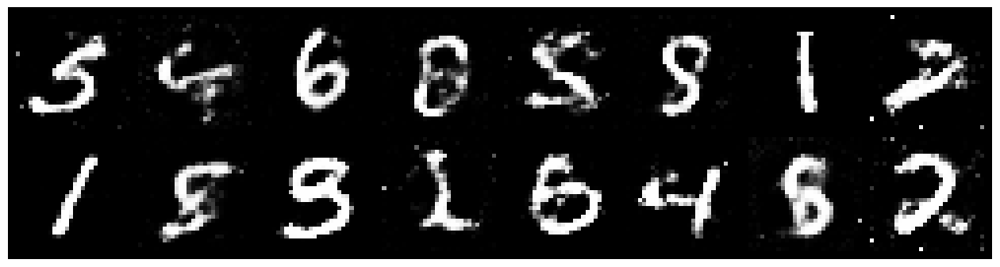

Epoch: [135/200], Batch Num: [300/600]
Discriminator Loss: 1.2410, Generator Loss: 0.8207
D(x): 0.5828, D(G(z)): 0.4617


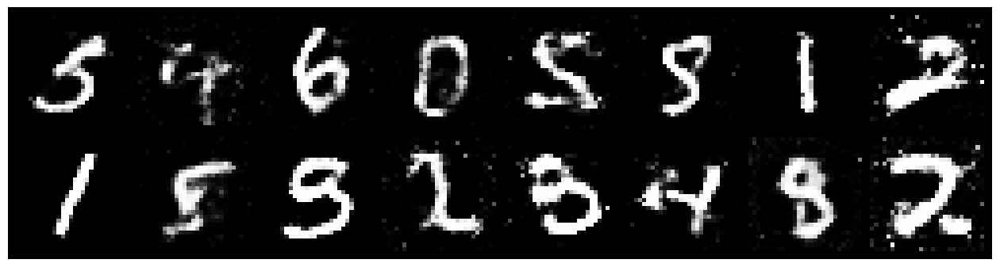

Epoch: [136/200], Batch Num: [0/600]
Discriminator Loss: 1.3048, Generator Loss: 0.7574
D(x): 0.5862, D(G(z)): 0.4952


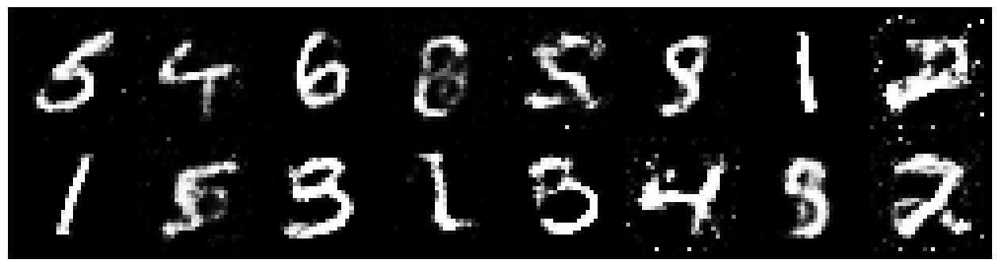

Epoch: [136/200], Batch Num: [300/600]
Discriminator Loss: 1.3064, Generator Loss: 0.8339
D(x): 0.5564, D(G(z)): 0.4760


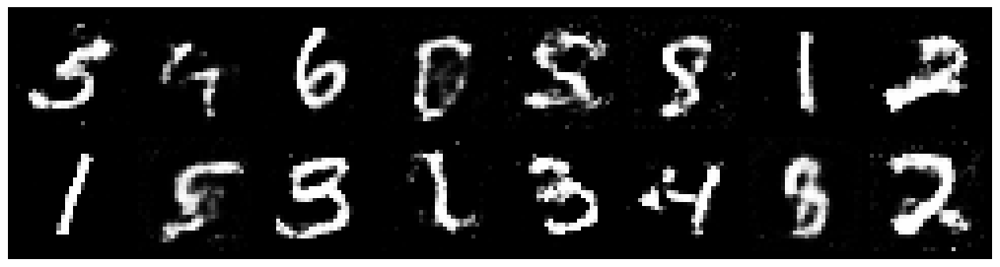

Epoch: [137/200], Batch Num: [0/600]
Discriminator Loss: 1.2709, Generator Loss: 0.8205
D(x): 0.6328, D(G(z)): 0.4896


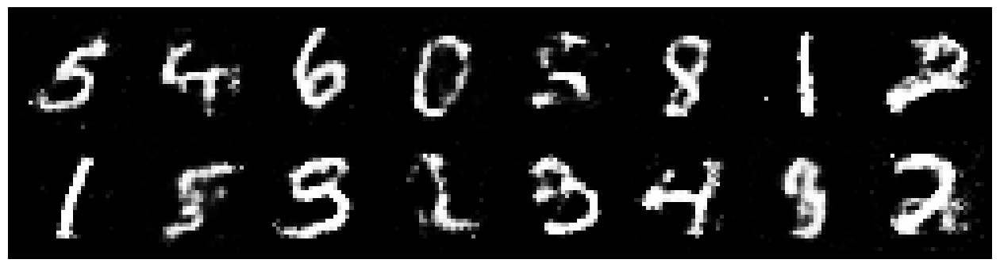

Epoch: [137/200], Batch Num: [300/600]
Discriminator Loss: 1.3093, Generator Loss: 0.8043
D(x): 0.6002, D(G(z)): 0.4948


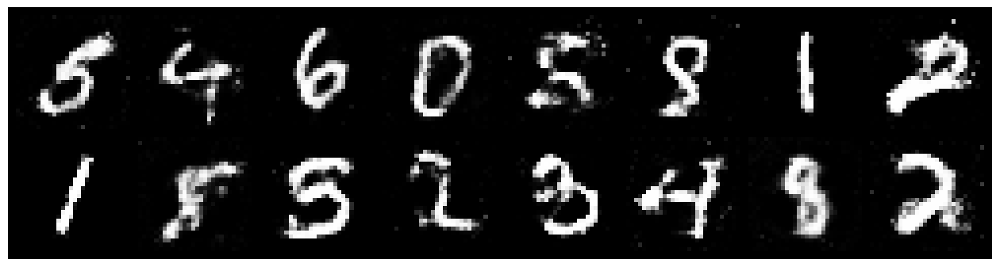

Epoch: [138/200], Batch Num: [0/600]
Discriminator Loss: 1.2451, Generator Loss: 0.8109
D(x): 0.5992, D(G(z)): 0.4495


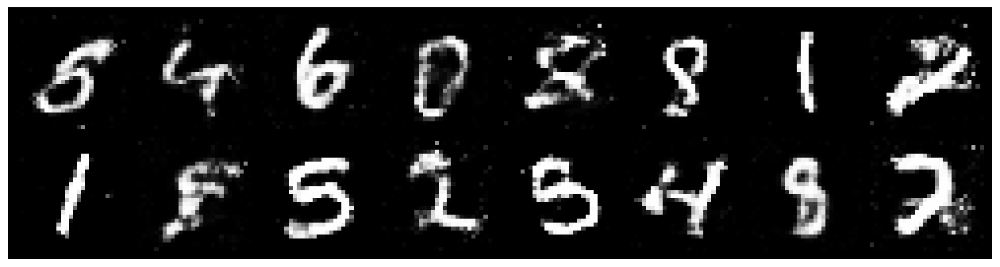

Epoch: [138/200], Batch Num: [300/600]
Discriminator Loss: 1.3086, Generator Loss: 0.8080
D(x): 0.5540, D(G(z)): 0.4468


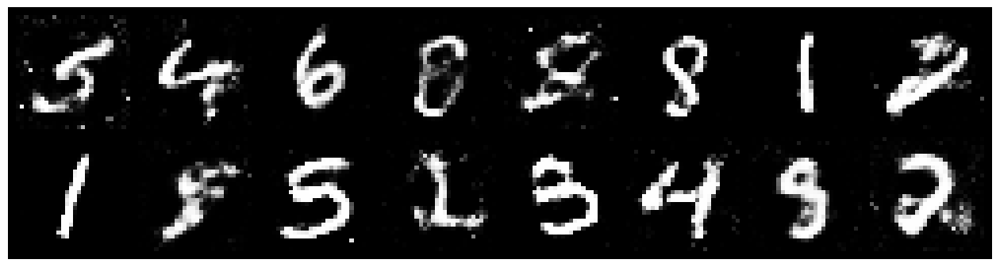

Epoch: [139/200], Batch Num: [0/600]
Discriminator Loss: 1.3056, Generator Loss: 0.8211
D(x): 0.5330, D(G(z)): 0.4445


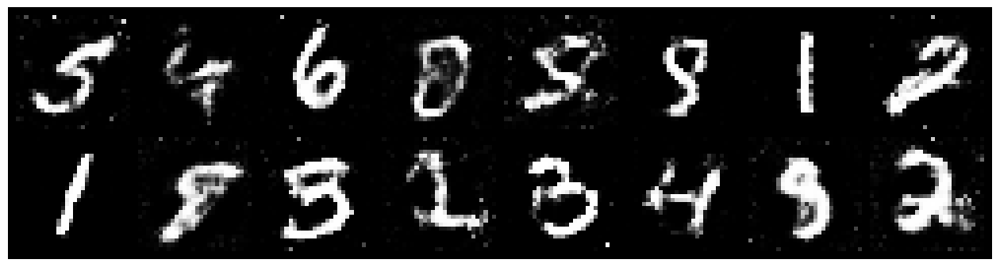

Epoch: [139/200], Batch Num: [300/600]
Discriminator Loss: 1.3375, Generator Loss: 0.9236
D(x): 0.5040, D(G(z)): 0.4302


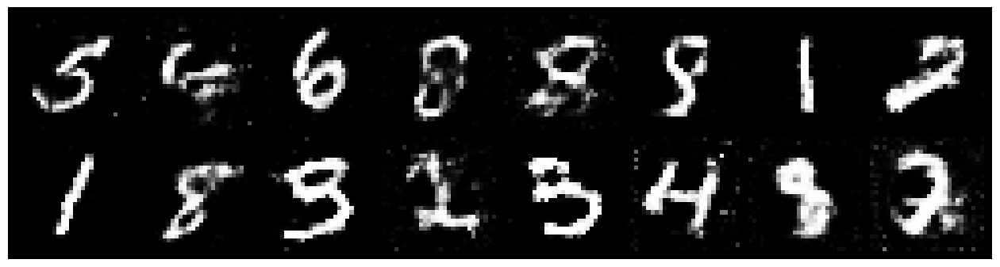

Epoch: [140/200], Batch Num: [0/600]
Discriminator Loss: 1.2785, Generator Loss: 0.8421
D(x): 0.5448, D(G(z)): 0.4245


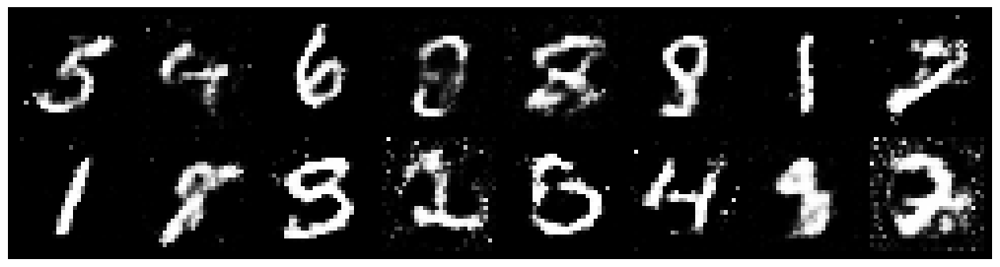

Epoch: [140/200], Batch Num: [300/600]
Discriminator Loss: 1.2677, Generator Loss: 0.8137
D(x): 0.5567, D(G(z)): 0.4604


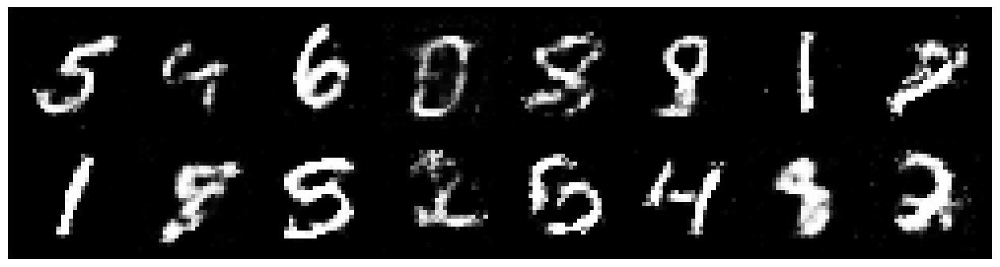

Epoch: [141/200], Batch Num: [0/600]
Discriminator Loss: 1.2296, Generator Loss: 0.8354
D(x): 0.5489, D(G(z)): 0.4452


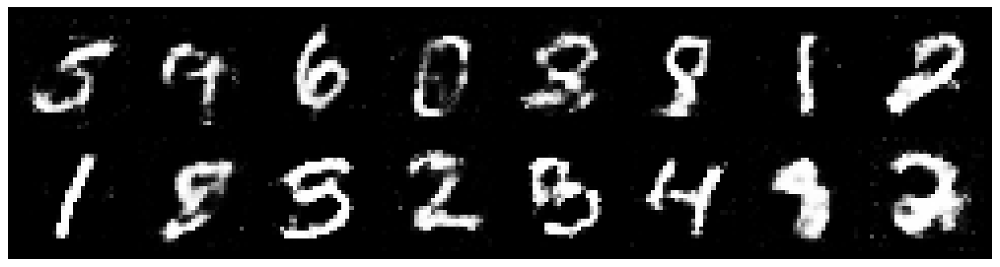

Epoch: [141/200], Batch Num: [300/600]
Discriminator Loss: 1.2189, Generator Loss: 0.9056
D(x): 0.6061, D(G(z)): 0.4445


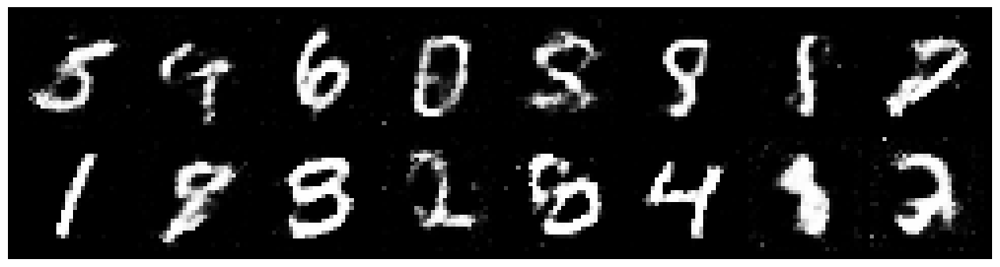

Epoch: [142/200], Batch Num: [0/600]
Discriminator Loss: 1.2503, Generator Loss: 0.8021
D(x): 0.5801, D(G(z)): 0.4489


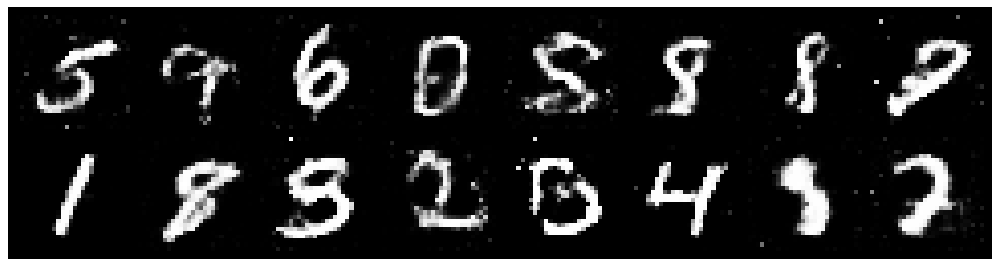

Epoch: [142/200], Batch Num: [300/600]
Discriminator Loss: 1.2822, Generator Loss: 0.7815
D(x): 0.5773, D(G(z)): 0.4774


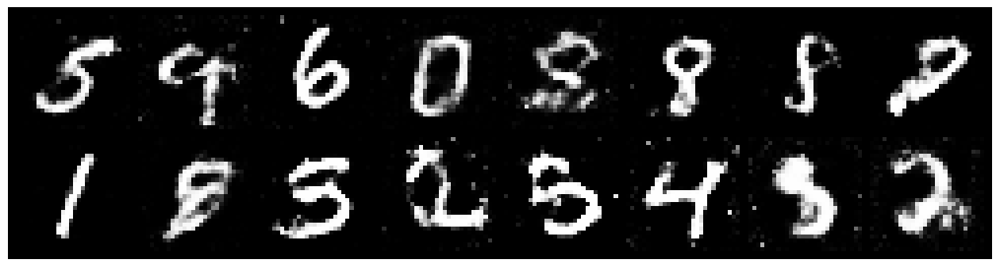

Epoch: [143/200], Batch Num: [0/600]
Discriminator Loss: 1.3189, Generator Loss: 0.8948
D(x): 0.6006, D(G(z)): 0.4882


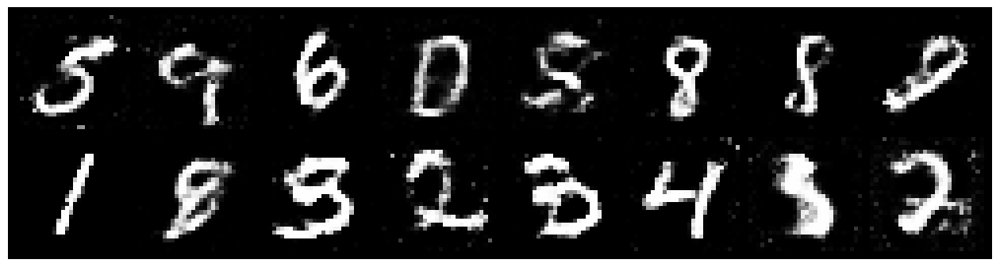

Epoch: [143/200], Batch Num: [300/600]
Discriminator Loss: 1.3291, Generator Loss: 0.8253
D(x): 0.5348, D(G(z)): 0.4579


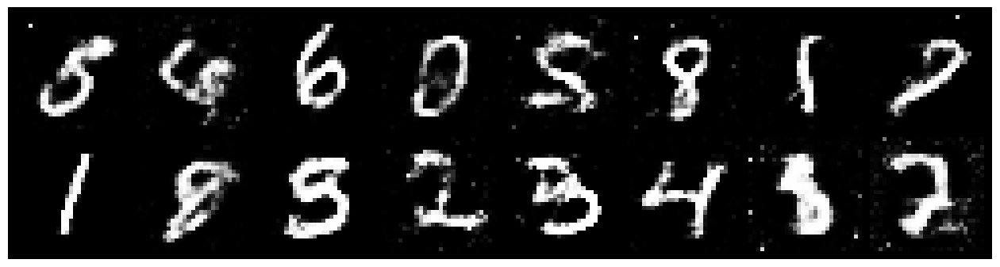

Epoch: [144/200], Batch Num: [0/600]
Discriminator Loss: 1.2537, Generator Loss: 0.8738
D(x): 0.5135, D(G(z)): 0.3893


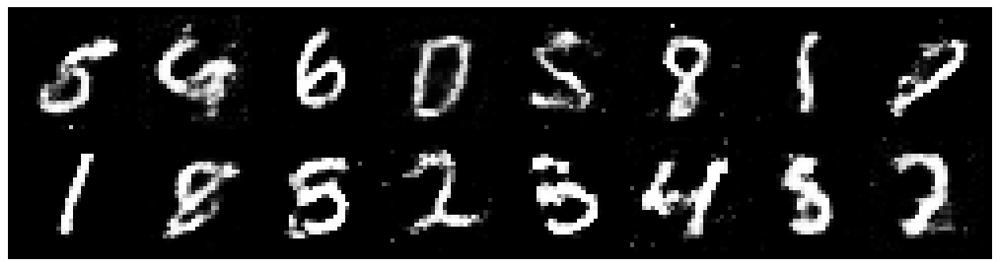

Epoch: [144/200], Batch Num: [300/600]
Discriminator Loss: 1.2154, Generator Loss: 0.9180
D(x): 0.5566, D(G(z)): 0.4220


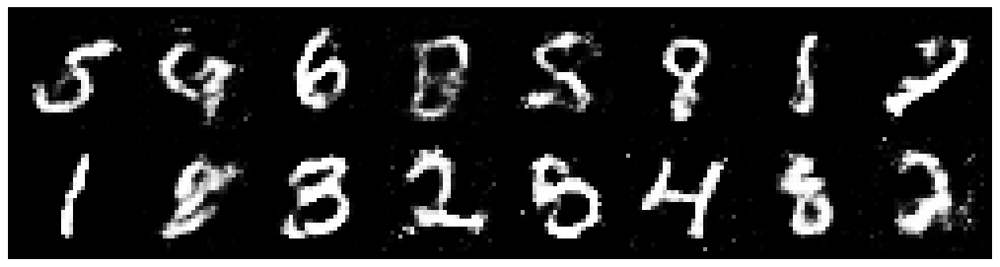

Epoch: [145/200], Batch Num: [0/600]
Discriminator Loss: 1.1768, Generator Loss: 0.9084
D(x): 0.6411, D(G(z)): 0.4551


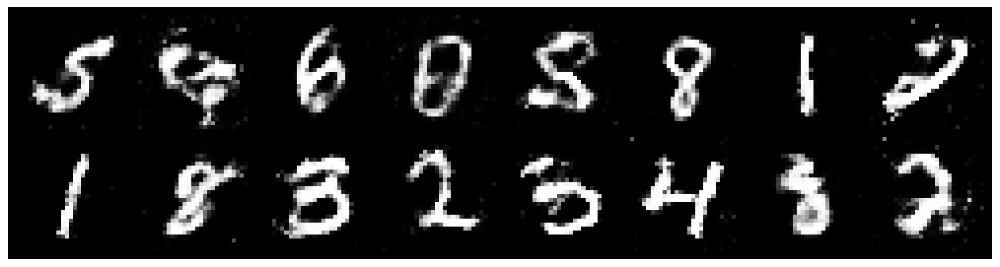

Epoch: [145/200], Batch Num: [300/600]
Discriminator Loss: 1.2765, Generator Loss: 0.8584
D(x): 0.5717, D(G(z)): 0.4660


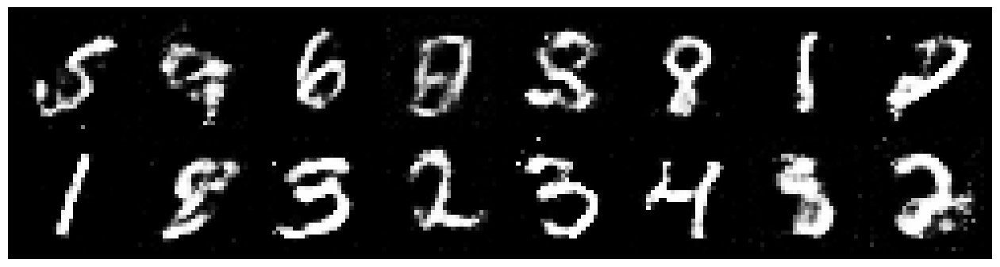

Epoch: [146/200], Batch Num: [0/600]
Discriminator Loss: 1.2447, Generator Loss: 1.0008
D(x): 0.5863, D(G(z)): 0.4428


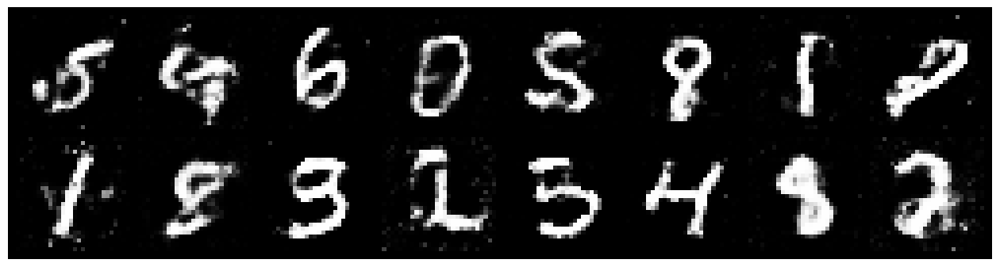

Epoch: [146/200], Batch Num: [300/600]
Discriminator Loss: 1.2867, Generator Loss: 0.8630
D(x): 0.5528, D(G(z)): 0.4604


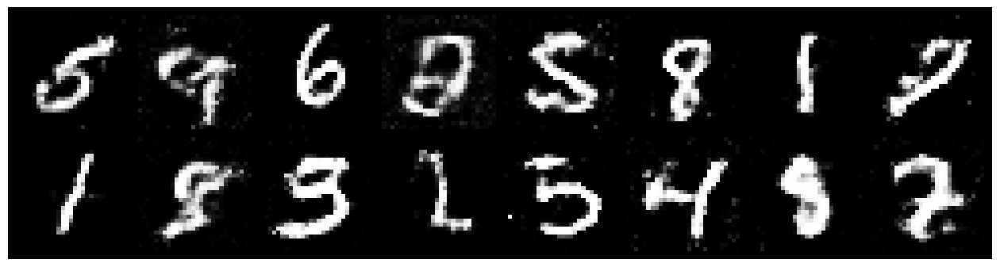

Epoch: [147/200], Batch Num: [0/600]
Discriminator Loss: 1.4005, Generator Loss: 0.8218
D(x): 0.5488, D(G(z)): 0.4860


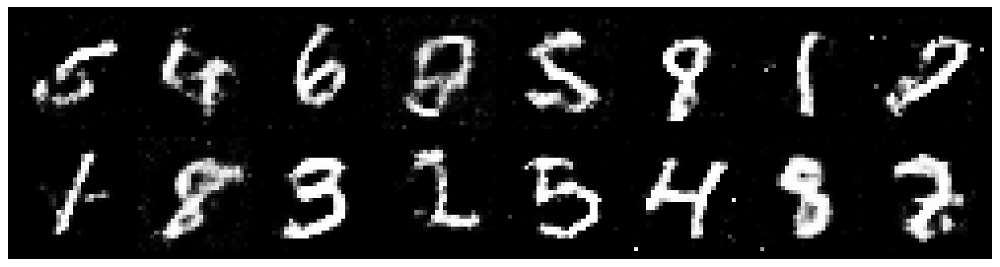

Epoch: [147/200], Batch Num: [300/600]
Discriminator Loss: 1.2528, Generator Loss: 0.8460
D(x): 0.5438, D(G(z)): 0.4270


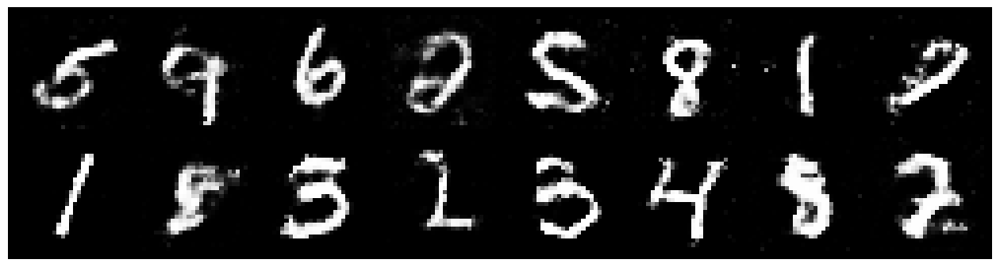

Epoch: [148/200], Batch Num: [0/600]
Discriminator Loss: 1.2530, Generator Loss: 0.9391
D(x): 0.5684, D(G(z)): 0.4416


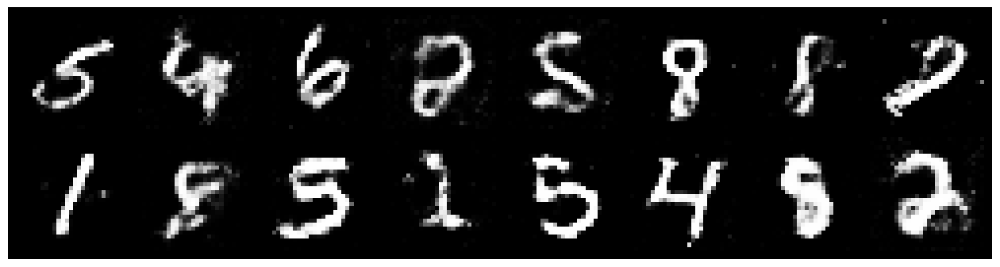

Epoch: [148/200], Batch Num: [300/600]
Discriminator Loss: 1.3261, Generator Loss: 0.9599
D(x): 0.5055, D(G(z)): 0.4191


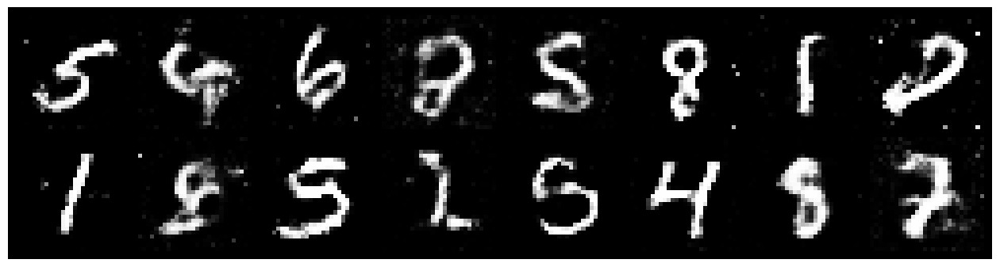

Epoch: [149/200], Batch Num: [0/600]
Discriminator Loss: 1.2713, Generator Loss: 0.8530
D(x): 0.5456, D(G(z)): 0.4283


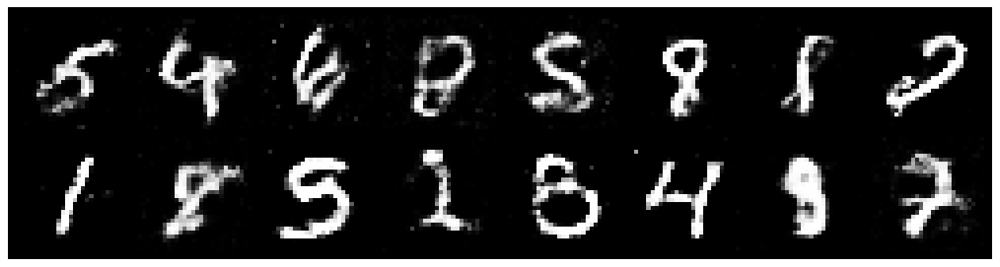

Epoch: [149/200], Batch Num: [300/600]
Discriminator Loss: 1.3153, Generator Loss: 0.8307
D(x): 0.5677, D(G(z)): 0.4831


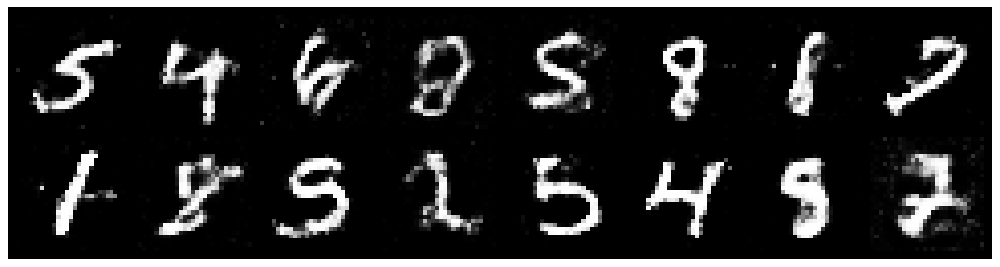

Epoch: [150/200], Batch Num: [0/600]
Discriminator Loss: 1.3640, Generator Loss: 0.7523
D(x): 0.5320, D(G(z)): 0.4931


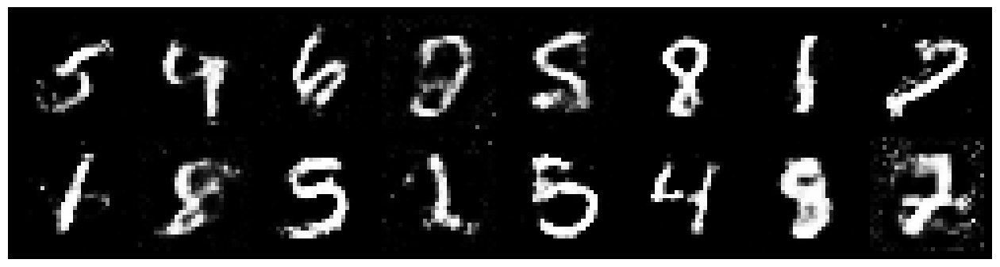

Epoch: [150/200], Batch Num: [300/600]
Discriminator Loss: 1.2920, Generator Loss: 0.8896
D(x): 0.5535, D(G(z)): 0.4511


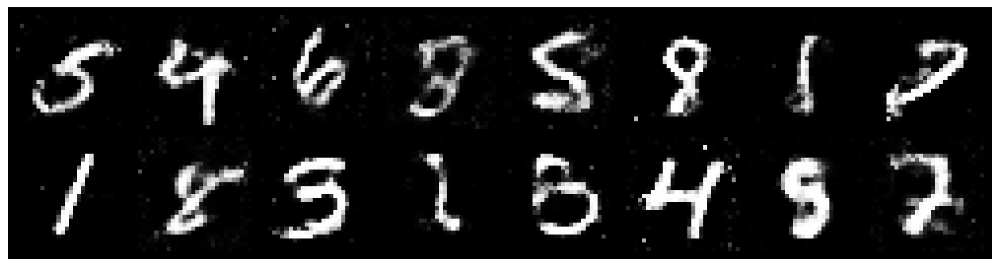

Epoch: [151/200], Batch Num: [0/600]
Discriminator Loss: 1.3450, Generator Loss: 0.9170
D(x): 0.5584, D(G(z)): 0.4820


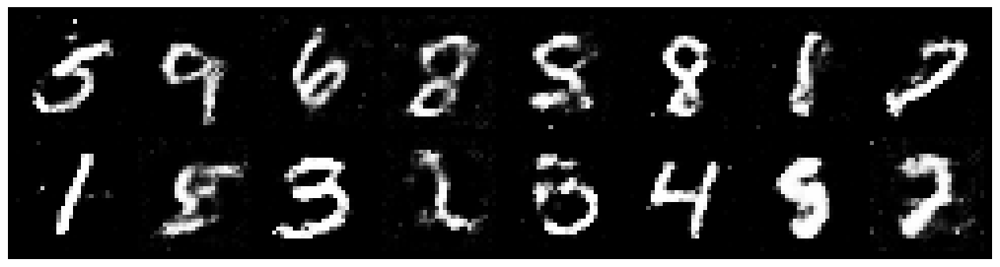

Epoch: [151/200], Batch Num: [300/600]
Discriminator Loss: 1.1749, Generator Loss: 1.0523
D(x): 0.5832, D(G(z)): 0.4135


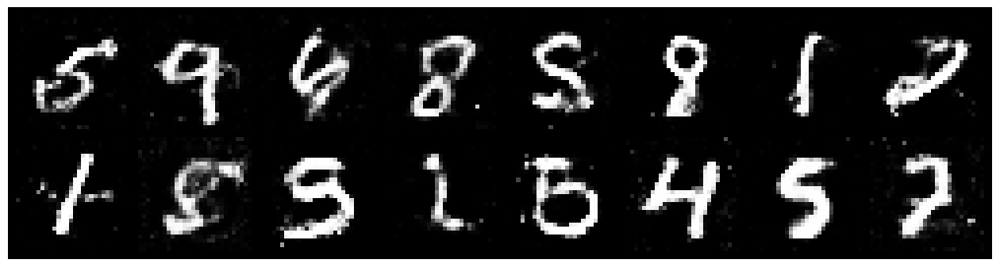

Epoch: [152/200], Batch Num: [0/600]
Discriminator Loss: 1.2489, Generator Loss: 0.8045
D(x): 0.5995, D(G(z)): 0.4620


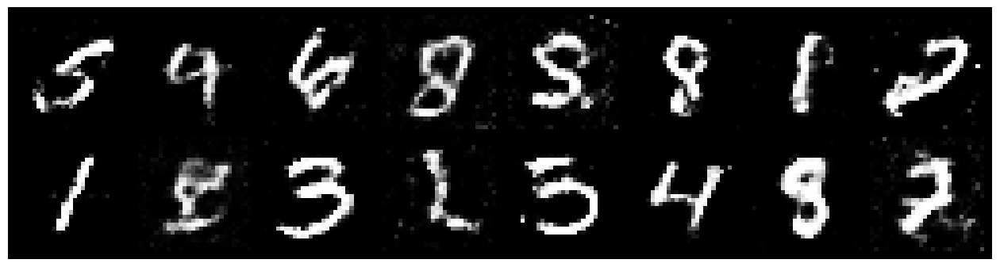

Epoch: [152/200], Batch Num: [300/600]
Discriminator Loss: 1.3747, Generator Loss: 0.7793
D(x): 0.5394, D(G(z)): 0.4996


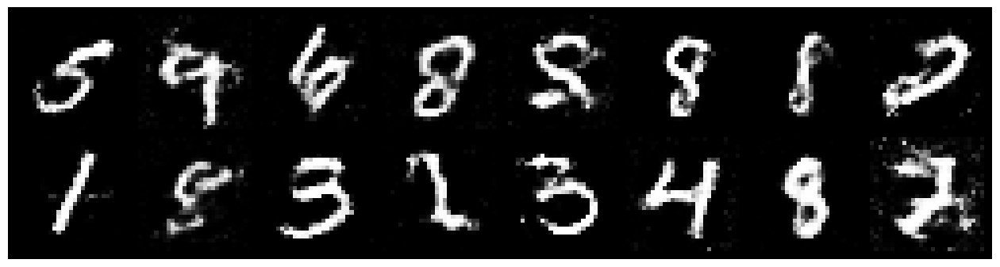

Epoch: [153/200], Batch Num: [0/600]
Discriminator Loss: 1.1793, Generator Loss: 0.8687
D(x): 0.5810, D(G(z)): 0.4281


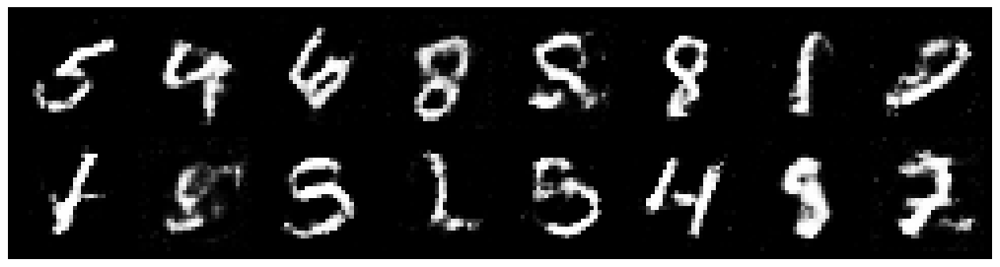

Epoch: [153/200], Batch Num: [300/600]
Discriminator Loss: 1.1797, Generator Loss: 0.9496
D(x): 0.5595, D(G(z)): 0.4159


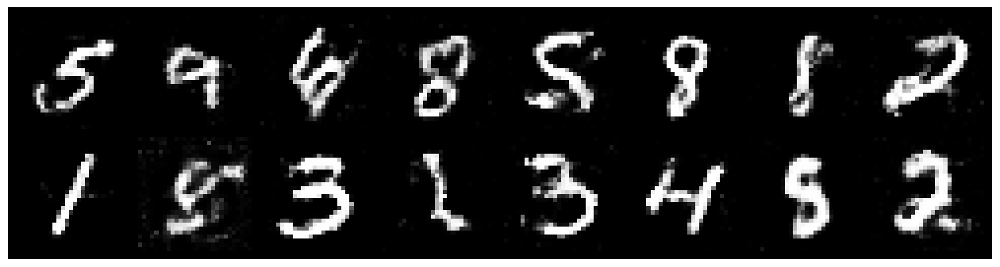

Epoch: [154/200], Batch Num: [0/600]
Discriminator Loss: 1.1956, Generator Loss: 0.8733
D(x): 0.5971, D(G(z)): 0.4597


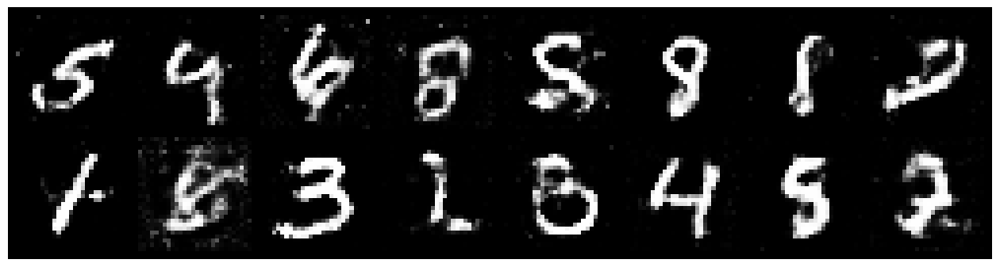

Epoch: [154/200], Batch Num: [300/600]
Discriminator Loss: 1.2349, Generator Loss: 0.8724
D(x): 0.5686, D(G(z)): 0.4365


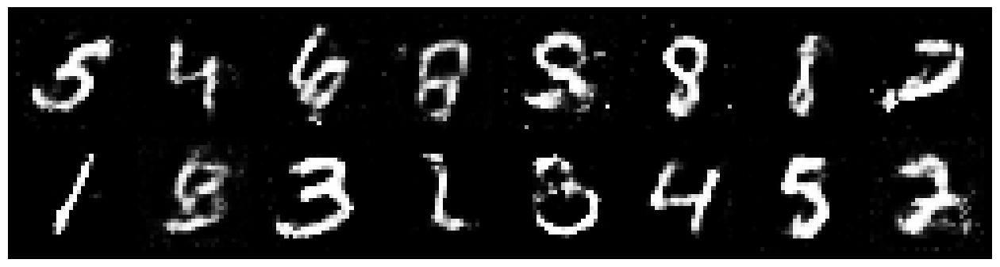

Epoch: [155/200], Batch Num: [0/600]
Discriminator Loss: 1.3964, Generator Loss: 0.9257
D(x): 0.5216, D(G(z)): 0.4694


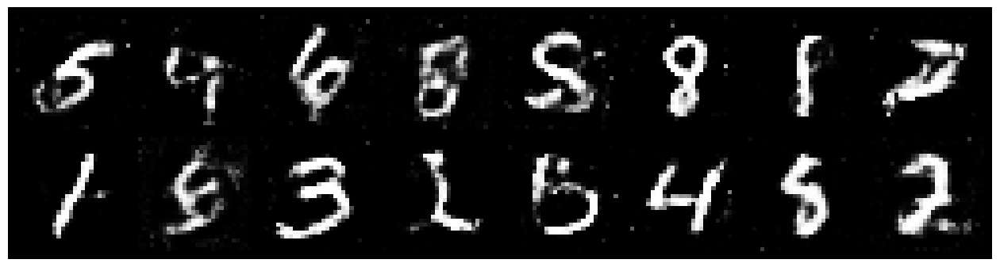

Epoch: [155/200], Batch Num: [300/600]
Discriminator Loss: 1.2404, Generator Loss: 1.0177
D(x): 0.5313, D(G(z)): 0.3935


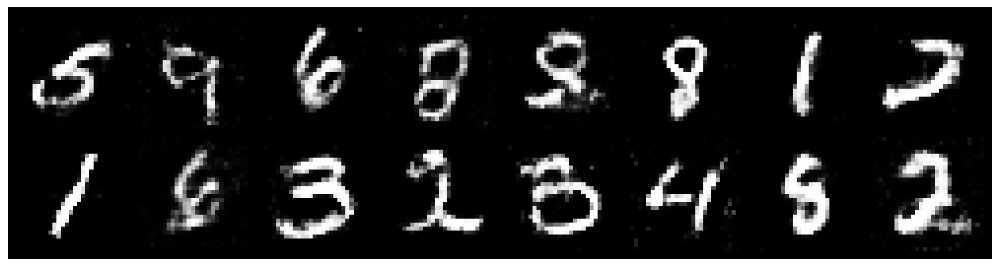

Epoch: [156/200], Batch Num: [0/600]
Discriminator Loss: 1.2689, Generator Loss: 0.8998
D(x): 0.5912, D(G(z)): 0.4566


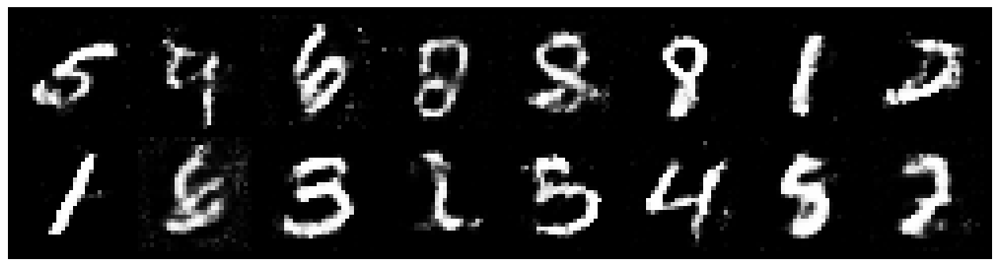

Epoch: [156/200], Batch Num: [300/600]
Discriminator Loss: 1.3426, Generator Loss: 0.9736
D(x): 0.5897, D(G(z)): 0.4793


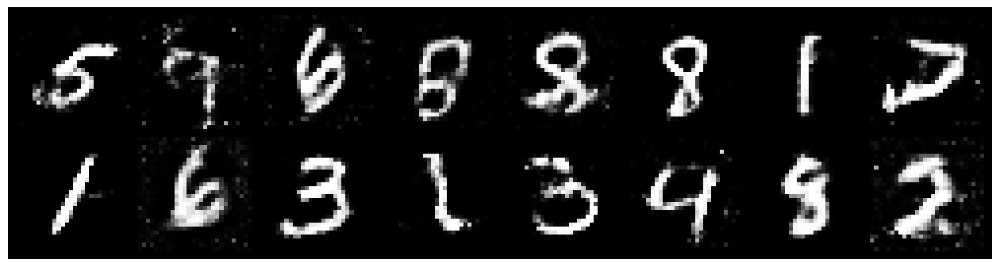

Epoch: [157/200], Batch Num: [0/600]
Discriminator Loss: 1.1901, Generator Loss: 0.8127
D(x): 0.5734, D(G(z)): 0.4293


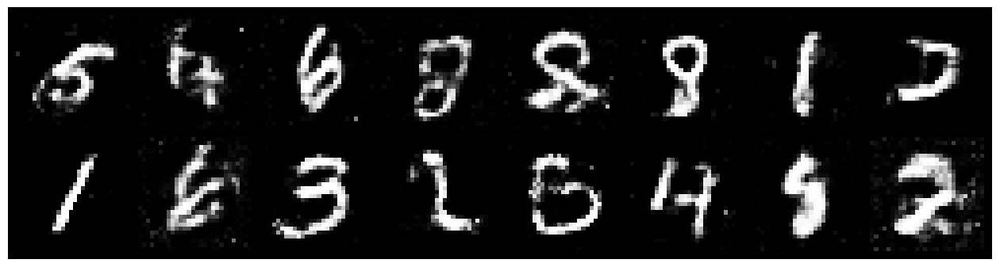

Epoch: [157/200], Batch Num: [300/600]
Discriminator Loss: 1.4128, Generator Loss: 0.8431
D(x): 0.5399, D(G(z)): 0.5058


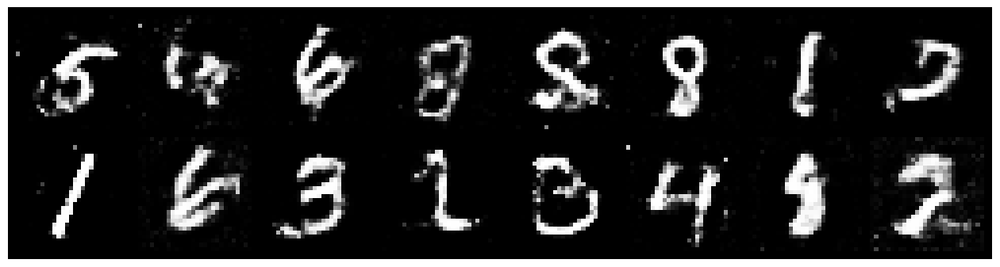

Epoch: [158/200], Batch Num: [0/600]
Discriminator Loss: 1.3111, Generator Loss: 0.8947
D(x): 0.5327, D(G(z)): 0.4423


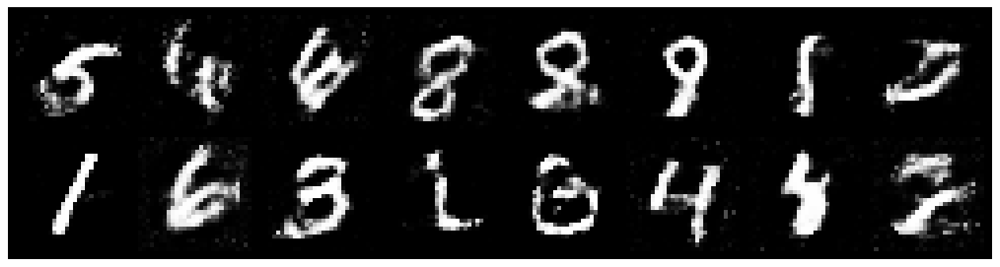

Epoch: [158/200], Batch Num: [300/600]
Discriminator Loss: 1.1977, Generator Loss: 1.0388
D(x): 0.5293, D(G(z)): 0.3834


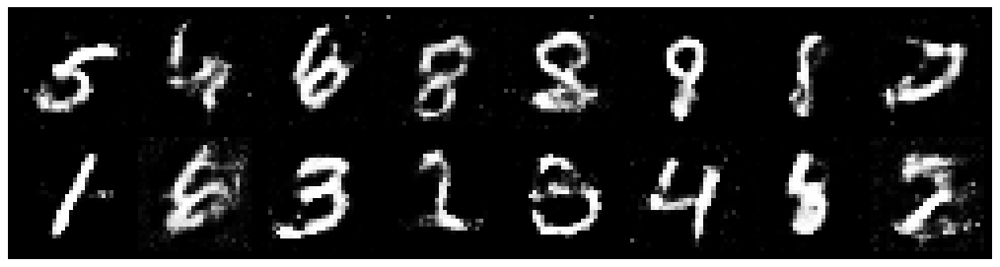

Epoch: [159/200], Batch Num: [0/600]
Discriminator Loss: 1.3201, Generator Loss: 1.0040
D(x): 0.5408, D(G(z)): 0.4452


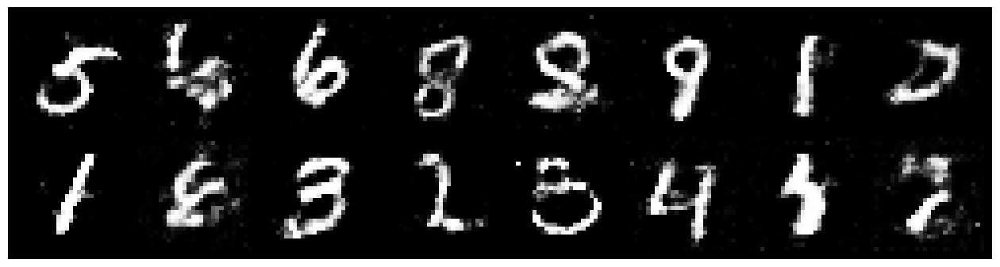

Epoch: [159/200], Batch Num: [300/600]
Discriminator Loss: 1.3847, Generator Loss: 0.7635
D(x): 0.5662, D(G(z)): 0.5033


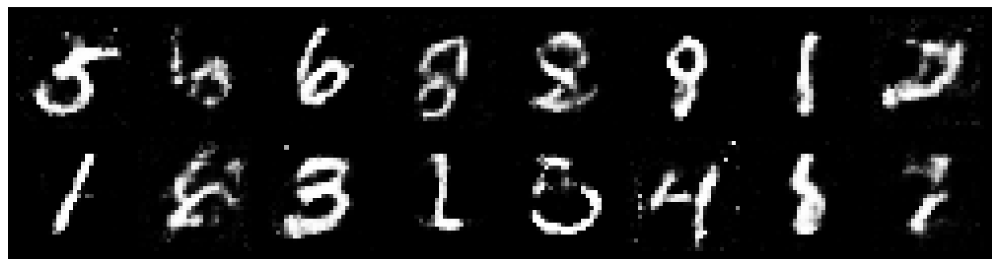

Epoch: [160/200], Batch Num: [0/600]
Discriminator Loss: 1.3563, Generator Loss: 0.8058
D(x): 0.5652, D(G(z)): 0.4904


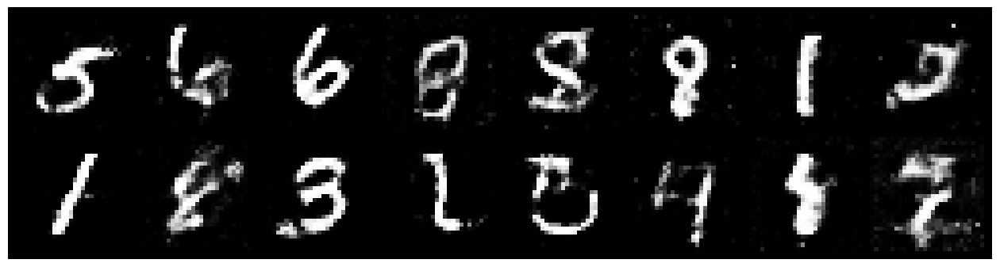

Epoch: [160/200], Batch Num: [300/600]
Discriminator Loss: 1.3053, Generator Loss: 0.8122
D(x): 0.5349, D(G(z)): 0.4561


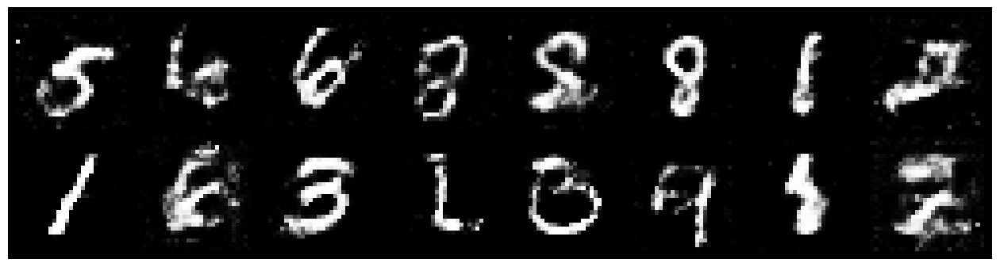

Epoch: [161/200], Batch Num: [0/600]
Discriminator Loss: 1.2257, Generator Loss: 0.9380
D(x): 0.5786, D(G(z)): 0.4204


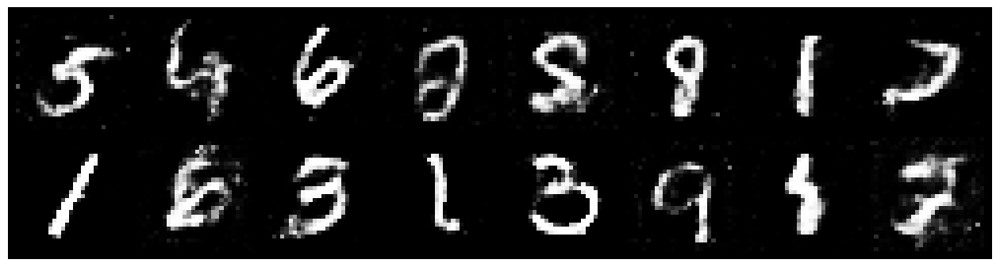

Epoch: [161/200], Batch Num: [300/600]
Discriminator Loss: 1.2130, Generator Loss: 1.0304
D(x): 0.5383, D(G(z)): 0.3923


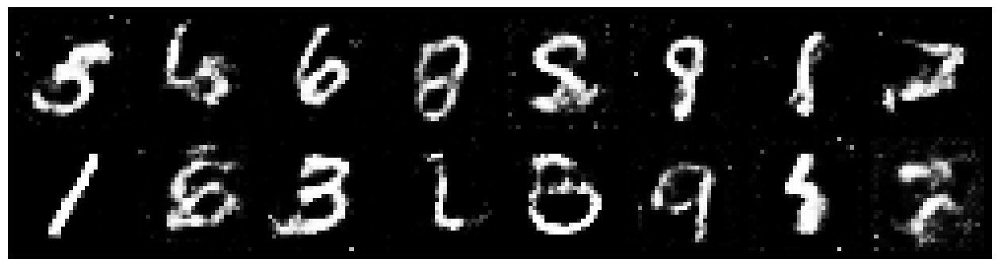

Epoch: [162/200], Batch Num: [0/600]
Discriminator Loss: 1.2770, Generator Loss: 0.9586
D(x): 0.5537, D(G(z)): 0.4454


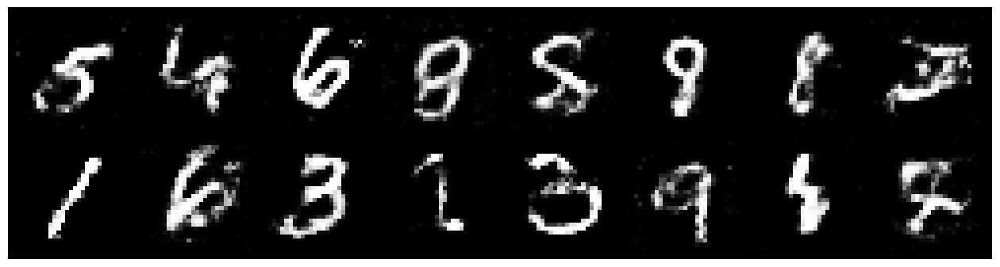

Epoch: [162/200], Batch Num: [300/600]
Discriminator Loss: 1.3131, Generator Loss: 0.9607
D(x): 0.5297, D(G(z)): 0.4445


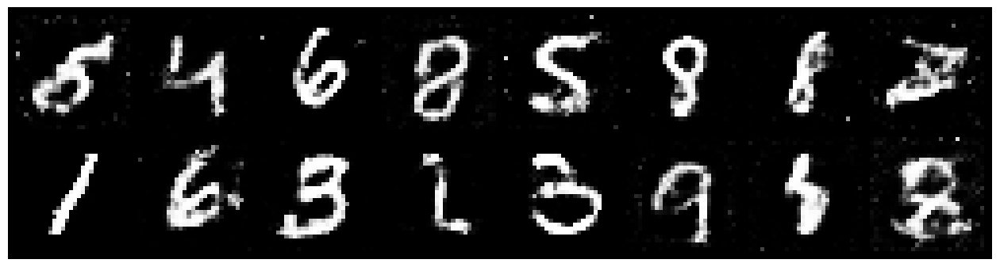

Epoch: [163/200], Batch Num: [0/600]
Discriminator Loss: 1.3049, Generator Loss: 0.7827
D(x): 0.5370, D(G(z)): 0.4507


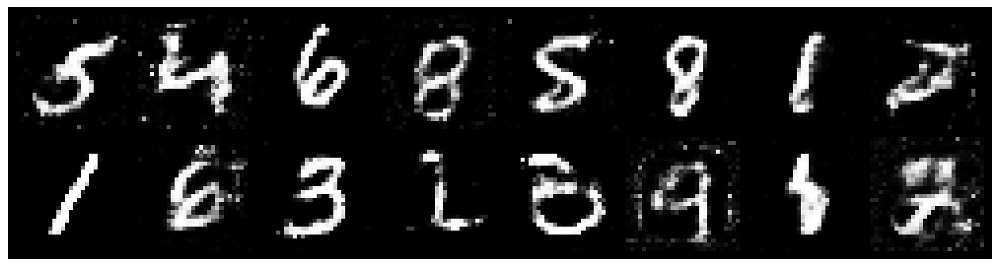

Epoch: [163/200], Batch Num: [300/600]
Discriminator Loss: 1.2201, Generator Loss: 0.9215
D(x): 0.5329, D(G(z)): 0.3997


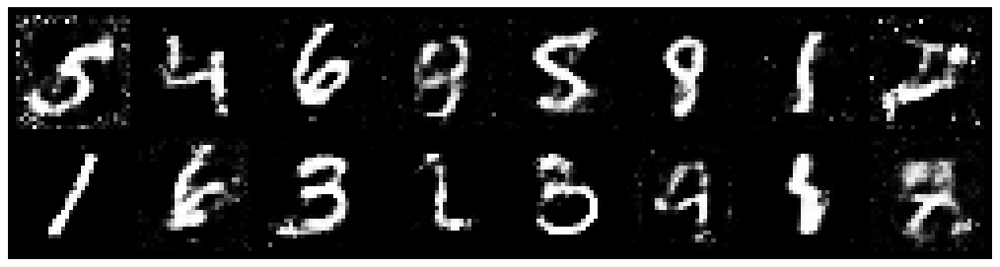

Epoch: [164/200], Batch Num: [0/600]
Discriminator Loss: 1.2663, Generator Loss: 0.8897
D(x): 0.6272, D(G(z)): 0.4876


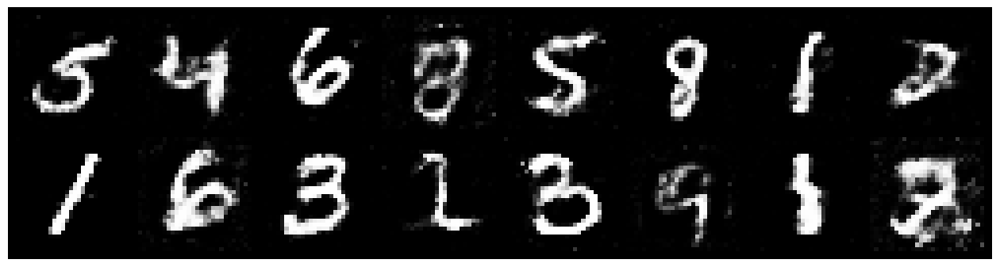

Epoch: [164/200], Batch Num: [300/600]
Discriminator Loss: 1.3629, Generator Loss: 0.8282
D(x): 0.5498, D(G(z)): 0.4689


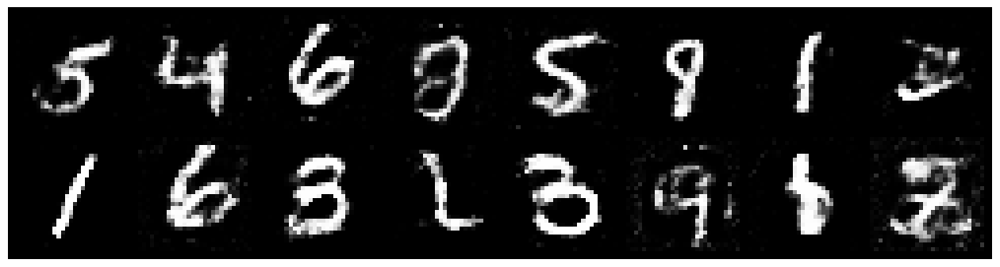

Epoch: [165/200], Batch Num: [0/600]
Discriminator Loss: 1.3582, Generator Loss: 0.6885
D(x): 0.5364, D(G(z)): 0.4860


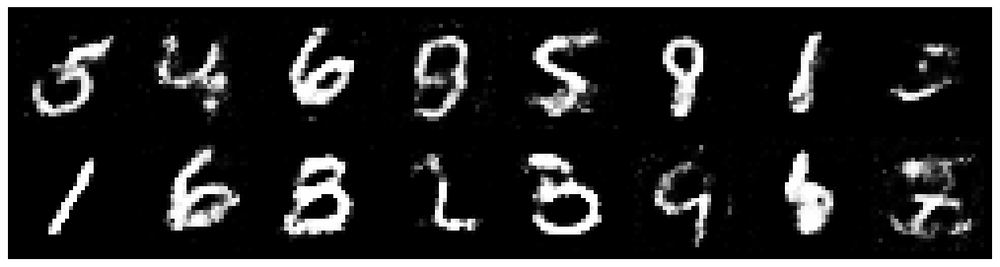

Epoch: [165/200], Batch Num: [300/600]
Discriminator Loss: 1.1787, Generator Loss: 0.8812
D(x): 0.5657, D(G(z)): 0.4126


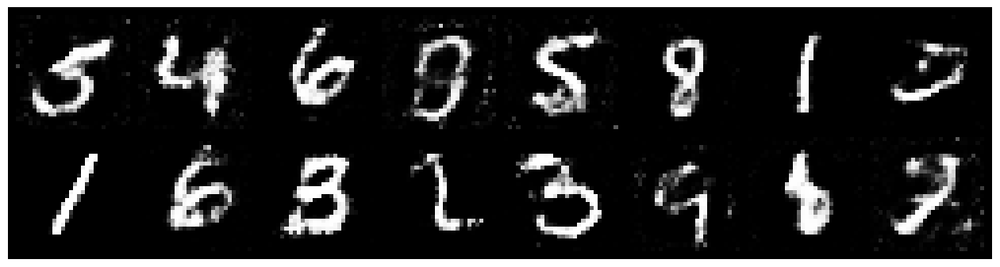

Epoch: [166/200], Batch Num: [0/600]
Discriminator Loss: 1.3076, Generator Loss: 0.8971
D(x): 0.5386, D(G(z)): 0.4445


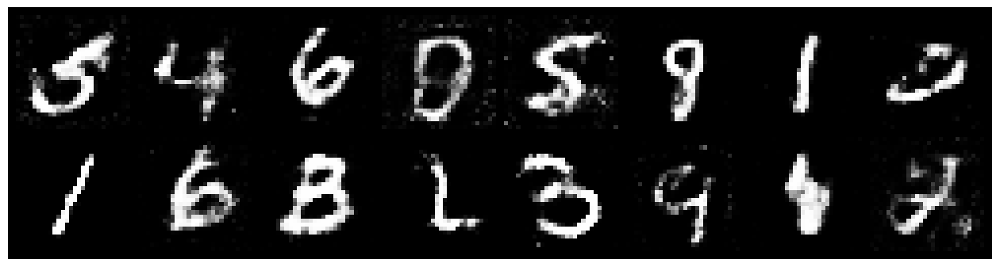

Epoch: [166/200], Batch Num: [300/600]
Discriminator Loss: 1.3004, Generator Loss: 0.8232
D(x): 0.5305, D(G(z)): 0.4512


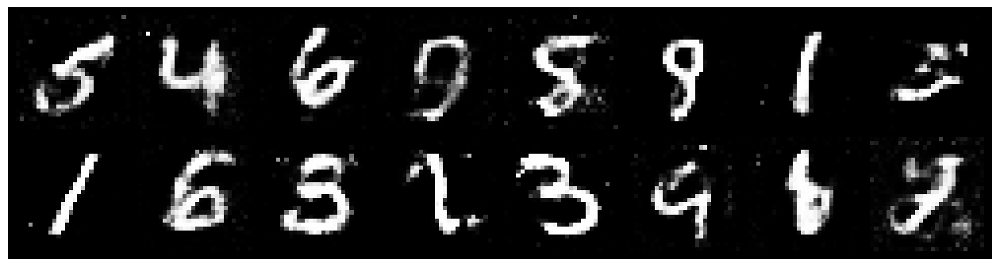

Epoch: [167/200], Batch Num: [0/600]
Discriminator Loss: 1.2471, Generator Loss: 0.9864
D(x): 0.5531, D(G(z)): 0.4329


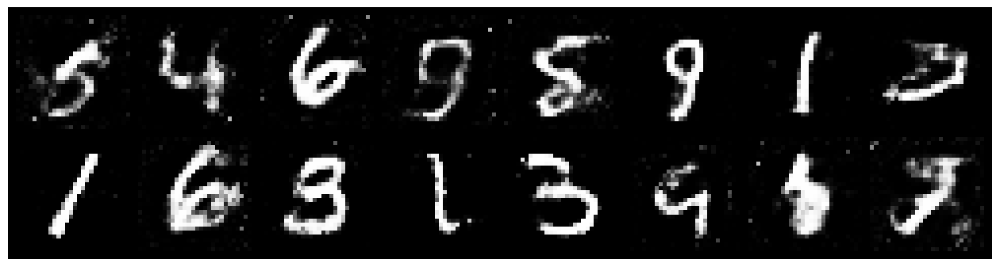

Epoch: [167/200], Batch Num: [300/600]
Discriminator Loss: 1.2954, Generator Loss: 0.9462
D(x): 0.5319, D(G(z)): 0.4462


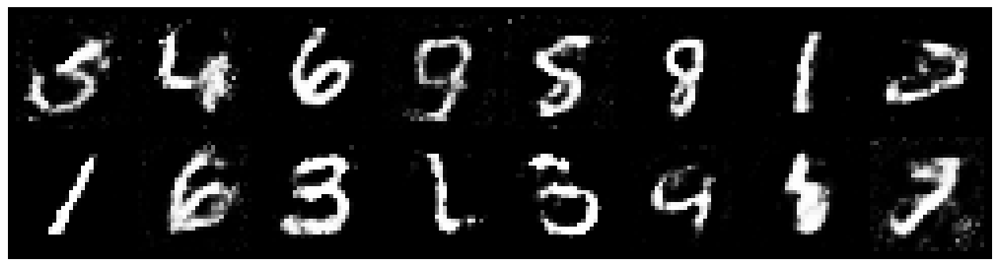

Epoch: [168/200], Batch Num: [0/600]
Discriminator Loss: 1.2240, Generator Loss: 0.9782
D(x): 0.5780, D(G(z)): 0.4394


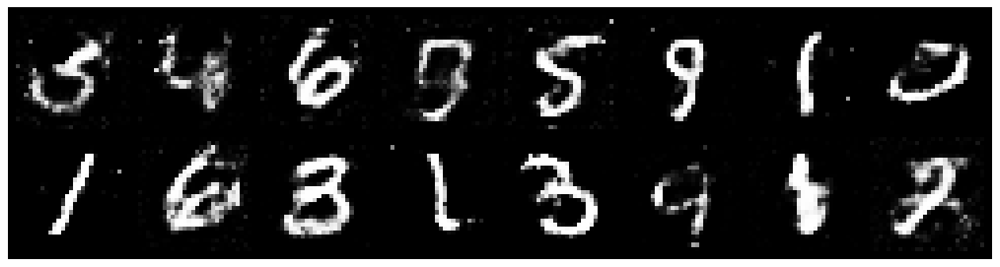

Epoch: [168/200], Batch Num: [300/600]
Discriminator Loss: 1.2645, Generator Loss: 0.8567
D(x): 0.5279, D(G(z)): 0.4344


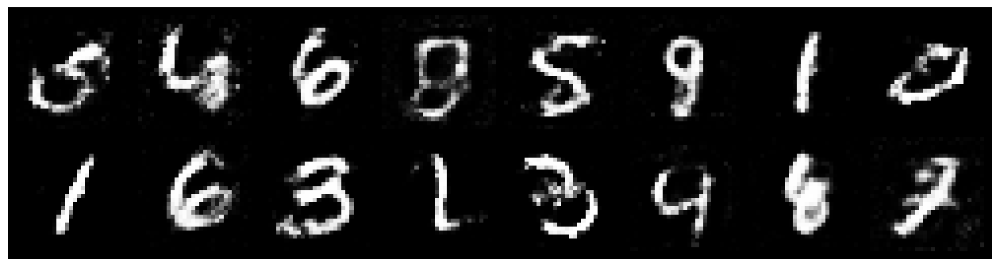

Epoch: [169/200], Batch Num: [0/600]
Discriminator Loss: 1.3060, Generator Loss: 0.8679
D(x): 0.5446, D(G(z)): 0.4503


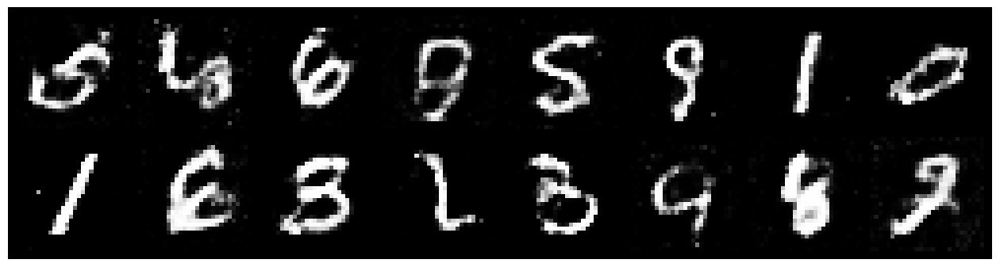

Epoch: [169/200], Batch Num: [300/600]
Discriminator Loss: 1.2450, Generator Loss: 0.8757
D(x): 0.5343, D(G(z)): 0.4199


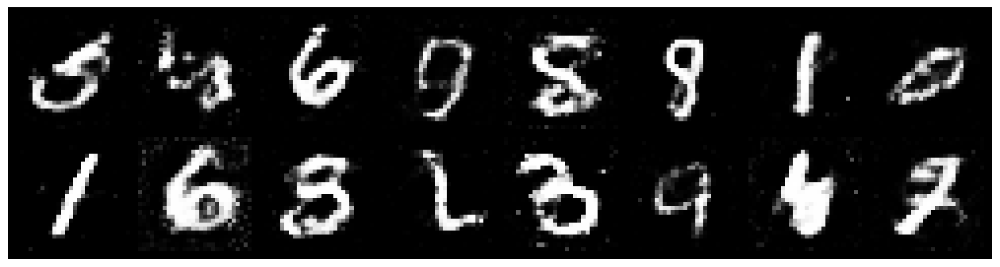

Epoch: [170/200], Batch Num: [0/600]
Discriminator Loss: 1.2648, Generator Loss: 0.8348
D(x): 0.5487, D(G(z)): 0.4456


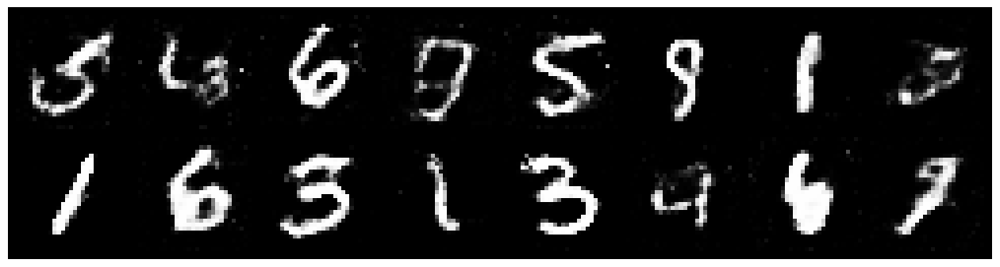

Epoch: [170/200], Batch Num: [300/600]
Discriminator Loss: 1.3905, Generator Loss: 0.8005
D(x): 0.5074, D(G(z)): 0.4689


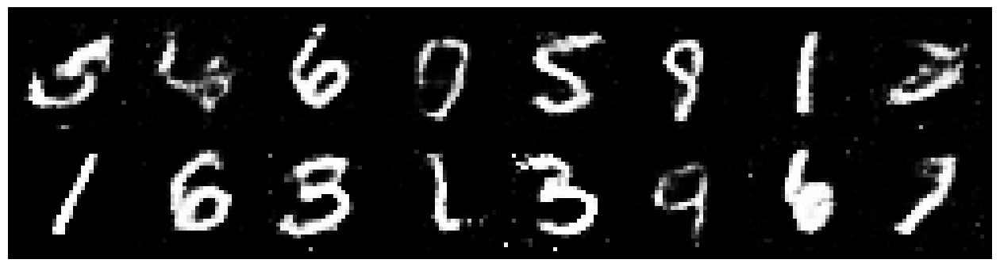

Epoch: [171/200], Batch Num: [0/600]
Discriminator Loss: 1.1603, Generator Loss: 0.9271
D(x): 0.5681, D(G(z)): 0.3857


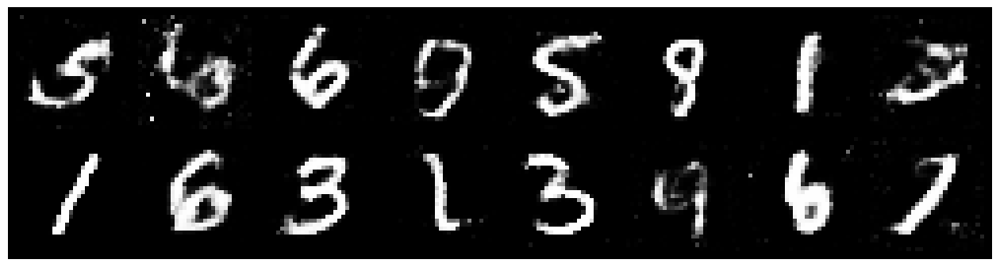

Epoch: [171/200], Batch Num: [300/600]
Discriminator Loss: 1.3435, Generator Loss: 1.0242
D(x): 0.5796, D(G(z)): 0.4642


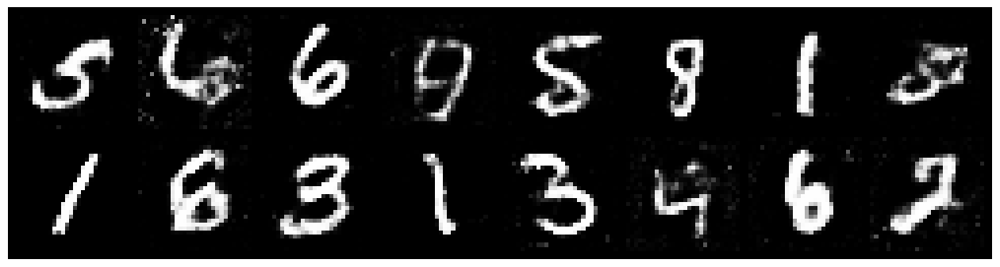

Epoch: [172/200], Batch Num: [0/600]
Discriminator Loss: 1.2737, Generator Loss: 0.8821
D(x): 0.5343, D(G(z)): 0.4359


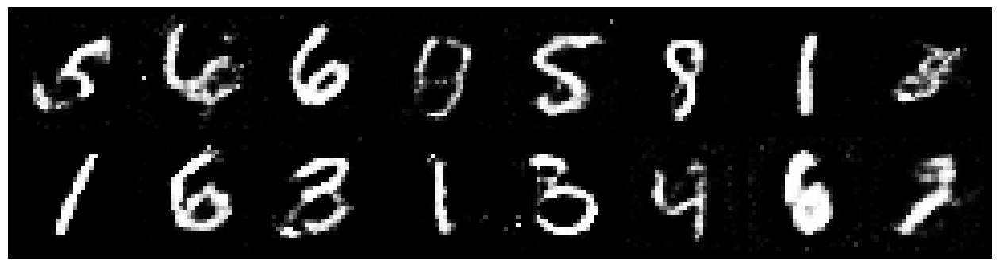

Epoch: [172/200], Batch Num: [300/600]
Discriminator Loss: 1.2746, Generator Loss: 0.8754
D(x): 0.5482, D(G(z)): 0.4484


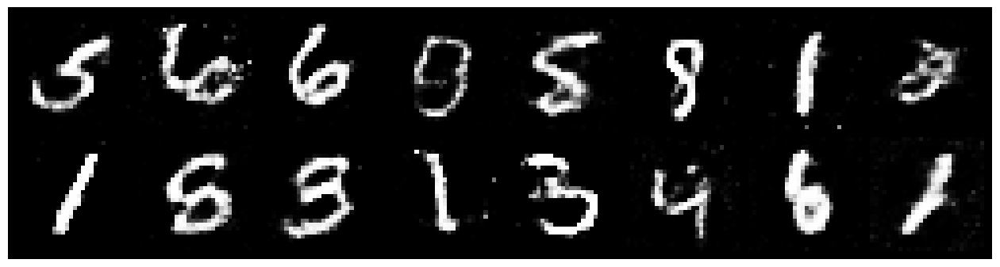

Epoch: [173/200], Batch Num: [0/600]
Discriminator Loss: 1.2950, Generator Loss: 0.8463
D(x): 0.5245, D(G(z)): 0.4435


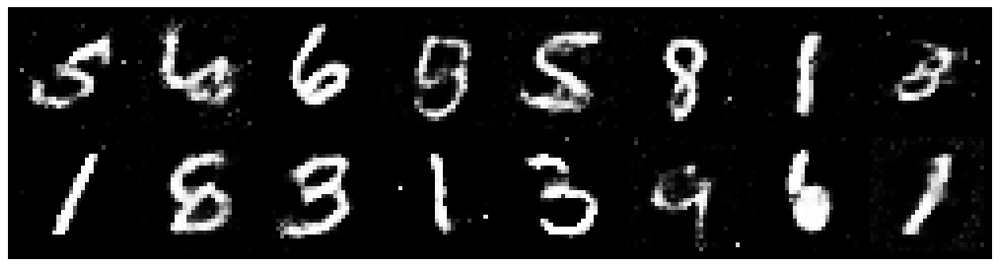

Epoch: [173/200], Batch Num: [300/600]
Discriminator Loss: 1.2799, Generator Loss: 0.8651
D(x): 0.5402, D(G(z)): 0.4446


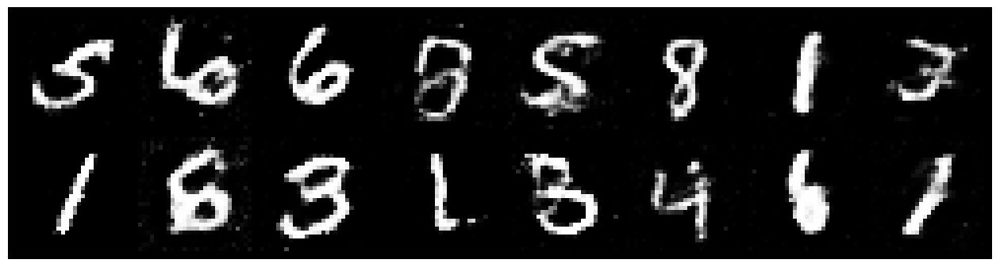

Epoch: [174/200], Batch Num: [0/600]
Discriminator Loss: 1.2936, Generator Loss: 0.9006
D(x): 0.5211, D(G(z)): 0.4138


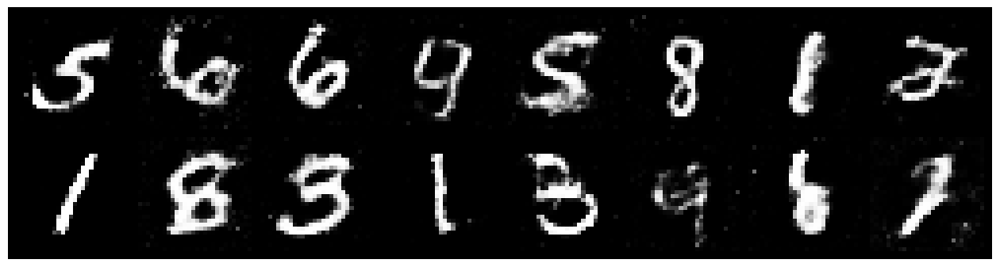

Epoch: [174/200], Batch Num: [300/600]
Discriminator Loss: 1.2255, Generator Loss: 1.0526
D(x): 0.6024, D(G(z)): 0.4574


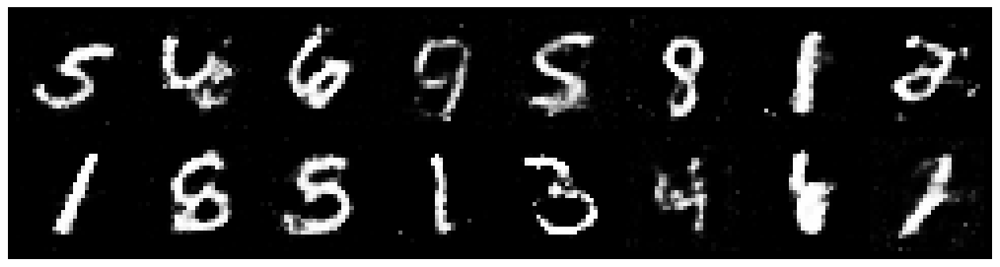

Epoch: [175/200], Batch Num: [0/600]
Discriminator Loss: 1.2685, Generator Loss: 0.9166
D(x): 0.5618, D(G(z)): 0.4498


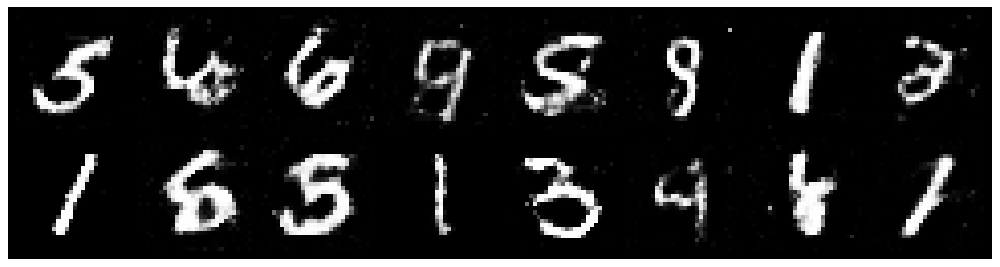

Epoch: [175/200], Batch Num: [300/600]
Discriminator Loss: 1.3359, Generator Loss: 0.8927
D(x): 0.5063, D(G(z)): 0.4482


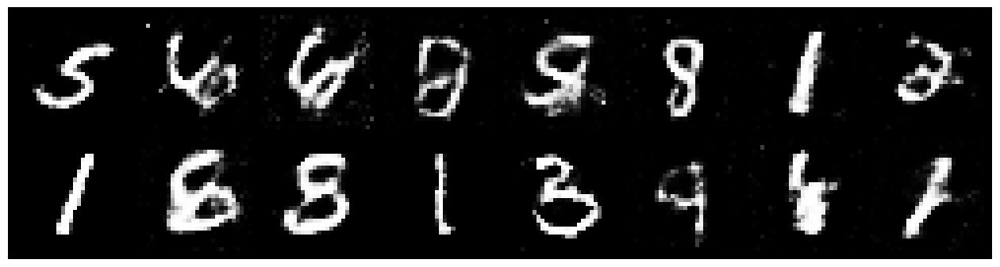

Epoch: [176/200], Batch Num: [0/600]
Discriminator Loss: 1.2266, Generator Loss: 0.9395
D(x): 0.5772, D(G(z)): 0.4386


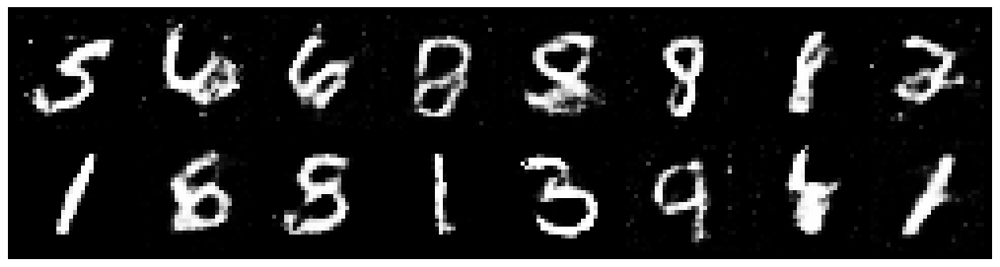

Epoch: [176/200], Batch Num: [300/600]
Discriminator Loss: 1.2749, Generator Loss: 0.8539
D(x): 0.5895, D(G(z)): 0.4855


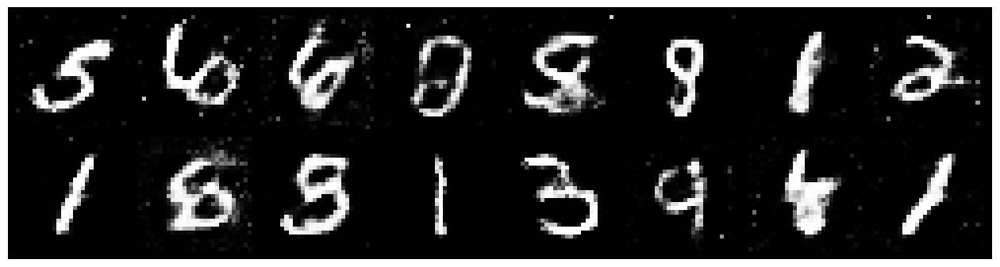

Epoch: [177/200], Batch Num: [0/600]
Discriminator Loss: 1.3229, Generator Loss: 0.7926
D(x): 0.5431, D(G(z)): 0.4747


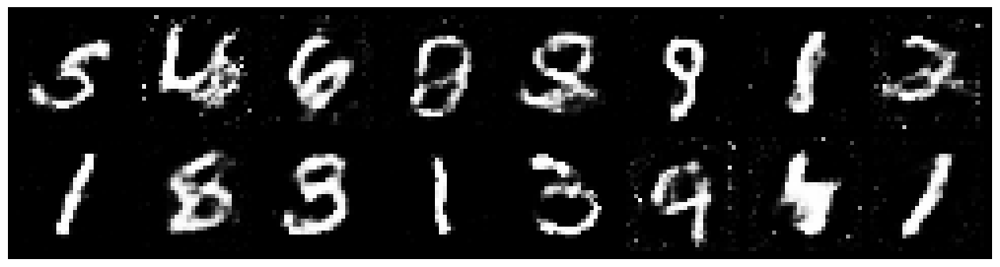

Epoch: [177/200], Batch Num: [300/600]
Discriminator Loss: 1.3376, Generator Loss: 0.8473
D(x): 0.5356, D(G(z)): 0.4618


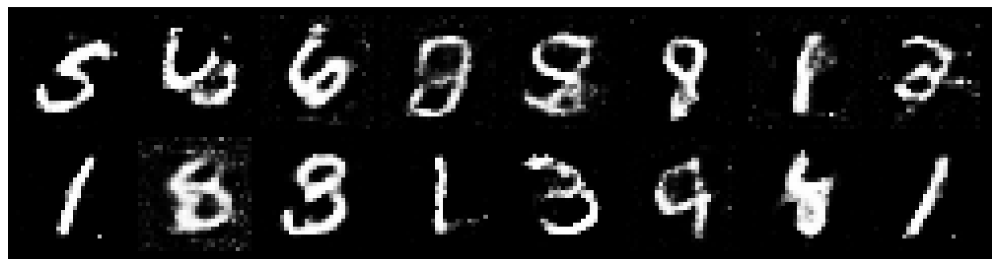

Epoch: [178/200], Batch Num: [0/600]
Discriminator Loss: 1.3151, Generator Loss: 0.9683
D(x): 0.5501, D(G(z)): 0.4427


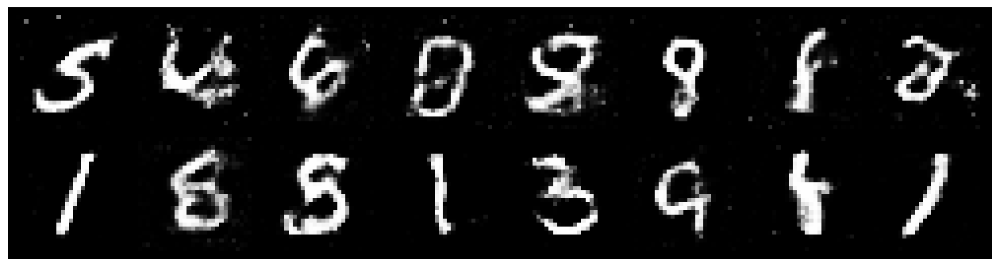

Epoch: [178/200], Batch Num: [300/600]
Discriminator Loss: 1.2983, Generator Loss: 0.7559
D(x): 0.5936, D(G(z)): 0.5007


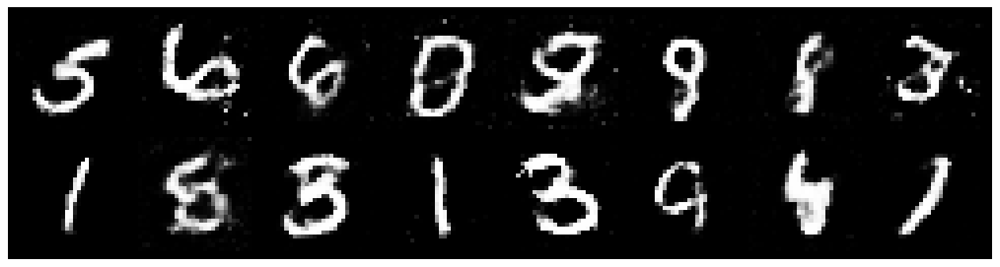

Epoch: [179/200], Batch Num: [0/600]
Discriminator Loss: 1.2405, Generator Loss: 0.7299
D(x): 0.6186, D(G(z)): 0.4756


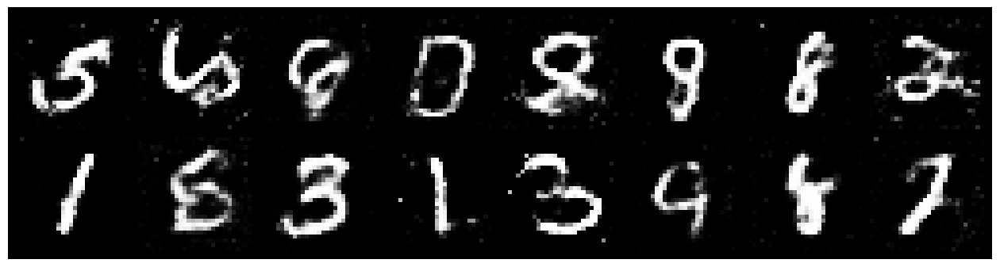

Epoch: [179/200], Batch Num: [300/600]
Discriminator Loss: 1.2476, Generator Loss: 0.8429
D(x): 0.5488, D(G(z)): 0.4296


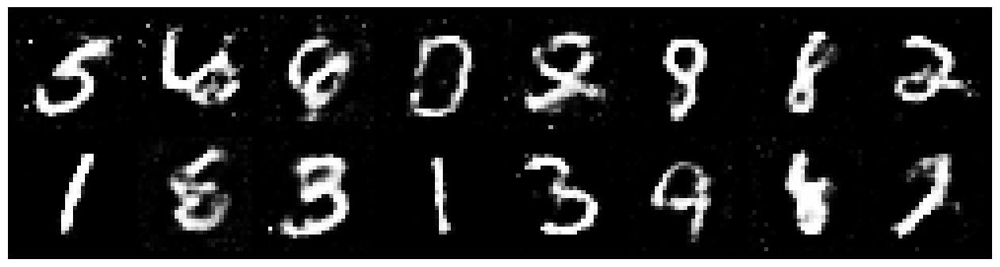

Epoch: [180/200], Batch Num: [0/600]
Discriminator Loss: 1.2742, Generator Loss: 0.8336
D(x): 0.5592, D(G(z)): 0.4433


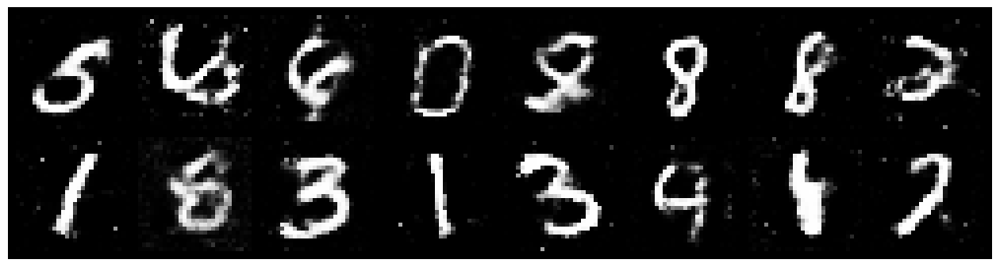

Epoch: [180/200], Batch Num: [300/600]
Discriminator Loss: 1.3060, Generator Loss: 0.7786
D(x): 0.5254, D(G(z)): 0.4385


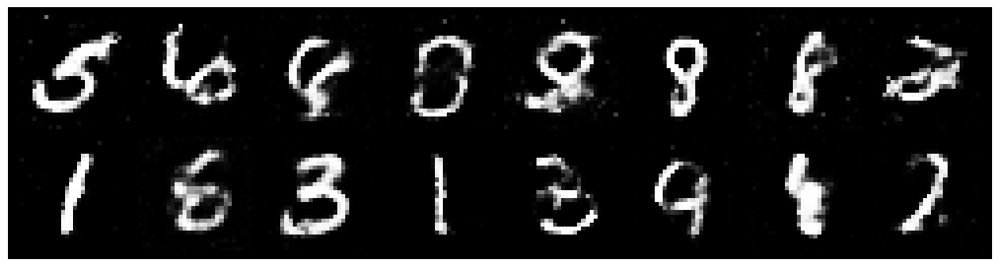

Epoch: [181/200], Batch Num: [0/600]
Discriminator Loss: 1.3674, Generator Loss: 0.9881
D(x): 0.5437, D(G(z)): 0.4601


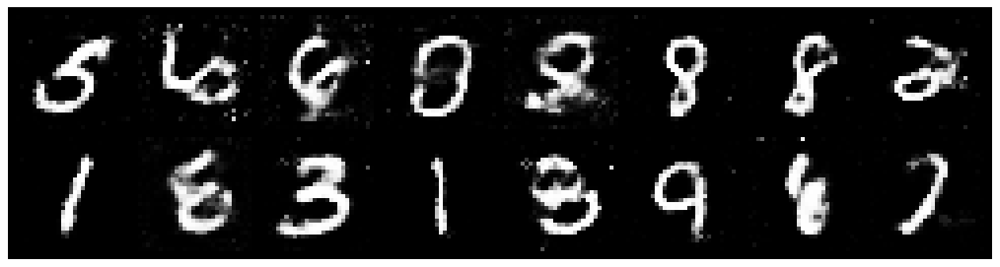

Epoch: [181/200], Batch Num: [300/600]
Discriminator Loss: 1.3722, Generator Loss: 0.9303
D(x): 0.5528, D(G(z)): 0.4907


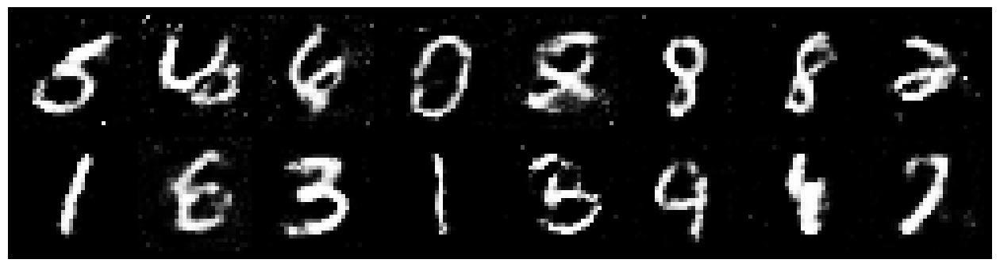

Epoch: [182/200], Batch Num: [0/600]
Discriminator Loss: 1.3037, Generator Loss: 0.7374
D(x): 0.5495, D(G(z)): 0.4649


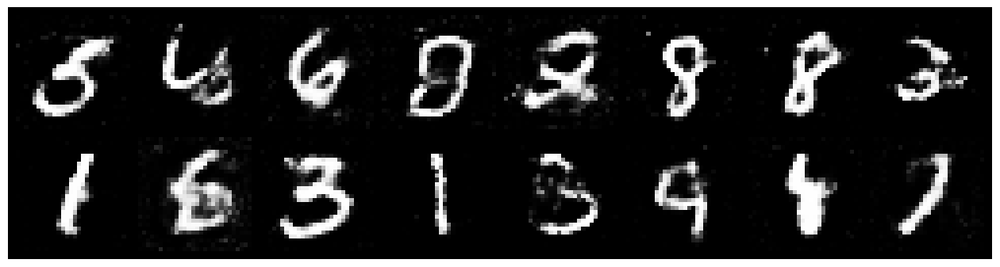

Epoch: [182/200], Batch Num: [300/600]
Discriminator Loss: 1.1977, Generator Loss: 0.9908
D(x): 0.5730, D(G(z)): 0.4152


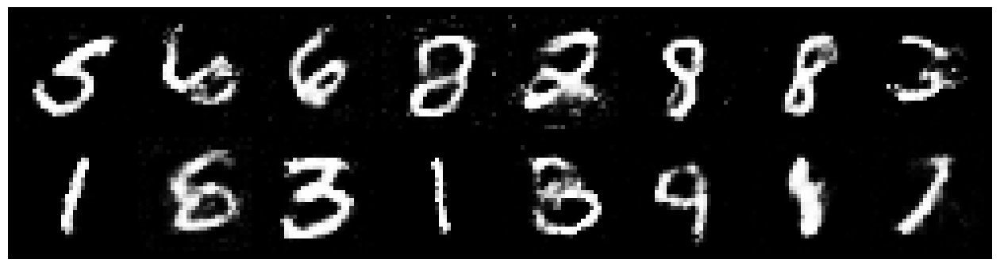

Epoch: [183/200], Batch Num: [0/600]
Discriminator Loss: 1.2751, Generator Loss: 0.8452
D(x): 0.5239, D(G(z)): 0.4356


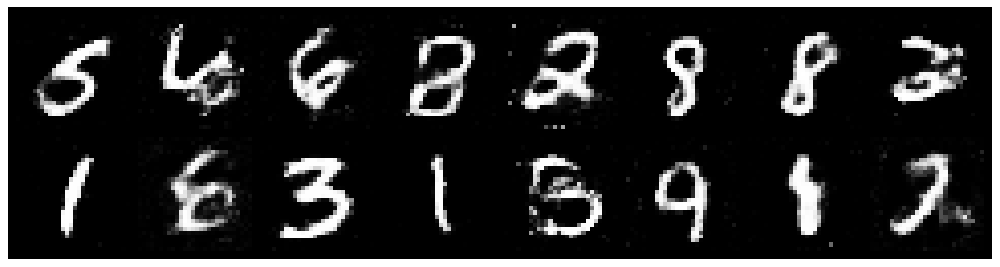

Epoch: [183/200], Batch Num: [300/600]
Discriminator Loss: 1.2981, Generator Loss: 0.9142
D(x): 0.5331, D(G(z)): 0.4218


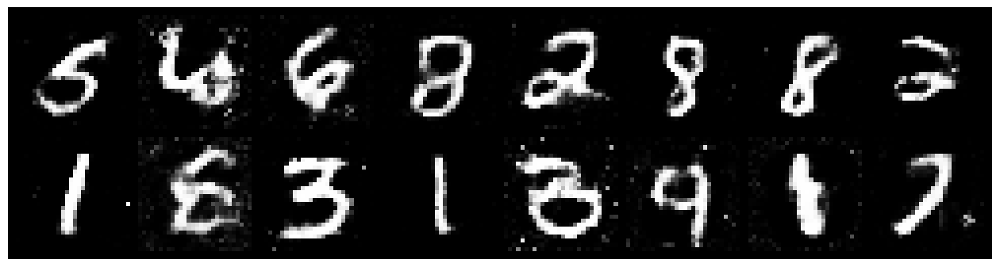

Epoch: [184/200], Batch Num: [0/600]
Discriminator Loss: 1.2371, Generator Loss: 0.8744
D(x): 0.5725, D(G(z)): 0.4425


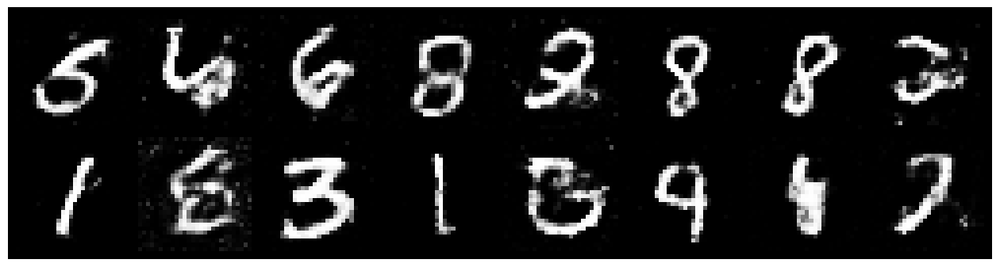

Epoch: [184/200], Batch Num: [300/600]
Discriminator Loss: 1.2291, Generator Loss: 0.8835
D(x): 0.5306, D(G(z)): 0.4150


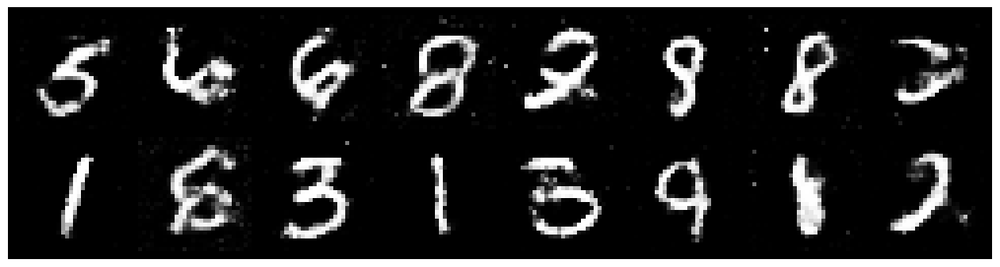

Epoch: [185/200], Batch Num: [0/600]
Discriminator Loss: 1.2090, Generator Loss: 0.8732
D(x): 0.5666, D(G(z)): 0.4329


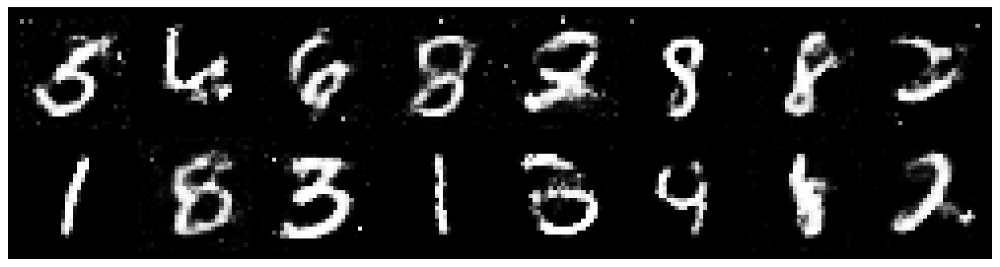

Epoch: [185/200], Batch Num: [300/600]
Discriminator Loss: 1.2912, Generator Loss: 0.8496
D(x): 0.5628, D(G(z)): 0.4711


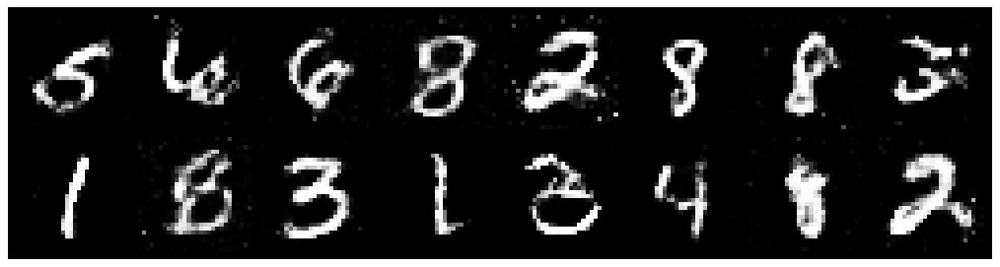

Epoch: [186/200], Batch Num: [0/600]
Discriminator Loss: 1.3435, Generator Loss: 0.8089
D(x): 0.5383, D(G(z)): 0.4806


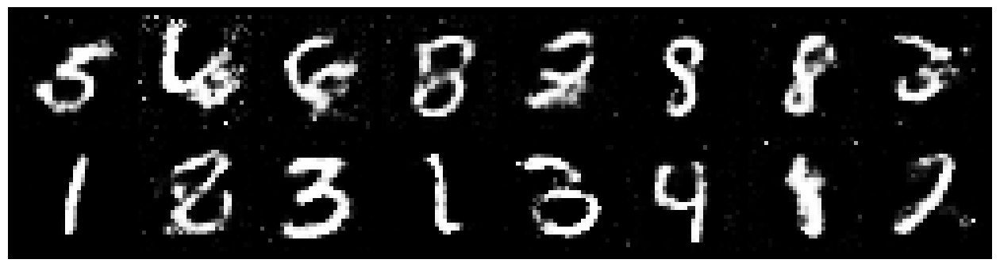

Epoch: [186/200], Batch Num: [300/600]
Discriminator Loss: 1.2653, Generator Loss: 1.0362
D(x): 0.5467, D(G(z)): 0.4326


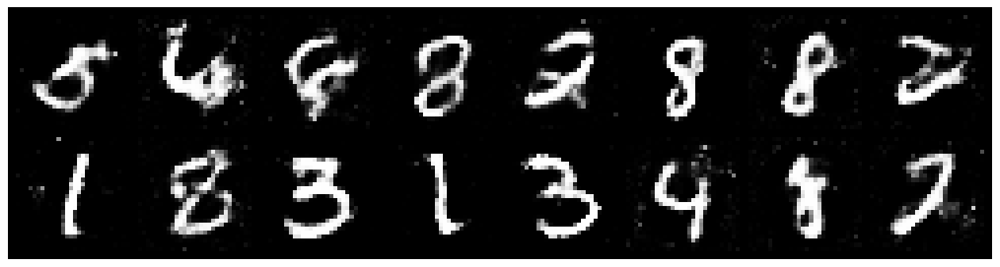

Epoch: [187/200], Batch Num: [0/600]
Discriminator Loss: 1.3021, Generator Loss: 0.9226
D(x): 0.5371, D(G(z)): 0.4449


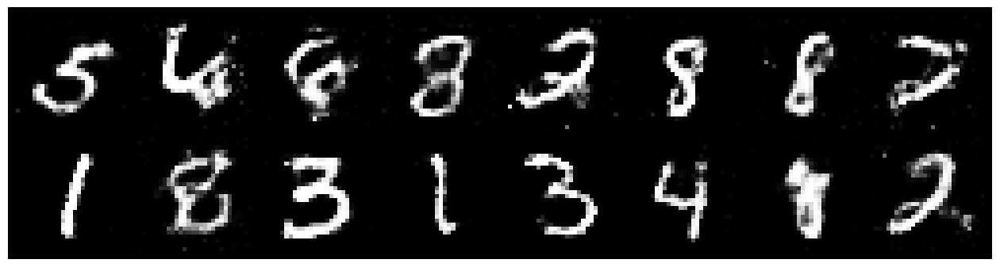

Epoch: [187/200], Batch Num: [300/600]
Discriminator Loss: 1.2993, Generator Loss: 0.8477
D(x): 0.5369, D(G(z)): 0.4516


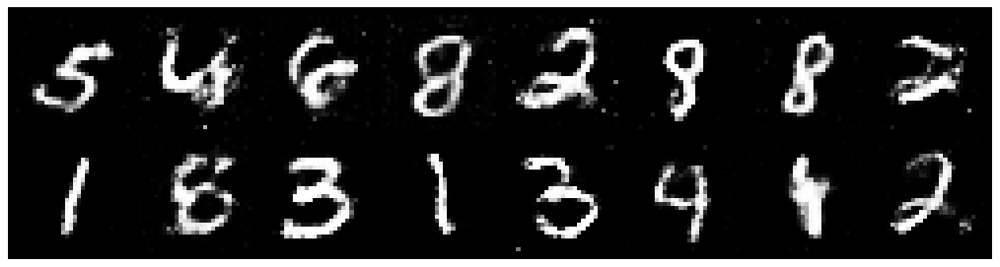

Epoch: [188/200], Batch Num: [0/600]
Discriminator Loss: 1.3119, Generator Loss: 0.7946
D(x): 0.5391, D(G(z)): 0.4659


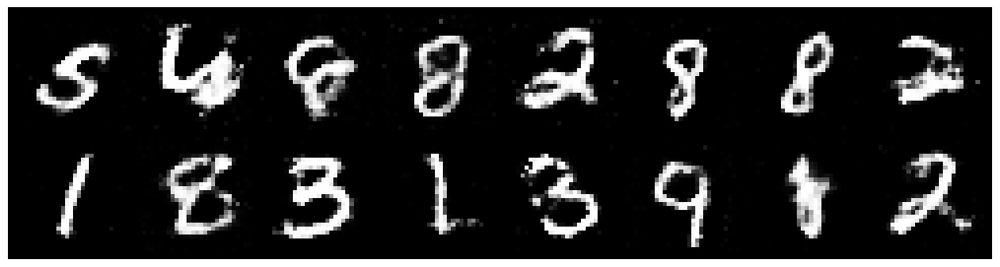

Epoch: [188/200], Batch Num: [300/600]
Discriminator Loss: 1.3035, Generator Loss: 0.8648
D(x): 0.5872, D(G(z)): 0.4851


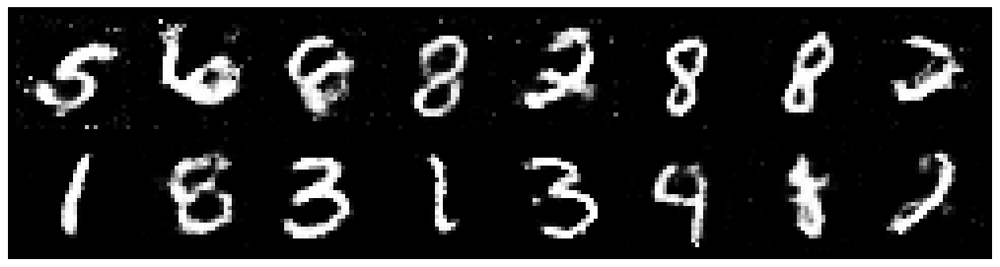

Epoch: [189/200], Batch Num: [0/600]
Discriminator Loss: 1.3105, Generator Loss: 0.7863
D(x): 0.5388, D(G(z)): 0.4711


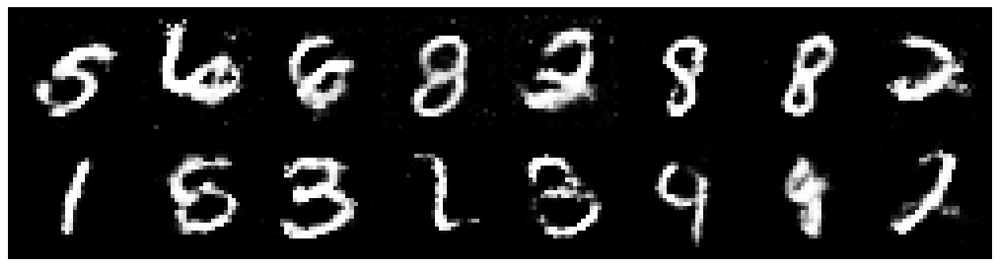

Epoch: [189/200], Batch Num: [300/600]
Discriminator Loss: 1.2663, Generator Loss: 0.8157
D(x): 0.5661, D(G(z)): 0.4641


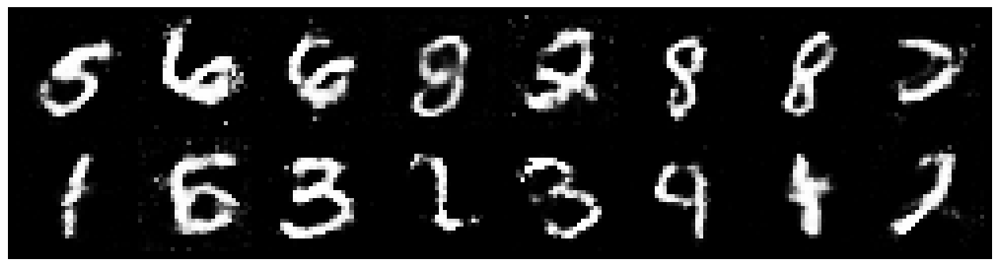

Epoch: [190/200], Batch Num: [0/600]
Discriminator Loss: 1.2606, Generator Loss: 0.8907
D(x): 0.5685, D(G(z)): 0.4635


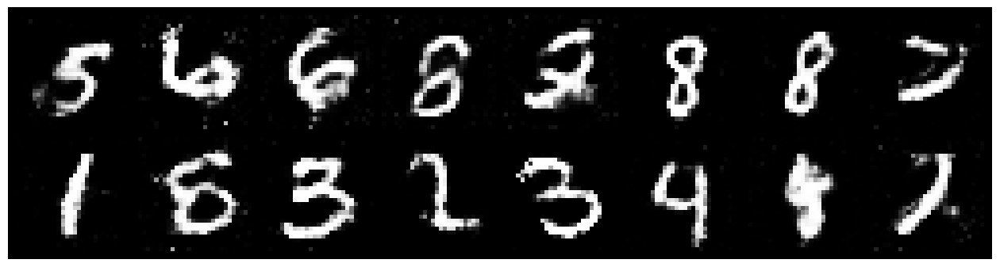

Epoch: [190/200], Batch Num: [300/600]
Discriminator Loss: 1.2522, Generator Loss: 0.8147
D(x): 0.5667, D(G(z)): 0.4468


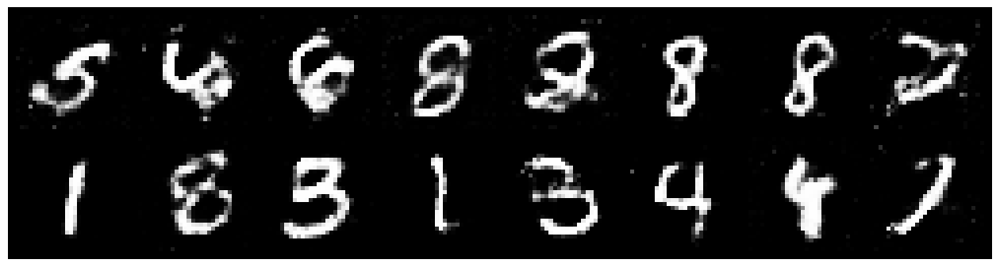

Epoch: [191/200], Batch Num: [0/600]
Discriminator Loss: 1.2229, Generator Loss: 0.9149
D(x): 0.5671, D(G(z)): 0.4228


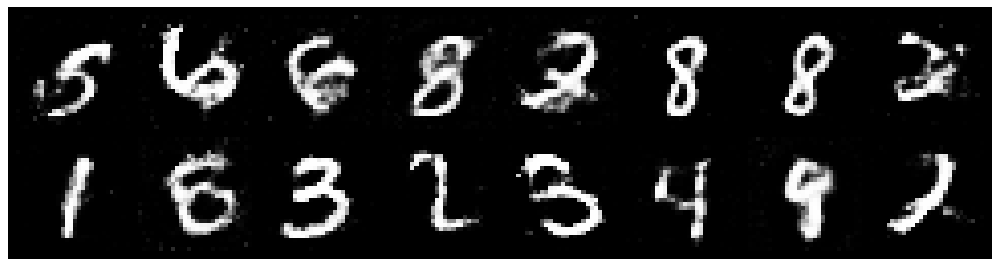

Epoch: [191/200], Batch Num: [300/600]
Discriminator Loss: 1.4081, Generator Loss: 0.8998
D(x): 0.5296, D(G(z)): 0.4877


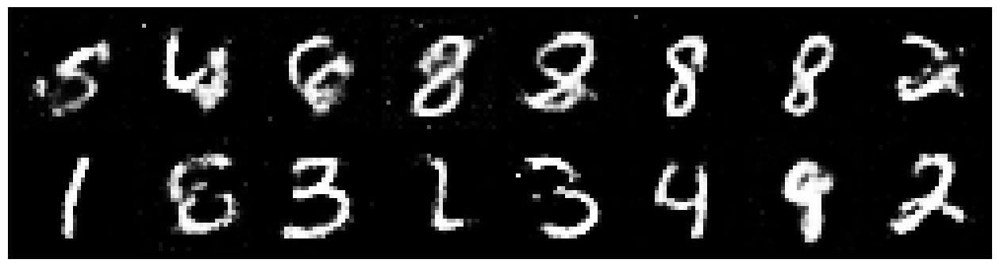

Epoch: [192/200], Batch Num: [0/600]
Discriminator Loss: 1.3823, Generator Loss: 0.8575
D(x): 0.5026, D(G(z)): 0.4533


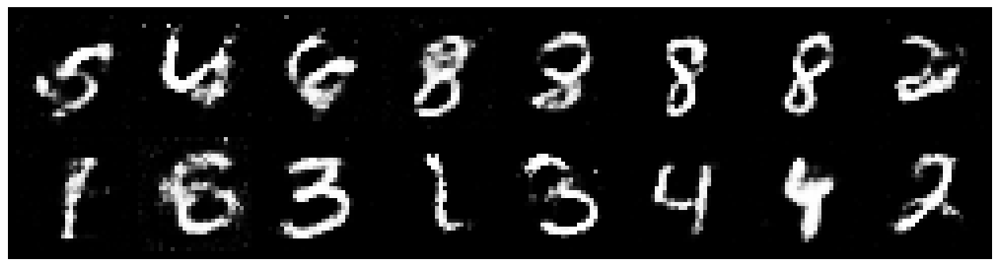

Epoch: [192/200], Batch Num: [300/600]
Discriminator Loss: 1.3281, Generator Loss: 0.8678
D(x): 0.5236, D(G(z)): 0.4624


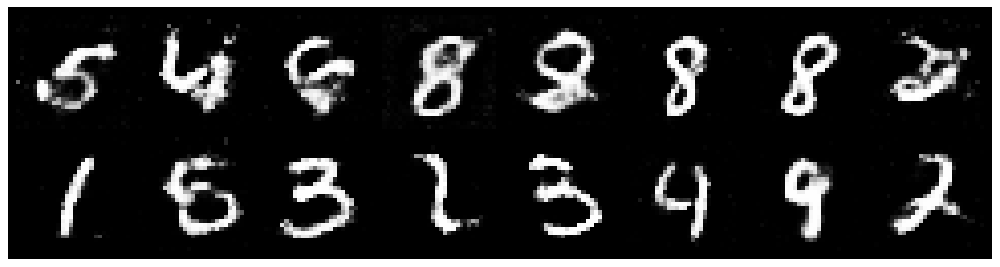

Epoch: [193/200], Batch Num: [0/600]
Discriminator Loss: 1.2885, Generator Loss: 0.8102
D(x): 0.5999, D(G(z)): 0.4920


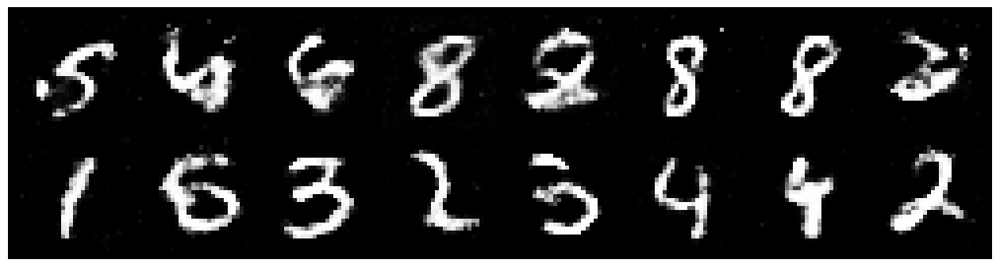

Epoch: [193/200], Batch Num: [300/600]
Discriminator Loss: 1.2778, Generator Loss: 0.8974
D(x): 0.5318, D(G(z)): 0.4102


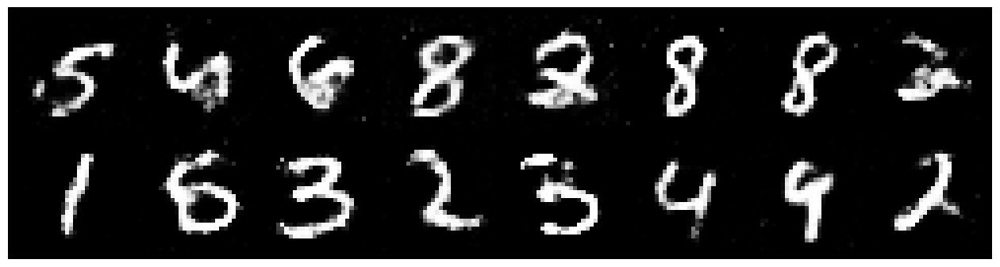

Epoch: [194/200], Batch Num: [0/600]
Discriminator Loss: 1.2335, Generator Loss: 0.8052
D(x): 0.5673, D(G(z)): 0.4589


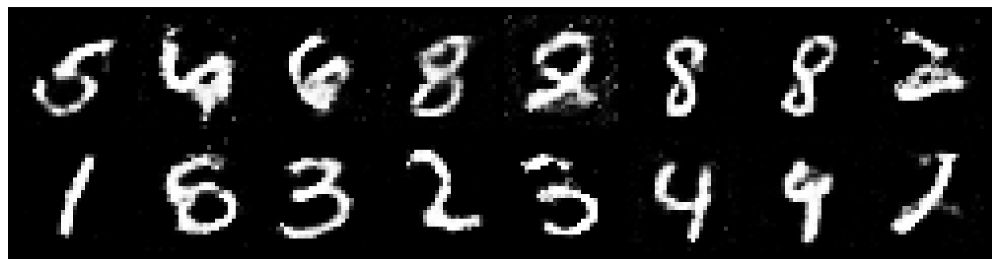

Epoch: [194/200], Batch Num: [300/600]
Discriminator Loss: 1.2005, Generator Loss: 0.9274
D(x): 0.5771, D(G(z)): 0.4239


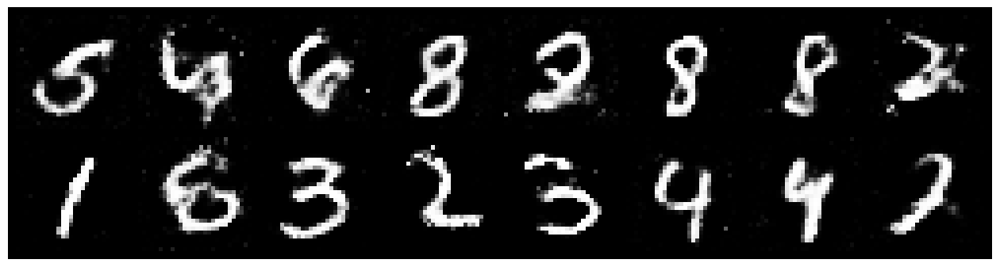

Epoch: [195/200], Batch Num: [0/600]
Discriminator Loss: 1.1910, Generator Loss: 0.9227
D(x): 0.5790, D(G(z)): 0.4400


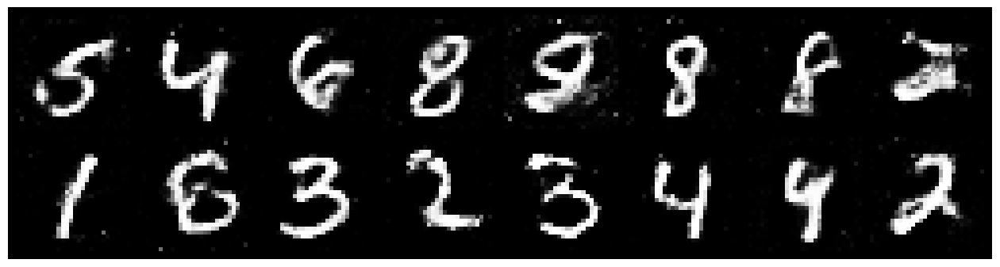

Epoch: [195/200], Batch Num: [300/600]
Discriminator Loss: 1.2617, Generator Loss: 0.8431
D(x): 0.5488, D(G(z)): 0.4481


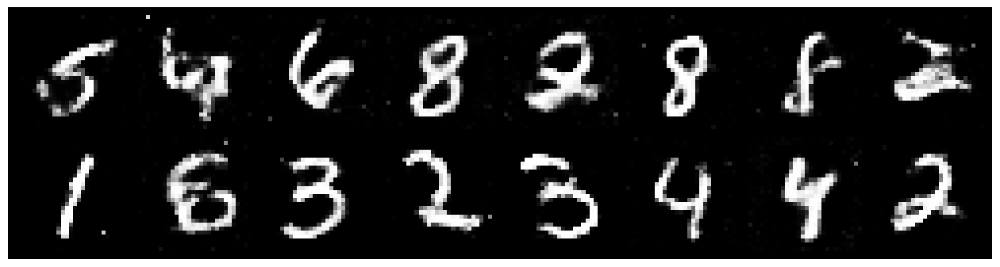

Epoch: [196/200], Batch Num: [0/600]
Discriminator Loss: 1.2818, Generator Loss: 0.8505
D(x): 0.5552, D(G(z)): 0.4595


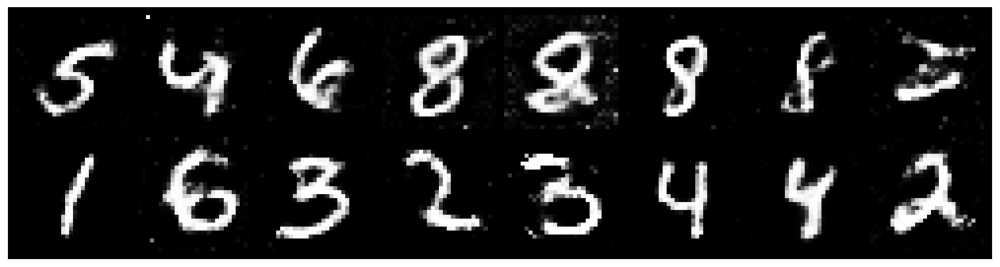

Epoch: [196/200], Batch Num: [300/600]
Discriminator Loss: 1.3467, Generator Loss: 0.8326
D(x): 0.5255, D(G(z)): 0.4692


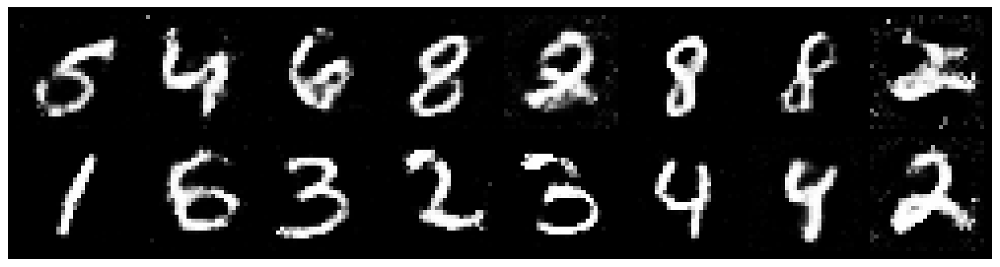

Epoch: [197/200], Batch Num: [0/600]
Discriminator Loss: 1.2781, Generator Loss: 0.8992
D(x): 0.5419, D(G(z)): 0.4444


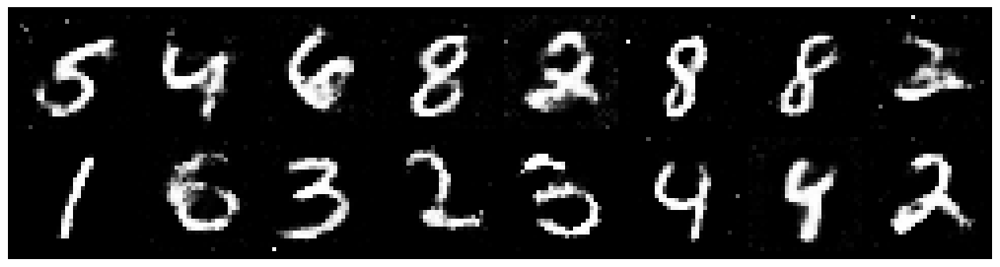

Epoch: [197/200], Batch Num: [300/600]
Discriminator Loss: 1.2590, Generator Loss: 0.8946
D(x): 0.5536, D(G(z)): 0.4393


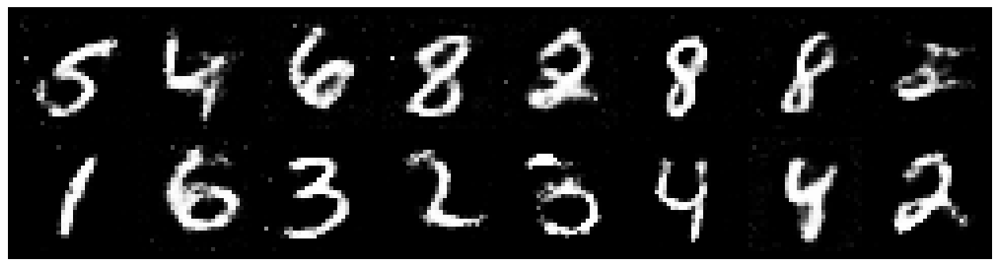

Epoch: [198/200], Batch Num: [0/600]
Discriminator Loss: 1.2940, Generator Loss: 0.8710
D(x): 0.5292, D(G(z)): 0.4408


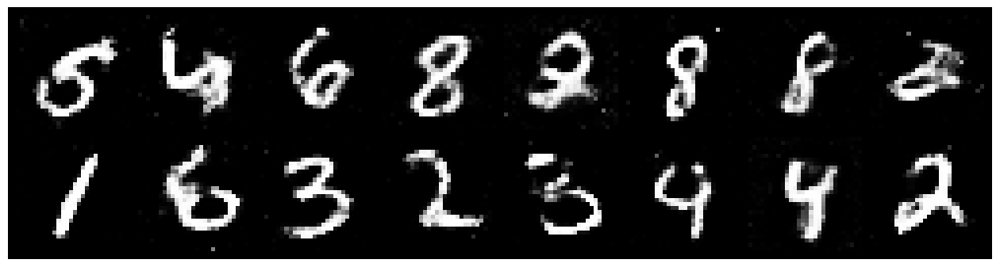

Epoch: [198/200], Batch Num: [300/600]
Discriminator Loss: 1.2522, Generator Loss: 0.8742
D(x): 0.5596, D(G(z)): 0.4485


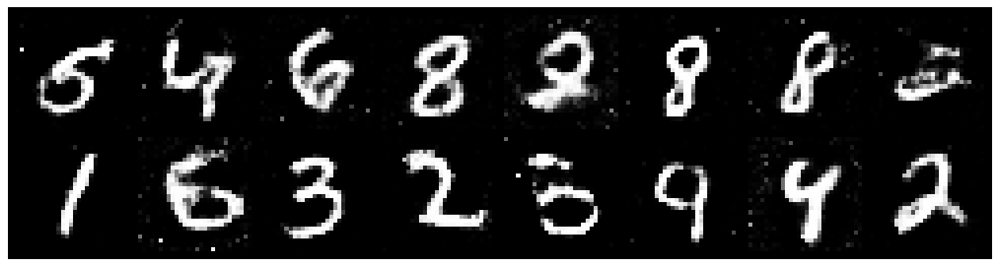

Epoch: [199/200], Batch Num: [0/600]
Discriminator Loss: 1.3048, Generator Loss: 0.9884
D(x): 0.5425, D(G(z)): 0.4412


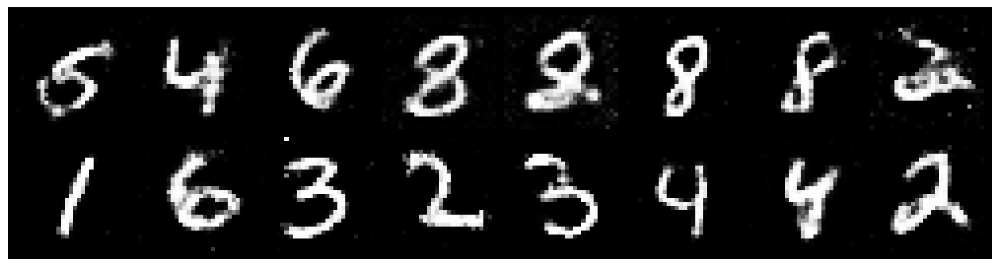

Epoch: [199/200], Batch Num: [300/600]
Discriminator Loss: 1.2196, Generator Loss: 0.9249
D(x): 0.5520, D(G(z)): 0.4322


In [8]:
num_test_samples = 16
test_noise = noise(num_test_samples).to(device)
logger = Logger(model_name='VGAN', data_name='MNIST')
num_epochs = 200
for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
        # 1. Train Discriminator
        real_data = Variable(images_to_vectors(real_batch)).to(device)
        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N).to(device)).detach()
        # Train D
        d_error, d_pred_real, d_pred_fake = \
              train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        # Generate fake data
        fake_data = generator(noise(N).to(device))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)
        # Display Progress every few batches
        if (n_batch) % 300 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )

In [9]:
# Save generator
torch.save(generator.state_dict(), 'generator.pth')

# Save discriminator
torch.save(discriminator.state_dict(), 'discriminator.pth')


In [ ]:
# Load generator
generator.load_state_dict(torch.load('generator.pth'))
generator.eval()  # Optional: switch to evaluation mode

# Load discriminator
discriminator.load_state_dict(torch.load('discriminator.pth'))
discriminator.eval()
